# Python AI Project with Earthquake Dataset



---


dataset location: https://www.kaggle.com/datasets/serhatk/turkey-20-years-earthquakes-csv




In [1]:
#import os
#print(os.getcwd())

### I. Importing Libraries

In the beginning in Anaconda Prompt(cmd) we install the libraries to our environment(myenv):
conda create --name myenv
conda activate myenv
conda install pandas numpy matplotlib scikit-learn seaborn tensorflow keras xgboost folium geopandas
conda install -c conda-forge geopy      # for coordinates
conda install -c conda-forge basemap    # for maps
conda install -c conda-forge tabulate   # for printing tables
conda install -c conda-forge ffmpeg     # for writing to mp4 file
conda install --channel conda-forge geopandas  # first tried this one after conda install geopandas gave error
pip install geopandas  #  because 'conda install --channel conda-forge geopandas' wasn't successful, I installed with this code
pip install scikeras      # for kerasregressor


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, neighbors
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score


#conda install pandas numpy matplotlib scikit-learn seaborn tensorflow
#conda install -c conda-forge geopy
#https://anaconda.org/conda-forge/geopy/
#$ conda install numpy scipy pandas matplotlib sympy cython seaborn spyder-kernels pyarrow


In [3]:
# for google colab:
# from google.colab import drive
# drive.mount('/content/drive')

## II. Data Preprocessing

### Getting dataset into Pandas dataframe

In [4]:
# !pwd

In [5]:
dataset_path = 'TREarthquake\eq20.csv' # https://medium.com/geekculture/how-to-load-a-dataset-from-the-google-drive-to-google-colab-67d0478bc634#:~:text=Loading%20a%20Dataset%20from%20the%20Google%20Drive%20to%20Google%20Colab&text=Click%20the%20link%20given.,keys%20for%20your%20google%20drive.&text=Now%20add%20it%20in%20the%20early%20appeared%20shell%20and%20press%20enter.&text=Now%20your%20google%20drive%20is%20mounted.
df = pd.read_csv(dataset_path, encoding="utf_16", on_bad_lines="skip")  #ref: fixing the unicode error; https://www.kaggle.com/code/fatihsen20/fixing-the-unicode-error/notebook
#dataset_path = 'https://www.kaggle.com/datasets/serhatk/turkey-20-years-earthquakes-csv'
df.head()

,ID,DATE_,LOCATION_,LAT,LNG,MAG,DEPTH,RECORDDATE
0,1,2005-01-01 00:29:42,KORKUTELi (ANTALYA),36.9197,30.3133,2.9,30.0,2023-02-27 15:01:52.367000000
1,2,2005-01-01 03:03:40,YUNAK (KONYA),38.8177,31.8875,3.5,5.8,2023-02-27 15:01:52.367000000
2,3,2005-01-01 04:40:14,AKDENiZ,36.1153,28.4915,3.5,74.5,2023-02-27 15:01:52.367000000
3,4,2005-01-01 09:35:00,CUBUK (ANKARA),40.3485,32.9603,3.0,15.1,2023-02-27 15:01:52.367000000
4,5,2005-01-01 11:17:43,MENEMEN (iZMiR),38.8013,27.2075,2.9,28.3,2023-02-27 15:01:52.367000000


In [ ]:
# Get the number of data points (rows) in the dataset
num_data_points = df.shape[0]

print(f"Number of data points: {num_data_points}")

Number of data points: 284583

In [6]:
df.shape

(284583, 8)

In [403]:
df.columns

Index(['ID', 'DATE_', 'LOCATION_', 'LAT', 'LNG', 'MAG', 'DEPTH', 'RECORDDATE'], dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284583 entries, 0 to 284582
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   ID          284583 non-null  int64  
 1   DATE_       284583 non-null  object 
 2   LOCATION_   284583 non-null  object 
 3   LAT         284583 non-null  float64
 4   LNG         284583 non-null  float64
 5   MAG         284583 non-null  float64
 6   DEPTH       284583 non-null  float64
 7   RECORDDATE  284583 non-null  object 
dtypes: float64(4), int64(1), object(3)
memory usage: 17.4+ MB


In [8]:
df.describe()

,ID,LAT,LNG,MAG,DEPTH
count,284583.00000,284583.000000,284583.000000,284583.000000,284583.000000
mean,142307.37614,38.234964,31.376644,2.212529,9.774072
std,82165.78967,1.478462,5.534374,0.666044,10.137096
min,1.00000,30.288700,18.343500,0.100000,0.000000
25%,71146.50000,37.078500,27.400700,1.700000,5.000000
50%,142303.00000,38.309500,28.804700,2.100000,7.300000
75%,213469.50000,39.233000,35.924300,2.700000,12.000000
max,284615.00000,45.809300,48.572500,7.600000,188.000000


In [9]:
df.isnull().sum() 

ID            0
DATE_         0
LOCATION_     0
LAT           0
LNG           0
MAG           0
DEPTH         0
RECORDDATE    0
dtype: int64

### Data visualisations:

Histograms

In [405]:
import matplotlib.pyplot as plt

# Create and save the histogram of earthquake magnitudes
plt.figure(figsize=(10, 6))
plt.hist(df['MAG'], bins=20, color='blue', alpha=0.7)
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.title('Histogram of Earthquake Magnitudes')
plt.grid(True)
plt.savefig('magnitude_histogram.png')
plt.close()

# Create and save the depth distribution visualization
plt.figure(figsize=(10, 6))
plt.hist(df['DEPTH'], bins=20, color='orange', alpha=0.7)
plt.xlabel('Depth')
plt.ylabel('Frequency')
plt.title('Depth Distribution of Earthquakes')
plt.grid(True)
plt.savefig('depth_distribution.png')
plt.close()

# Create and save the geographic distribution map
plt.figure(figsize=(10, 6))
plt.scatter(df['LNG'], df['LAT'], c=df['MAG'], cmap='coolwarm', alpha=0.5)
plt.colorbar(label='Magnitude')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Geographic Distribution of Earthquakes')
plt.grid(True)
plt.savefig('geographic_distribution.png')
plt.close()


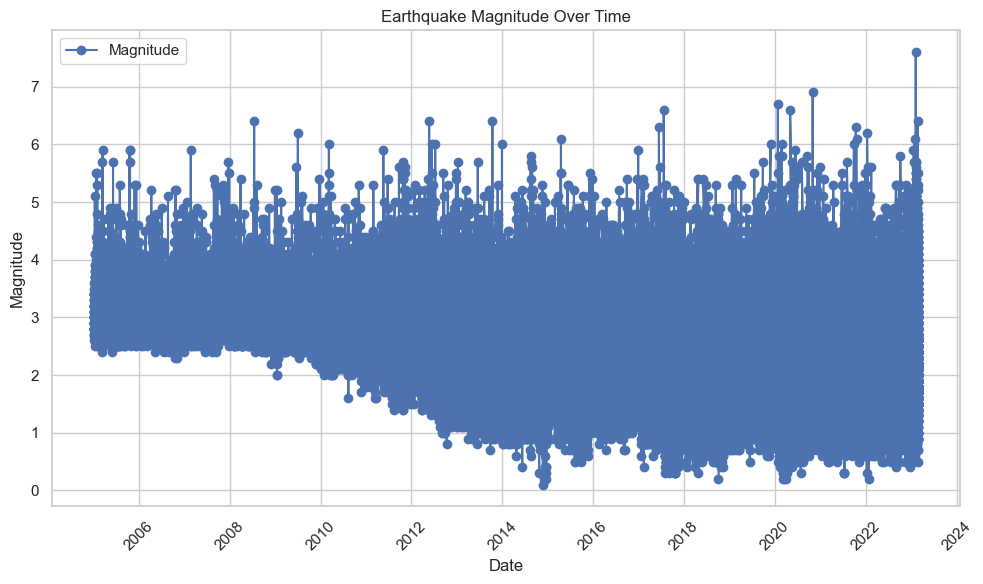

In [407]:
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(10, 6))

# Plotting the time series graph
plt.plot(df['DATE_'], df['MAG'], marker='o', linestyle='-', color='b', label='Magnitude')

# Adding labels and title
plt.xlabel('Date')
plt.ylabel('Magnitude')
plt.title('Earthquake Magnitude Over Time')

# Adding legend
plt.legend()

# Rotating x-axis labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.savefig('MAG_over_time.png')
plt.show()


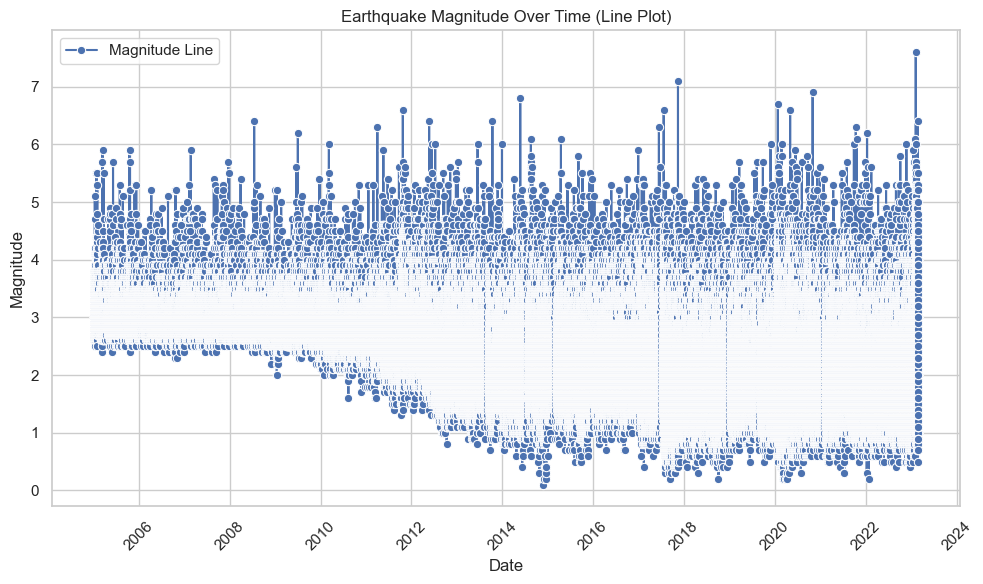

In [421]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd



# Set the Seaborn style
sns.set(style="whitegrid")

# Set the figure size
plt.figure(figsize=(10, 6))

# Create a line plot using Seaborn
sns.lineplot(x='DATE_', y='MAG', data=data, marker='o', label='Magnitude Line')

# Adding labels and title
plt.xlabel('Date')
plt.ylabel('Magnitude')
plt.title('Earthquake Magnitude Over Time (Line Plot)')

# Adding legend
plt.legend()

# Rotating x-axis labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.savefig('MAG_over_time_line.png')
plt.show()


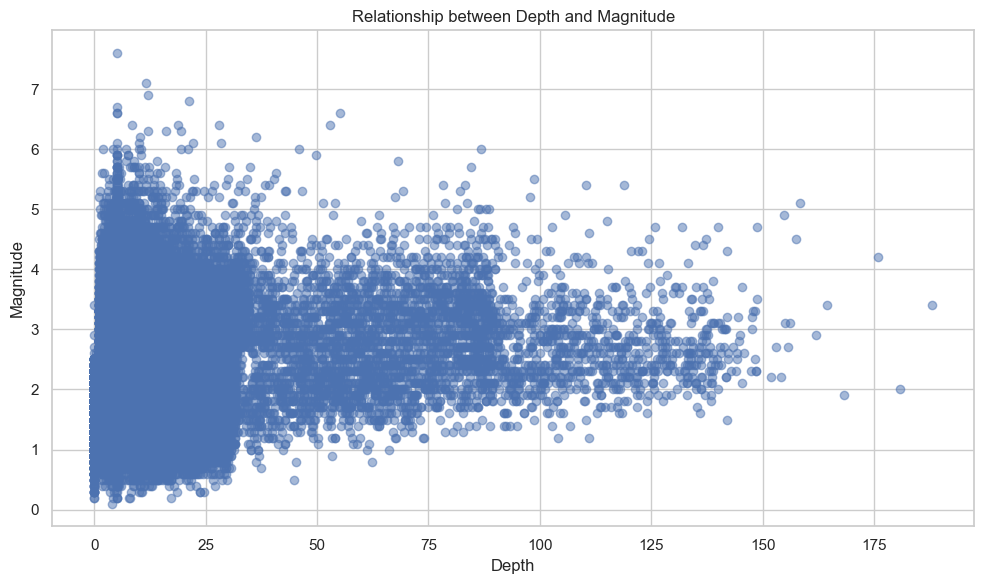

In [417]:
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(10, 6))

# Creating a scatter plot
plt.scatter(data['DEPTH'], data['MAG'], color='b', alpha=0.5)

# Adding labels and title
plt.xlabel('Depth')
plt.ylabel('Magnitude')
plt.title('Relationship between Depth and Magnitude')

# Display the plot
plt.tight_layout()
plt.savefig('Depth_Magnitude_relationship.png')
plt.show()


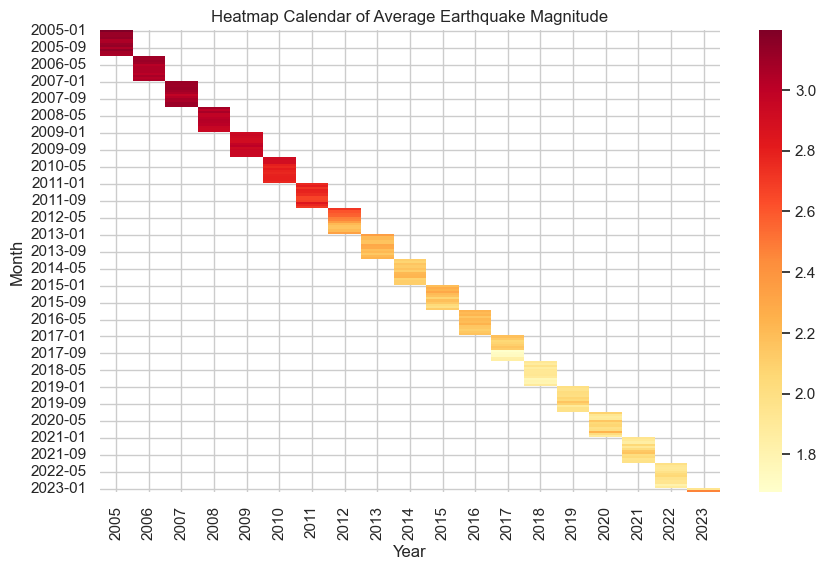

In [412]:
import seaborn as sns
import numpy as np

data = df = pd.read_csv(dataset_path, encoding="utf_16", on_bad_lines="skip")  #ref: fixing the unicode error; https://www.kaggle.com/code/fatihsen20/fixing-the-unicode-error/notebook
# Convert the 'DATE_' column to datetime format
data['DATE_'] = pd.to_datetime(data['DATE_'])

# Reshape the data for heatmap
data['Year'] = data['DATE_'].dt.year
heatmap_data = data.pivot_table(values='MAG', index='Month', columns='Year', aggfunc='mean')

# Create a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap='YlOrRd')
plt.title('Heatmap Calendar of Average Earthquake Magnitude')
plt.savefig('MAG_Heatmap_Calendar_of_Average_Earthquake.png')

plt.show()


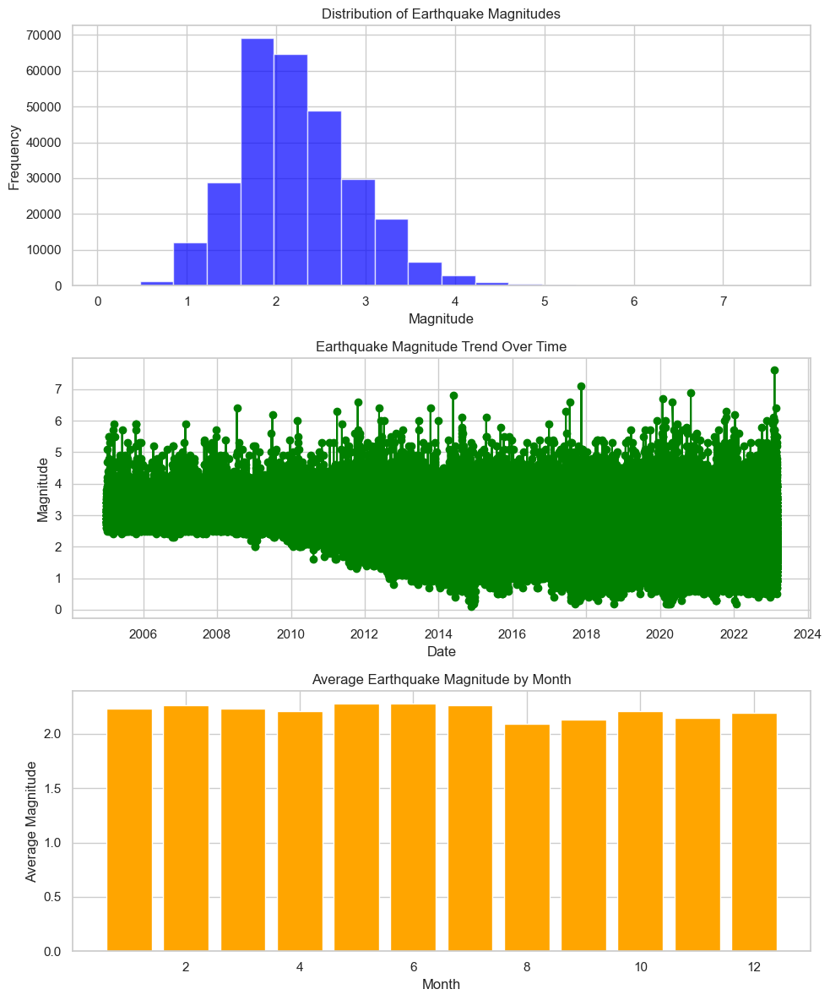

In [414]:
fig, axs = plt.subplots(3, 1, figsize=(10, 12))

# Distribution
axs[0].hist(data['MAG'], bins=20, color='blue', alpha=0.7)
axs[0].set_xlabel('Magnitude')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Distribution of Earthquake Magnitudes')

# Trend
axs[1].plot(data['DATE_'], data['MAG'], marker='o', color='green')
axs[1].set_xlabel('Date')
axs[1].set_ylabel('Magnitude')
axs[1].set_title('Earthquake Magnitude Trend Over Time')

# Seasonality
monthly_avg = data.groupby(data['DATE_'].dt.month)['MAG'].mean()
axs[2].bar(monthly_avg.index, monthly_avg.values, color='orange')
axs[2].set_xlabel('Month')
axs[2].set_ylabel('Average Magnitude')
axs[2].set_title('Average Earthquake Magnitude by Month')

plt.tight_layout()
plt.show()


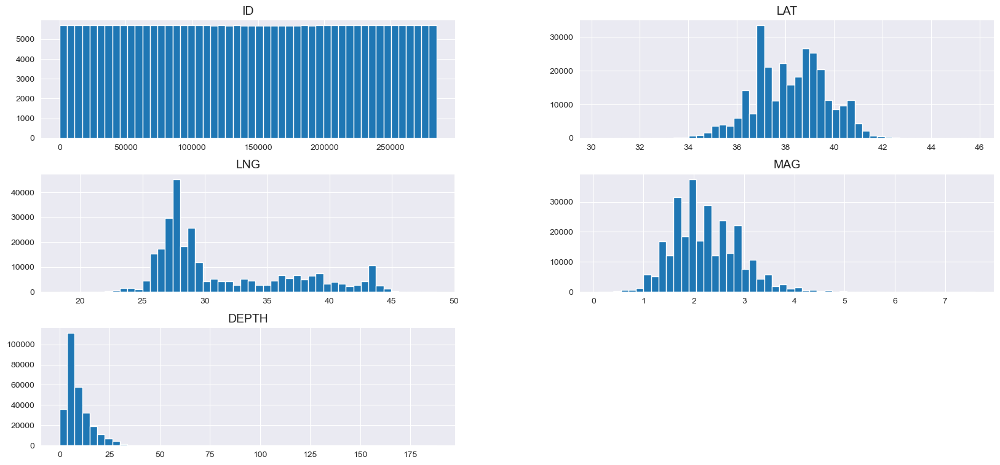

In [10]:
# (ref:https://github.com/ageron/handson-ml3/blob/main/02_end_to_end_machine_learning_project.ipynb)
plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

df.hist(bins=50, figsize=(20, 9))
plt.show()

<Figure size 2300x1100 with 0 Axes>

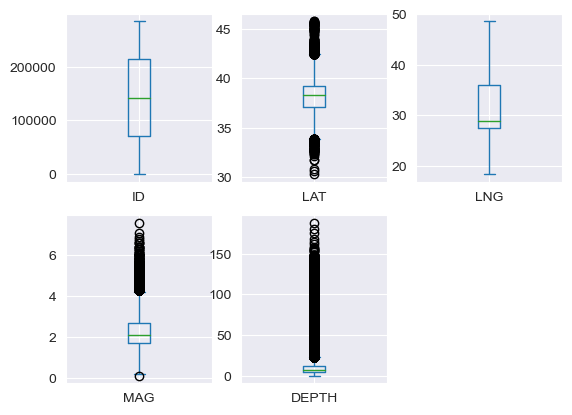

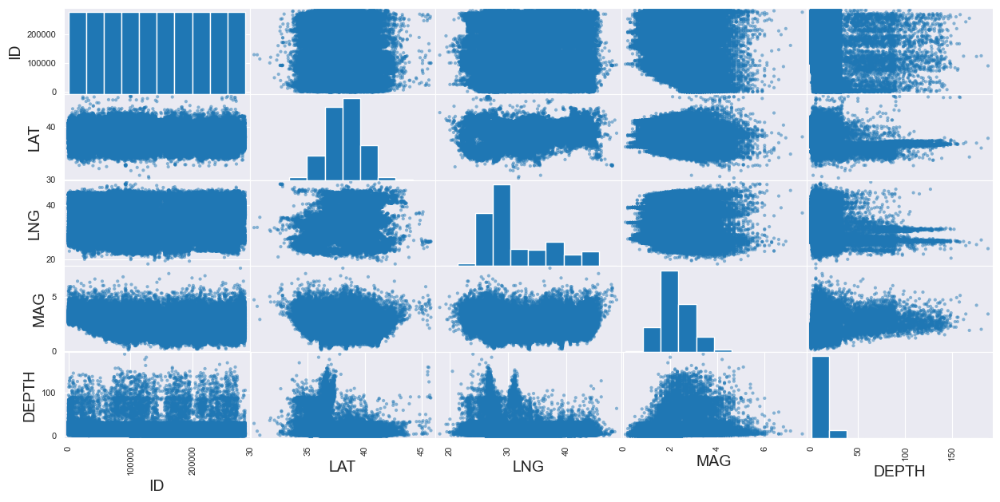

In [11]:
# ref:https://machinelearningmastery.com/machine-learning-in-python-step-by-step/
from pandas.plotting import scatter_matrix

plt.figure(figsize=(23, 11)) 

# box and whisker plots
df.plot(kind='box', subplots=True, layout=(2,3), sharex=False, sharey=False)
plt.show()

# scatter plot matrix
scatter_matrix(df, figsize=(15, 7))
plt.show()

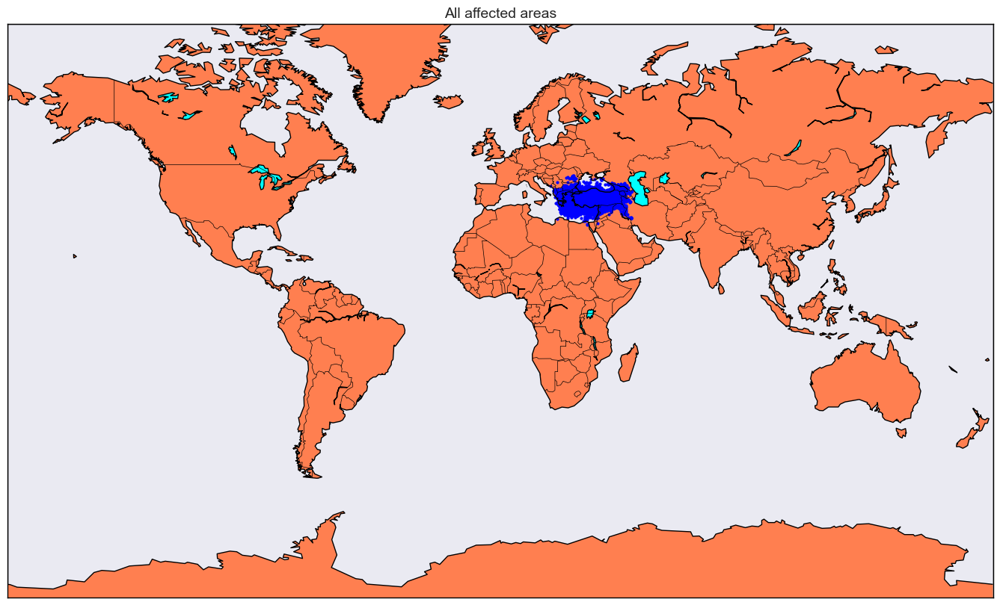

In [12]:
# (ref: https://gist.githubusercontent.com/amankharwal/b0064f6749d1ca82209840fdddccaa33/raw/93520b1131399072b939a9967ee84caf799ee16b/earthquake.py):

from mpl_toolkits.basemap import Basemap
import cartopy.crs as ccrs
import cartopy

#ax = plt.axes(projection=ccrs.PlateCarree())
#ax.set_extent([-180, 180, -80, 80], crs=ccrs.PlateCarree())



m = Basemap(projection='mill',llcrnrlat=-80,urcrnrlat=80, llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')

longitudes = df["LNG"].tolist()
latitudes = df["LAT"].tolist()
#m = Basemap(width=12000000,height=9000000,projection='lcc',
            #resolution=None,lat_1=80.,lat_2=55,lat_0=80,lon_0=-107.)
x,y = m(longitudes,latitudes)

fig = plt.figure(figsize=(17,11))
plt.title("All affected areas")
#ax.coastlines()


m.plot(x, y, "o", markersize = 2, color = 'blue')
m.drawcoastlines()
m.fillcontinents(color='coral',lake_color='aqua')
m.drawmapboundary()
m.drawcountries()

# Plot the data on the map
#ax.plot(df["LNG"], df["LAT"], "o", markersize=2, color='blue', transform=ccrs.PlateCarree())

plt.show()

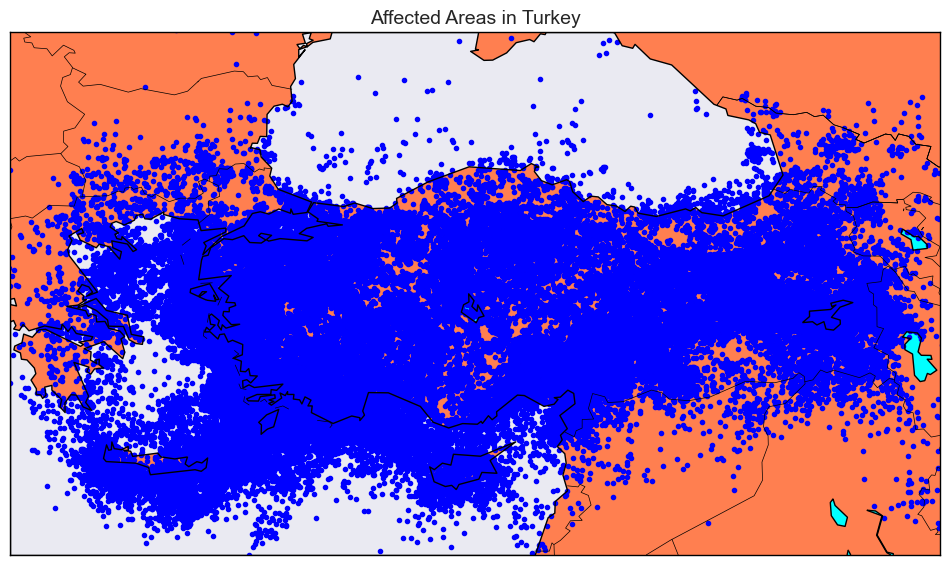

In [13]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

# Create a Basemap object
m = Basemap(projection='mill', llcrnrlat=33, urcrnrlat=45, llcrnrlon=21, urcrnrlon=46, resolution='l')

# Convert coordinates to map projection
longitudes = df["LNG"].tolist()
latitudes = df["LAT"].tolist()
x, y = m(longitudes, latitudes)

# Plot the map
fig = plt.figure(figsize=(12, 10))
plt.title("Affected Areas in Turkey")
m.plot(x, y, "o", markersize=3, color='blue')
m.drawcoastlines()
m.fillcontinents(color='coral', lake_color='aqua')
m.drawmapboundary()
m.drawcountries()

plt.show()


### Simulating missing data

In [14]:
np.random.seed(42) #setting a random seed to simulate missing data randomly
percentage_missing = 0.05  #missing data percentage %5


In [15]:
#making a random mask for values to be chosen for missing:
random_mask = np.random.random(df.shape) < percentage_missing
#To set selected values as missing and replace them with NaN:
df[random_mask] = np.nan

In [16]:
print(df.isnull().sum())

ID            14138
DATE_         14189
LOCATION_     14282
LAT           14412
LNG           14041
MAG           14049
DEPTH         14316
RECORDDATE    14206
dtype: int64


Now we have %5 percent null NaN values

### Handling Missing Data

#### Handle missing MAG values

In [17]:
print(df.isnull().sum())

ID            14138
DATE_         14189
LOCATION_     14282
LAT           14412
LNG           14041
MAG           14049
DEPTH         14316
RECORDDATE    14206
dtype: int64


In [18]:
%%time
df.dropna(subset=['MAG'], inplace=True)
# df['MAG'] = df['MAG'].interpolate(method='polynomial', order=5)

CPU times: total: 31.2 ms
Wall time: 13 ms


#### Handle Missing DATE values

Drop rows with missing DATE's:

In [19]:
%%time
df.dropna(subset=['DATE_'], inplace=True)
print(df.isnull().sum())
df.info()

ID            12748
DATE_             0
LOCATION_     12928
LAT           13034
LNG           12704
MAG               0
DEPTH         12944
RECORDDATE    12813
dtype: int64
<class 'pandas.core.frame.DataFrame'>
Index: 257023 entries, 0 to 284582
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   ID          244275 non-null  float64
 1   DATE_       257023 non-null  object 
 2   LOCATION_   244095 non-null  object 
 3   LAT         243989 non-null  float64
 4   LNG         244319 non-null  float64
 5   MAG         257023 non-null  float64
 6   DEPTH       244079 non-null  float64
 7   RECORDDATE  244210 non-null  object 
dtypes: float64(5), object(3)
memory usage: 17.6+ MB
CPU times: total: 78.1 ms
Wall time: 75.1 ms


Convert the DATE_ values to datetime format:

In [20]:
# Convert DATE_ values to datetime format:
df['DATE_'] = pd.to_datetime(df['DATE_'])

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 257023 entries, 0 to 284582
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   ID          244275 non-null  float64       
 1   DATE_       257023 non-null  datetime64[ns]
 2   LOCATION_   244095 non-null  object        
 3   LAT         243989 non-null  float64       
 4   LNG         244319 non-null  float64       
 5   MAG         257023 non-null  float64       
 6   DEPTH       244079 non-null  float64       
 7   RECORDDATE  244210 non-null  object        
dtypes: datetime64[ns](1), float64(5), object(2)
memory usage: 17.6+ MB


#### Handle missing LOCATION, LAT, and LNG values:


With nan LOCATION, LAT and LNG column values are interdependent on each other. So it would be good to create a var with location names depending on LAT and LNG:

In [22]:
location_data = df[['LOCATION_', 'LAT', 'LNG']].dropna().drop_duplicates()

In [23]:
location_data_dict = {}
for _, row in location_data.iterrows():
    location_data_dict[(row['LAT'], row['LNG'])] = row['LOCATION_']

Check any of three values are missing row by row, and if any look for it in location_data and fill the missing values accordingly:


In [24]:
def fill_missing_values_LOC_LAT_LNG(row):
    if row[['LOCATION_', 'LAT', 'LNG']].isna().any():
        location = row['LOCATION_']
        lat, lng = row['LAT'], row['LNG']
                
        if pd.notna(lat) and pd.notna(lng):
            if pd.isna(row['LOCATION_']):
                # Set location based on lat and lng
                subset = location_data_dict.get((lat, lng))
                if subset:
                    location = subset
        
        if pd.isna(lat) or pd.isna(lng):
            # Retrieve lat, lng based on location if available
            if pd.notna(location):
                for key, value in location_data_dict.items():
                    if value == location:
                        lat, lng = key
                        break

        
        # Update the missing values in the row
        row['LOCATION_'] = location if pd.isna(row['LOCATION_']) else row['LOCATION_']
        row['LAT'] = lat if pd.isna(row['LAT']) else row['LAT']
        row['LNG'] = lng if pd.isna(row['LNG']) else row['LNG']
        
    return row

In [25]:
def fill_missing_values_LOCgeocode_LAT_LNG(row):
    if pd.isna(row['LOCATION_']) or pd.isna(row['LAT']) or pd.isna(row['LNG']):
        location = row['LOCATION_']
        lat, lng = row['LAT'], row['LNG']

        if pd.isna(row['LOCATION_']):
            if pd.notna(lat) and pd.notna(lng):
                # Reverse geocode to obtain location based on lat and lng
                location = reverse_geocode(lat, lng)

        # Update the missing values in the row
        row['LOCATION_'] = location if pd.isna(row['LOCATION_']) else row['LOCATION_']

        if pd.isna(lat) or pd.isna(lng):
            # Retrieve lat, lng based on location if available
            if pd.notna(location):
                subset = location_data[(location_data['LOCATION_'] == location) & pd.notna(location_data['LAT']) & pd.notna(location_data['LNG'])]
                if not subset.empty:
                    lat, lng = subset.iloc[0]['LAT'], subset.iloc[0]['LNG']
        
        # Update the missing values in the row
        row['LAT'] = lat if pd.isna(row['LAT']) else row['LAT']
        row['LNG'] = lng if pd.isna(row['LNG']) else row['LNG']
        
    return row

In [26]:
# !pip install geopy

In [27]:
# ref.; https://geopy.readthedocs.io/en/latest/:
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent='my-app') 

def reverse_geocode(lat, lng):
    location = ''
    try:
        # Use geolocator to reverse geocode the coordinates to location
        address = geolocator.reverse((lat, lng), exactly_one=True)
        if address:
            raw_address = address.raw['address']
            # print(raw_address)            
            # Determine the biggest component (village, county, suburb, neighbourhood)
            components = ['village', 'neighbourhood', 'suburb', 'county']
            biggest_component = None
            for component in components:
                if component in raw_address:
                    biggest_component = component
                    break
            
            city = raw_address.get('province', '')
            state = raw_address.get('state', '')
            town = raw_address.get('town', '')
            region = raw_address.get('region', '')
            # suburb = raw_address.get('suburb', '')
            # county = raw_address.get('county', '')
            # village = raw_address.get('village', '')
            # neighbourhood = raw_address.get('neighbourhood', '')
            # Define the hierarchy of location components
            location_parts = []
            if biggest_component:
                location_parts.append(raw_address[biggest_component])
            if town:
                location_parts.append(town)
            elif region:
                location_parts.append(region)
                      
            location = '-'.join(location_parts)
            if city != '':              
                location = f"{location} ({city})"
            elif state != '':
                location = f"{location} ({state})"
    except:
        pass
    return location.upper() #to be compatible with database and make all capital



In [28]:
def handle_still_missing_values_LOC_LAT_LNG():         
  # Handle case where location is still missing            
  df.dropna(subset=['LOCATION_'], inplace=True)                
  
  # Handle case where lat is still missing  
  df.dropna(subset=['LAT'], inplace=True)
  
  # Handle case where lng is still missing    
  df.dropna(subset=['LNG'], inplace=True)
            
  return df


In [29]:
print(df.isnull().sum())

ID            12748
DATE_             0
LOCATION_     12928
LAT           13034
LNG           12704
MAG               0
DEPTH         12944
RECORDDATE    12813
dtype: int64


In [30]:
%%time
df = df.apply(fill_missing_values_LOC_LAT_LNG, axis=1)

CPU times: total: 3min 30s
Wall time: 3min 30s


CPU times: total: 3min 28s
Wall time: 3min 28s

In [31]:
print(df.isnull().sum())

ID            12748
DATE_             0
LOCATION_     12911
LAT            2093
LNG            2037
MAG               0
DEPTH         12944
RECORDDATE    12813
dtype: int64


In [32]:
# %%time
df = df.apply(fill_missing_values_LOCgeocode_LAT_LNG, axis=1)


In [34]:
%%time
df = handle_still_missing_values_LOC_LAT_LNG()

CPU times: total: 62.5 ms
Wall time: 71.1 ms


In [35]:
print(df.isnull().sum())

ID            11938
DATE_             0
LOCATION_         0
LAT               0
LNG               0
MAG               0
DEPTH         12136
RECORDDATE    12017
dtype: int64


In [36]:
%%time
# !nvidia-smi -L
# !pip install tensorflow
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))

[]
CPU times: total: 1.92 s
Wall time: 3.31 s


#### Fill missing ID values:

In [37]:
df.head()

,ID,DATE_,LOCATION_,LAT,LNG,MAG,DEPTH,RECORDDATE
0,1.0,2005-01-01 00:29:42,KORKUTELi (ANTALYA),36.9197,30.3133,2.9,30.0,2023-02-27 15:01:52.367000000
2,3.0,2005-01-01 04:40:14,AKDENiZ,36.1153,28.4915,3.5,74.5,2023-02-27 15:01:52.367000000
4,5.0,2005-01-01 11:17:43,MENEMEN (iZMiR),38.8013,27.2075,2.9,28.3,2023-02-27 15:01:52.367000000
6,7.0,2005-01-01 12:07:24,AFYON,38.6682,30.7150,3.1,5.0,2023-02-27 15:01:52.367000000
8,9.0,2005-01-01 16:57:28,FOCA (iZMiR),38.6927,26.7683,3.3,28.5,2023-02-27 15:01:52.367000000


In [38]:
%%time
def fill_missing_ID(df):
    df = df.sort_values('ID')
    df['prev_id'] = df['ID'].shift(1)
    df['next_id'] = df['ID'].shift(-1)
    
    for index, row in df.iterrows():
        current_id = row['ID']
        if pd.isna(current_id):
            prev_id = row['prev_id']
            next_id = row['next_id']
            
            if pd.notna(prev_id):
                df.at[index, 'ID'] = prev_id + 1
            elif pd.notna(next_id):
                df.at[index, 'ID'] = next_id - 1
    
    df = df.drop(['prev_id', 'next_id'], axis=1)
    df['ID'] = df['ID'].fillna(method='ffill').fillna(method='bfill') 
    return df

df = fill_missing_ID(df)

CPU times: total: 12.9 s
Wall time: 13 s


In [39]:
print(df.isnull().sum())

ID                0
DATE_             0
LOCATION_         0
LAT               0
LNG               0
MAG               0
DEPTH         12136
RECORDDATE    12017
dtype: int64


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 241294 entries, 0 to 284576
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   ID          241294 non-null  float64       
 1   DATE_       241294 non-null  datetime64[ns]
 2   LOCATION_   241294 non-null  object        
 3   LAT         241294 non-null  float64       
 4   LNG         241294 non-null  float64       
 5   MAG         241294 non-null  float64       
 6   DEPTH       229158 non-null  float64       
 7   RECORDDATE  229277 non-null  object        
dtypes: datetime64[ns](1), float64(5), object(2)
memory usage: 24.6+ MB


In [41]:
df.head()

,ID,DATE_,LOCATION_,LAT,LNG,MAG,DEPTH,RECORDDATE
0,1.0,2005-01-01 00:29:42,KORKUTELi (ANTALYA),36.9197,30.3133,2.9,30.0,2023-02-27 15:01:52.367000000
2,3.0,2005-01-01 04:40:14,AKDENiZ,36.1153,28.4915,3.5,74.5,2023-02-27 15:01:52.367000000
4,5.0,2005-01-01 11:17:43,MENEMEN (iZMiR),38.8013,27.2075,2.9,28.3,2023-02-27 15:01:52.367000000
6,7.0,2005-01-01 12:07:24,AFYON,38.6682,30.7150,3.1,5.0,2023-02-27 15:01:52.367000000
8,9.0,2005-01-01 16:57:28,FOCA (iZMiR),38.6927,26.7683,3.3,28.5,2023-02-27 15:01:52.367000000


#### Handle Missing RECORDDATE dates:

In [42]:
%%time
df['DATE_numeric'] = df['RECORDDATE']
print(df.isnull().sum())

# https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.interpolate.html
df['RECORDDATE'] = df['RECORDDATE'].interpolate(method='pad', limit=2)
print(df.isnull().sum())
df.head()

ID                  0
DATE_               0
LOCATION_           0
LAT                 0
LNG                 0
MAG                 0
DEPTH           12136
RECORDDATE      12017
DATE_numeric    12017
dtype: int64
ID                  0
DATE_               0
LOCATION_           0
LAT                 0
LNG                 0
MAG                 0
DEPTH           12136
RECORDDATE         27
DATE_numeric    12017
dtype: int64
CPU times: total: 62.5 ms
Wall time: 54 ms


,ID,DATE_,LOCATION_,LAT,LNG,MAG,DEPTH,RECORDDATE,DATE_numeric
0,1.0,2005-01-01 00:29:42,KORKUTELi (ANTALYA),36.9197,30.3133,2.9,30.0,2023-02-27 15:01:52.367000000,2023-02-27 15:01:52.367000000
2,3.0,2005-01-01 04:40:14,AKDENiZ,36.1153,28.4915,3.5,74.5,2023-02-27 15:01:52.367000000,2023-02-27 15:01:52.367000000
4,5.0,2005-01-01 11:17:43,MENEMEN (iZMiR),38.8013,27.2075,2.9,28.3,2023-02-27 15:01:52.367000000,2023-02-27 15:01:52.367000000
6,7.0,2005-01-01 12:07:24,AFYON,38.6682,30.7150,3.1,5.0,2023-02-27 15:01:52.367000000,2023-02-27 15:01:52.367000000
8,9.0,2005-01-01 16:57:28,FOCA (iZMiR),38.6927,26.7683,3.3,28.5,2023-02-27 15:01:52.367000000,2023-02-27 15:01:52.367000000


In [43]:
# Convert the interpolated RECORDDATE values to datetime format
df['RECORDDATE'] = pd.to_datetime(df['RECORDDATE'], format='mixed')

# Remove the temporary numeric column
df.drop('DATE_numeric', axis=1, inplace=True)

Drop still missing RECORDDATE valued rows:

In [44]:
df.dropna(subset=['RECORDDATE'], inplace=True)

In [45]:
print(df.isnull().sum())

ID                0
DATE_             0
LOCATION_         0
LAT               0
LNG               0
MAG               0
DEPTH         12134
RECORDDATE        0
dtype: int64


In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 241267 entries, 0 to 284576
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   ID          241267 non-null  float64       
 1   DATE_       241267 non-null  datetime64[ns]
 2   LOCATION_   241267 non-null  object        
 3   LAT         241267 non-null  float64       
 4   LNG         241267 non-null  float64       
 5   MAG         241267 non-null  float64       
 6   DEPTH       229133 non-null  float64       
 7   RECORDDATE  241267 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(5), object(1)
memory usage: 16.6+ MB


#### Fill missing DEPTH values

In [47]:
df['DEPTH'] = df['DEPTH'].interpolate(method='polynomial', order=2)

In [48]:
print(df.isnull().sum())

ID            0
DATE_         0
LOCATION_     0
LAT           0
LNG           0
MAG           0
DEPTH         0
RECORDDATE    0
dtype: int64


We handled all the missing values


### Correlation Matrix:

In [49]:
df.columns

Index(['ID', 'DATE_', 'LOCATION_', 'LAT', 'LNG', 'MAG', 'DEPTH', 'RECORDDATE'], dtype='object')

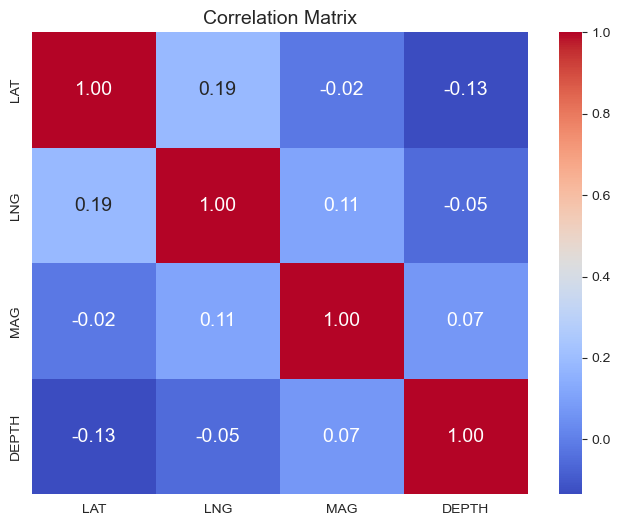

In [50]:
import seaborn as sns

# Calculate the correlation matrix
correlation_matrix = df[['LAT', 'LNG', 'MAG', 'DEPTH']].corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()


## III. Splitting the Data

- Our problem here is earthquake magnitude prediction, so that we would define magnitude as our target variable.

In [51]:
# input variables - features:
X = df.drop('MAG', axis=1).copy()  #axis is 1 to drop target var column
# Output variable - Target variable:
y = df['MAG']

# https://towardsdatascience.com/how-to-split-data-into-three-sets-train-validation-and-test-and-why-e50d22d3e54c
#Splitting into train and test sets which is %89 train(to be further split) and %11 test:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.11, random_state=42)
#And then continue splitting Train set into train and validation sets which is (0.89*0.88~=)%78 train and (0.89*0.12~=)%11 validation:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.12, random_state=42)
print(X_train.shape), print(y_train.shape)
print(X_val.shape), print(y_val.shape)
print(X_test.shape), print(y_test.shape)

(188959, 7)
(188959,)
(25768, 7)
(25768,)
(26540, 7)
(26540,)


(None, None)

We have split our dataset into %78 train, %11 test and %11 validation sets

In [248]:
%%time

from sklearn.model_selection import KFold, GridSearchCV
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
import numpy as np

# Define the number of folds
num_folds = 5

# Create a KFold cross-validation splitter
kf = KFold(n_splits=num_folds)

# Define the hyperparameter search space
param_space = {
    'hidden_layer_sizes': [(50,), (100,), (50, 25), (100, 50)],
    'activation': ['relu', 'tanh'],
    'max_iter': [50, 100, 200]
}

# Initialize a list to store the cross-validation scores
cv_scores = []

numerical_features = [
    "LAT",
    "LNG",
    "DEPTH",
]
X_train_numerical = X_train[numerical_features]
X_val_numerical = X_val[numerical_features]
X_test_numerical = X_val[numerical_features]


# Iterate through the cross-validation splits
for train_index, val_index in kf.split(X_train_numerical):
    X_train_fold, X_val_fold = X_train_numerical.iloc[train_index], X_train_numerical.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
    
    # Initialize the MLPRegressor with a set of hyperparameters
    model = MLPRegressor(hidden_layer_sizes=(50,), activation='relu', max_iter=100)
    
    # Train the model on the training fold
    model.fit(X_train_fold, y_train_fold)
    
    # Make predictions on the validation fold
    y_pred_val = model.predict(X_val_fold)
    
    # Calculate the mean squared error for this fold
    mse_fold = mean_squared_error(y_val_fold, y_pred_val)
    
    cv_scores.append(mse_fold)

# Calculate the average cross-validation score
average_cv_score = np.mean(cv_scores)
print("Average Cross-Validation MSE:", average_cv_score)


# Initialize the GridSearchCV with the MLPRegressor model and parameter space
grid_search = GridSearchCV(MLPRegressor(), param_grid=param_space, cv=kf)

# Fit the GridSearchCV on the training data
grid_search.fit(X_train_numerical, y_train)

# Get the best model from the GridSearchCV
best_model_grid = grid_search.best_estimator_

# Make predictions on the validation set using the best model
y_pred_val = best_model_grid.predict(X_val)

# Calculate the mean squared error on the validation set
val_mse = mean_squared_error(y_val, y_pred_val)
print("Validation MSE:", val_mse)

# Evaluate the best model on the test set
y_pred_test = best_model_grid.predict(X_test)
test_mse = mean_squared_error(y_test, y_pred_test)
print("Test MSE:", test_mse)



C:\Users\Harun\anaconda3\envs\myenv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


Average Cross-Validation MSE: 0.4036955589073605
CPU times: total: 10min 17s
Wall time: 1min 17s


## IV. Feature Engineering

### Handling Categorical Data = LOCATION_

We have 'LOCATION_' column consisting of string object values, which we have to translate to numerical data.

We will use target encoding to convert nominal data column LOCATION_ to numerical. But first we are going to compare target encoder with other encoders: 

#### Comparing Target Encoder with Other encoders (ref: https://scikit-learn.org/stable/auto_examples/preprocessing/plot_target_encoder.html#comparing-target-encoder-with-other-encoders)

The TargetEncoder uses the value of the target to encode each categorical feature. We will compare 3 different encoding methods; TargetEncoder, OrdinalEncoder, OneHotEncoder and dropping the category.

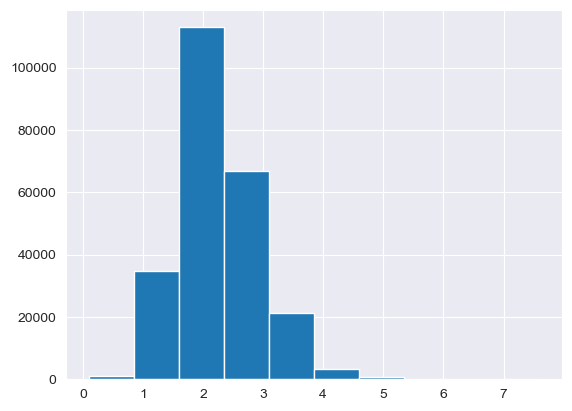

In [52]:
numerical_features = [
    "LAT",
    "LNG",
    "DEPTH",
]

categorical_features = ["LOCATION_"]
target_name = "MAG"

_ = y.hist()

In [53]:
df['DATE_'] = pd.to_datetime(df['DATE_'])
df['RECORDDATE'] = pd.to_datetime(df['DATE_'])
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 241267 entries, 0 to 284576
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   ID          241267 non-null  float64       
 1   DATE_       241267 non-null  datetime64[ns]
 2   LOCATION_   241267 non-null  object        
 3   LAT         241267 non-null  float64       
 4   LNG         241267 non-null  float64       
 5   MAG         241267 non-null  float64       
 6   DEPTH       241267 non-null  float64       
 7   RECORDDATE  241267 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(5), object(1)
memory usage: 16.6+ MB


In [54]:
import sklearn.preprocessing
print(sklearn.__version__)
print(dir(sklearn.preprocessing))


1.3.0
['Binarizer', 'FunctionTransformer', 'KBinsDiscretizer', 'KernelCenterer', 'LabelBinarizer', 'LabelEncoder', 'MaxAbsScaler', 'MinMaxScaler', 'MultiLabelBinarizer', 'Normalizer', 'OneHotEncoder', 'OrdinalEncoder', 'PolynomialFeatures', 'PowerTransformer', 'QuantileTransformer', 'RobustScaler', 'SplineTransformer', 'StandardScaler', 'TargetEncoder', '__all__', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '_csr_polynomial_expansion', '_data', '_discretization', '_encoders', '_function_transformer', '_label', '_polynomial', '_target_encoder', '_target_encoder_fast', 'add_dummy_feature', 'binarize', 'label_binarize', 'maxabs_scale', 'minmax_scale', 'normalize', 'power_transform', 'quantile_transform', 'robust_scale', 'scale']


In [55]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, TargetEncoder

categorical_preprocessors = [
    ("drop", "drop"),
    ("ordinal", OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1)),
    (
        "one_hot",
        OneHotEncoder(handle_unknown="ignore", max_categories=20, sparse_output=False),
    ),
    ("target", TargetEncoder(target_type="continuous")),
]

Now we evaluate the models using cross validation and record the results:

In [56]:
df

,ID,DATE_,LOCATION_,LAT,LNG,MAG,DEPTH,RECORDDATE
0,1.0,2005-01-01 00:29:42,KORKUTELi (ANTALYA),36.9197,30.3133,2.9,30.0,2005-01-01 00:29:42
2,3.0,2005-01-01 04:40:14,AKDENiZ,36.1153,28.4915,3.5,74.5,2005-01-01 04:40:14
4,5.0,2005-01-01 11:17:43,MENEMEN (iZMiR),38.8013,27.2075,2.9,28.3,2005-01-01 11:17:43
6,7.0,2005-01-01 12:07:24,AFYON,38.6682,30.7150,3.1,5.0,2005-01-01 12:07:24
8,9.0,2005-01-01 16:57:28,FOCA (iZMiR),38.6927,26.7683,3.3,28.5,2005-01-01 16:57:28
...,...,...,...,...,...,...,...,...
284492,284616.0,2023-02-19 09:55:38,KARTAL (KAHRAMANMARAS) ...,37.5222,37.1590,4.0,8.5,2023-02-19 09:55:38
284546,284616.0,2023-02-07 03:36:28,KARAOMER-GOKSUN (KAHRAMANMARAS) ...,38.1180,36.7155,3.8,5.5,2023-02-07 03:36:28
284551,284616.0,2023-02-13 16:44:14,KARAAHMET-GOKSUN (KAHRAMANMARAS) ...,37.9955,36.5937,2.2,1.3,2023-02-13 16:44:14
284558,284616.0,2023-02-18 11:24:05,KARAOMER-GOKSUN (KAHRAMANMARAS) ...,38.1455,36.7020,2.8,3.5,2023-02-18 11:24:05


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 241267 entries, 0 to 284576
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   ID          241267 non-null  float64       
 1   DATE_       241267 non-null  datetime64[ns]
 2   LOCATION_   241267 non-null  object        
 3   LAT         241267 non-null  float64       
 4   LNG         241267 non-null  float64       
 5   MAG         241267 non-null  float64       
 6   DEPTH       241267 non-null  float64       
 7   RECORDDATE  241267 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(5), object(1)
memory usage: 16.6+ MB


In [58]:
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.model_selection import cross_validate
from sklearn.pipeline import make_pipeline

n_cv_folds = 3
max_iter = 20
results = []


def evaluate_model_and_store(name, pipe):
    result = cross_validate(
        pipe,
        X,
        y,
        scoring="neg_root_mean_squared_error",
        cv=n_cv_folds,
        return_train_score=True,
    )
    rmse_test_score = -result["test_score"]
    rmse_train_score = -result["train_score"]
    results.append(
        {
            "preprocessor": name,
            "rmse_test_mean": rmse_test_score.mean(),
            "rmse_test_std": rmse_train_score.std(),
            "rmse_train_mean": rmse_train_score.mean(),
            "rmse_train_std": rmse_train_score.std(),
        }
    )


for name, categorical_preprocessor in categorical_preprocessors:
    preprocessor = ColumnTransformer(
        [
            ("numerical", "passthrough", numerical_features),
            ("categorical", categorical_preprocessor, categorical_features),
        ]
    )
    pipe = make_pipeline(
        preprocessor, HistGradientBoostingRegressor(random_state=0, max_iter=max_iter)
    )
    evaluate_model_and_store(name, pipe)

Root Mean Square Error (RMSE) is the standard deviation of the residuals (prediction errors). Residuals are a measure of how far from the regression line data points are; RMSE is a measure of how spread out these residuals are. In other words, it tells you how concentrated the data is around the line of best fit. Root mean square error is commonly used in climatology, forecasting, and regression analysis to verify experimental results.

We build and evaluate a pipeline that uses native categorical feature support in HistGradientBoostingRegressor, which only supports up to 255 unique categories. In our dataset, the categorical feature which is LOCATION_ has more than 255 unique categories:

In [59]:
n_unique_categories = df[categorical_features].nunique().sort_values(ascending=False)
n_unique_categories

LOCATION_    40721
dtype: int64

To workaround the limitation above, The high cardinality feature which is LOCATION_ will be target encoded.

In [60]:
high_cardinality_features = n_unique_categories[n_unique_categories > 255].index
low_cardinality_features = n_unique_categories[n_unique_categories <= 255].index
mixed_encoded_preprocessor = ColumnTransformer(
    [
        ("numerical", "passthrough", numerical_features),
        (
            "high_cardinality",
            TargetEncoder(target_type="continuous"),
            high_cardinality_features,
        ),
        (
            "low_cardinality",
            OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=-1),
            low_cardinality_features,
        ),
    ],
    verbose_feature_names_out=False,
)

# The output of the preprocessor must be set to pandas so the gradient boosting model can detect the low cardinality features.
mixed_encoded_preprocessor.set_output(transform="pandas")
mixed_pipe = make_pipeline(
    mixed_encoded_preprocessor,
    HistGradientBoostingRegressor(
        random_state=0, max_iter=max_iter, categorical_features=low_cardinality_features
    ),
)
mixed_pipe

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('numerical', 'passthrough',
                                                  ['LAT', 'LNG', 'DEPTH']),
                                                 ('high_cardinality',
                                                  TargetEncoder(target_type='continuous'),
                                                  Index(['LOCATION_'], dtype='object')),
                                                 ('low_cardinality',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=-1),
                                                  Index([], dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('histgradientboostingregressor',
                 HistGradientBoostingRegressor(categorical_features=Index([], dtype='object'),
                                               max_iter=20, random_state=0))])

Finally, we evaluate the pipeline using cross validation and record the results:

In [61]:
evaluate_model_and_store("mixed_target", mixed_pipe)

##### Plotting the Results:

We display the results by plotting the test and train scores:

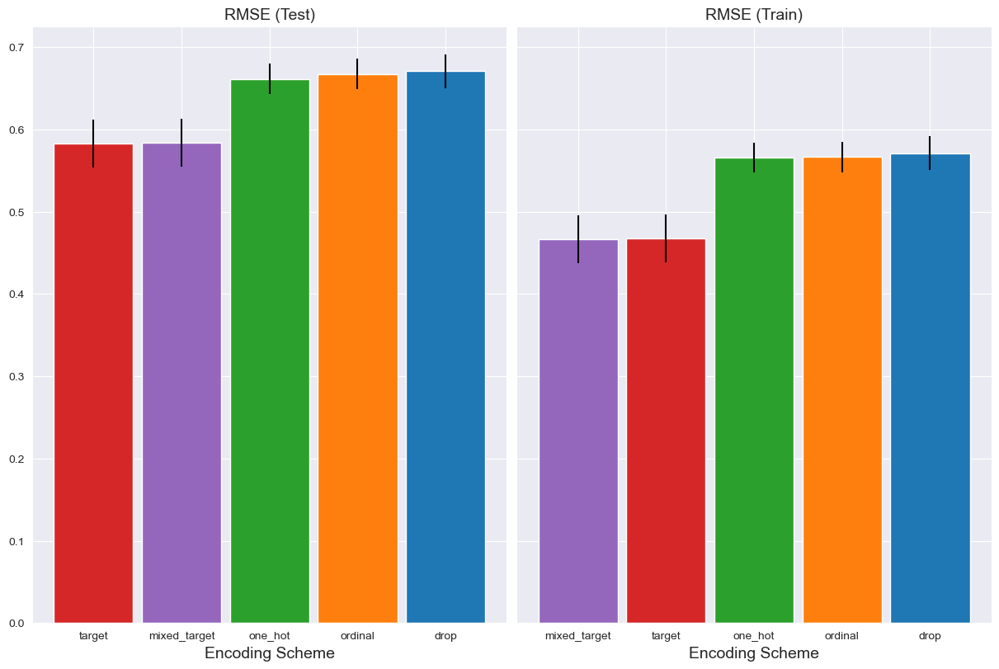

In [62]:
results_df = (
    pd.DataFrame(results).set_index("preprocessor").sort_values("rmse_test_mean")
)

fig, (ax1, ax2) = plt.subplots(
    1, 2, figsize=(12, 8), sharey=True, constrained_layout=True
)
xticks = range(len(results_df))
name_to_color = dict(
    zip((r["preprocessor"] for r in results), ["C0", "C1", "C2", "C3", "C4"])
)

for subset, ax in zip(["test", "train"], [ax1, ax2]):
    mean, std = f"rmse_{subset}_mean", f"rmse_{subset}_std"
    data = results_df[[mean, std]].sort_values(mean)
    ax.bar(
        x=xticks,
        height=data[mean],
        yerr=data[std],
        width=0.9,
        color=[name_to_color[name] for name in data.index],
    )
    ax.set(
        title=f"RMSE ({subset.title()})",
        xlabel="Encoding Scheme",
        xticks=xticks,
        xticklabels=data.index,
    )

- RMSE is the least on Target encodings, so that we choose Target encoding to encode LOCATION_ data column.


#### Using Target Encoding to convert nominal data column LOCATION_ to numerical

In [63]:
X_test

,ID,DATE_,LOCATION_,LAT,LNG,DEPTH,RECORDDATE
171957,171987.0,2018-07-25 20:56:34,AKDENIZ ...,36.1913,27.5283,15.100000,2023-02-27 15:02:16.087
74391,284616.0,2013-06-19 16:29:08,AKDENiZ ...,35.8125,27.2617,15.000000,2023-02-27 15:02:03.037
14597,14598.0,2008-07-03 10:49:51,KINIK (iZMiR),39.0933,27.2942,18.300000,2023-02-27 15:01:55.303
250407,250440.0,2021-11-21 10:44:22,ENIZCAKIRI-KOZAN (ADANA) ...,37.5025,35.5503,4.900000,2023-02-27 15:02:26.053
249648,249681.0,2021-10-15 12:03:08,KUSADASI KORFEZI (EGE DENIZI) ...,37.8963,26.9723,12.900000,2023-02-27 15:02:25.820
...,...,...,...,...,...,...,...
55253,55254.0,2012-06-10 06:48:15,SOGUT-SIMAV (KUTAHYA) ...,39.1218,29.0767,6.400000,2023-02-27 15:02:00.820
4462,4463.0,2005-11-12 16:55:03,YERKESiK- (MUGLA),37.2097,28.1897,12.500000,2023-02-27 15:01:53.097
75382,75383.0,2013-07-24 09:04:39,DOKUZTEKNE-CEYHAN (ADANA) ...,37.0945,35.9918,8.200000,2023-02-27 15:02:03.223
48448,48449.0,2012-01-18 22:18:02,KEMALYERi ACIKLARI-CANAKKALE (EGE DENiZi) ...,40.1758,26.1382,7.700000,2023-02-27 15:01:59.940


In [64]:
from sklearn.preprocessing import TargetEncoder

encoder = TargetEncoder()
encoder.fit(X_train[['LOCATION_']], y_train)  # Reshape to a 2d array because scikit-learn's TargetEncoder expects the input to be a 2D array


X_train['LOCATION_'] = encoder.transform(X_train[['LOCATION_']]) # Reshape to a 2D array
X_val['LOCATION_'] = encoder.transform(X_val[['LOCATION_']]) # Reshape to a 2D array

# Get the unique encoded values and their corresponding means (to be later used for real LOCATION_ transformation from encoded LOCATION_ values)
location_encoded_values = X_test['LOCATION_']
print("location values: ", location_encoded_values)
X_test['LOCATION_'] = encoder.transform(X_test[['LOCATION_']]) # Reshape to a 2D array
mean_encoded_values = X_test['LOCATION_']  #(to be later used for real LOCATION_ transformation from encoded LOCATION_ values)


# Create the location_mapping dictionary  (to be later used for real LOCATION_ transformation from encoded LOCATION_ values)
location_mapping = dict(zip(location_encoded_values, mean_encoded_values))

# Print the location_mapping dictionary (to be later used for real LOCATION_ transformation from encoded LOCATION_ values)
print(location_mapping)


location values:  171957    AKDENIZ                                       ...
74391     AKDENiZ                                       ...
14597                                         KINIK (iZMiR)
250407    ENIZCAKIRI-KOZAN (ADANA)                      ...
249648    KUSADASI KORFEZI (EGE DENIZI)                 ...
                                ...                        
55253     SOGUT-SIMAV (KUTAHYA)                         ...
4462                                      YERKESiK- (MUGLA)
75382     DOKUZTEKNE-CEYHAN (ADANA)                     ...
48448     KEMALYERi ACIKLARI-CANAKKALE (EGE DENiZi)     ...
237244    SAKIZ ADASI (EGE DENIZI)                      ...
Name: LOCATION_, Length: 26540, dtype: object
{'AKDENIZ                                           ': 2.362881032357821, 'AKDENiZ                                           ': 2.8040681091090915, 'KINIK (iZMiR)': 2.963683313545134, 'ENIZCAKIRI-KOZAN (ADANA)                          ': 1.723721283017158, 'KUSADASI KORFEZI (

In [65]:
location_encoded_values

171957    AKDENIZ                                       ...
74391     AKDENiZ                                       ...
14597                                         KINIK (iZMiR)
250407    ENIZCAKIRI-KOZAN (ADANA)                      ...
249648    KUSADASI KORFEZI (EGE DENIZI)                 ...
                                ...                        
55253     SOGUT-SIMAV (KUTAHYA)                         ...
4462                                      YERKESiK- (MUGLA)
75382     DOKUZTEKNE-CEYHAN (ADANA)                     ...
48448     KEMALYERi ACIKLARI-CANAKKALE (EGE DENiZi)     ...
237244    SAKIZ ADASI (EGE DENIZI)                      ...
Name: LOCATION_, Length: 26540, dtype: object

In [66]:
X_test

,ID,DATE_,LOCATION_,LAT,LNG,DEPTH,RECORDDATE
171957,171987.0,2018-07-25 20:56:34,2.362881,36.1913,27.5283,15.100000,2023-02-27 15:02:16.087
74391,284616.0,2013-06-19 16:29:08,2.804068,35.8125,27.2617,15.000000,2023-02-27 15:02:03.037
14597,14598.0,2008-07-03 10:49:51,2.963683,39.0933,27.2942,18.300000,2023-02-27 15:01:55.303
250407,250440.0,2021-11-21 10:44:22,1.723721,37.5025,35.5503,4.900000,2023-02-27 15:02:26.053
249648,249681.0,2021-10-15 12:03:08,1.854603,37.8963,26.9723,12.900000,2023-02-27 15:02:25.820
...,...,...,...,...,...,...,...
55253,55254.0,2012-06-10 06:48:15,2.223808,39.1218,29.0767,6.400000,2023-02-27 15:02:00.820
4462,4463.0,2005-11-12 16:55:03,2.676154,37.2097,28.1897,12.500000,2023-02-27 15:01:53.097
75382,75383.0,2013-07-24 09:04:39,2.069763,37.0945,35.9918,8.200000,2023-02-27 15:02:03.223
48448,48449.0,2012-01-18 22:18:02,2.595693,40.1758,26.1382,7.700000,2023-02-27 15:01:59.940


In [67]:
X_test["LOCATION_"]

171957    2.362881
74391     2.804068
14597     2.963683
250407    1.723721
249648    1.854603
            ...   
55253     2.223808
4462      2.676154
75382     2.069763
48448     2.595693
237244    2.302706
Name: LOCATION_, Length: 26540, dtype: float64

### 5-fold cross-validation

In [249]:
X_train

,ID,DATE_,LOCATION_,LAT,LNG,DEPTH,RECORDDATE
113579,113580.0,2015-12-27 07:24:45,1.944905,37.3137,28.1275,5.2,2023-02-27 15:02:09.117
9062,9063.0,2007-04-07 17:56:38,2.984851,40.0280,38.9882,7.4,2023-02-27 15:01:54.213
66455,66456.0,2013-01-13 04:08:21,1.801752,38.6745,28.0588,5.0,2023-02-27 15:02:02.023
145423,145439.0,2017-07-21 11:23:44,1.672904,36.8990,27.5750,18.5,2023-02-27 15:02:13.130
123721,123726.0,2016-09-01 13:27:00,1.929684,40.6980,29.2277,11.0,2023-02-27 15:02:10.563
...,...,...,...,...,...,...,...
112817,112818.0,2015-12-12 13:15:01,2.897369,34.5308,25.3850,20.5,2023-02-27 15:02:09.117
15433,15434.0,2008-09-07 20:45:57,3.323663,36.5195,28.0562,26.5,2023-02-27 15:01:55.460
103243,103244.0,2015-05-16 10:17:17,2.870591,35.2052,26.7827,9.6,2023-02-27 15:02:07.640
48195,48196.0,2012-01-13 11:36:12,2.053326,39.6682,29.4632,4.5,2023-02-27 15:01:59.940


In [265]:
%%time
# Execute cross validation KFold again after handling categorical LOCATION_ column:

from sklearn.model_selection import KFold, GridSearchCV, RandomizedSearchCV
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
import numpy as np
import time

# Define the number of folds
num_folds = 5

# Create a KFold cross-validation splitter
kf = KFold(n_splits=num_folds)

# Define the hyperparameter search space
param_space = {
    'hidden_layer_sizes': [(50,), (100,), (50, 25), (100, 50)],
    'activation': ['relu', 'tanh'],
    'max_iter': [50, 100, 200]
}

# Initialize a list to store the cross-validation scores
cv_scores = []

numerical_features_locationadded = ['LAT', 'LNG', 'LOCATION_', 'DEPTH']

X_train_numerical = X_train[numerical_features_locationadded]
X_val_numerical = X_val[numerical_features_locationadded]
X_test_numerical = X_val[numerical_features_locationadded]

t1 = time.time()
# Iterate through the cross-validation splits
for train_index, val_index in kf.split(X_train_numerical):
    X_train_fold, X_val_fold = X_train_numerical.iloc[train_index], X_train_numerical.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
    
    # Initialize the MLPRegressor with a set of hyperparameters
    model = MLPRegressor(hidden_layer_sizes=(50,), activation='relu', max_iter=100)
    
    # Train the model on the training fold
    model.fit(X_train_fold, y_train_fold)
    
    # Make predictions on the validation fold
    y_pred_val = model.predict(X_val_fold)
    
    # Calculate the mean squared error for this fold
    mse_fold = mean_squared_error(y_val_fold, y_pred_val)
    
    cv_scores.append(mse_fold)

t2 = time.time()
print(f"MLPRegressor regression Iterating through the cross-validation splits took {t2 - t1} seconds")
# Calculate the average cross-validation score
average_cv_score = np.mean(cv_scores)
print("Average Cross-Validation MSE:", average_cv_score)



# Initialize the GridSearchCV with the MLPRegressor model and parameter space
random_search = RandomizedSearchCV(MLPRegressor(), param_distributions=param_space, cv=kf, verbose=2)

t1 = time.time()
# Fit the GridSearchCV on the training data
random_search.fit(X_train_numerical, y_train)
t2 = time.time()
print(f"RandomizedSearchCV on MLPRegressor took {t2 - t1} seconds")

# Get the best model from the GridSearchCV
best_model_random = random_search.best_estimator_

# Make predictions on the validation set using the best model
y_pred_val = best_model_random.predict(X_val_numerical)

# Calculate the mean squared error on the validation set
val_mse = mean_squared_error(y_val, y_pred_val)
print("Validation MSE after hyperparameter tuning:", val_mse)

# Evaluate the best model on the test set
y_pred_test = best_model_random.predict(X_test_numerical)
test_mse = mean_squared_error(y_test, y_pred_test)
print("Test MSE after hyperparameter tuning:", test_mse)


MLPRegressor regression Iterating through the cross-validation splits took 35.8626024723053 seconds
Average Cross-Validation MSE: 0.20850262658856758
RandomizedSearchCV on MLPRegressor took 0.0 seconds
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END activation=relu, hidden_layer_sizes=(100,), max_iter=100; total time=  10.2s
[CV] END activation=relu, hidden_layer_sizes=(100,), max_iter=100; total time=   4.8s
[CV] END activation=relu, hidden_layer_sizes=(100,), max_iter=100; total time=  24.5s
[CV] END activation=relu, hidden_layer_sizes=(100,), max_iter=100; total time=   4.1s
[CV] END activation=relu, hidden_layer_sizes=(100,), max_iter=100; total time=   4.2s
[CV] END activation=tanh, hidden_layer_sizes=(100, 50), max_iter=50; total time=  44.6s
[CV] END activation=tanh, hidden_layer_sizes=(100, 50), max_iter=50; total time=  35.8s
[CV] END activation=tanh, hidden_layer_sizes=(100, 50), max_iter=50; total time=  36.8s


C:\Users\Harun\anaconda3\envs\myenv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV] END activation=tanh, hidden_layer_sizes=(100, 50), max_iter=50; total time=  42.0s


C:\Users\Harun\anaconda3\envs\myenv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV] END activation=tanh, hidden_layer_sizes=(100, 50), max_iter=50; total time=  41.5s
[CV] END activation=relu, hidden_layer_sizes=(50,), max_iter=100; total time=   9.1s
[CV] END activation=relu, hidden_layer_sizes=(50,), max_iter=100; total time=  12.6s
[CV] END activation=relu, hidden_layer_sizes=(50,), max_iter=100; total time=   6.2s
[CV] END activation=relu, hidden_layer_sizes=(50,), max_iter=100; total time=   3.6s
[CV] END activation=relu, hidden_layer_sizes=(50,), max_iter=100; total time=   4.7s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=50; total time=  12.4s


C:\Users\Harun\anaconda3\envs\myenv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=50; total time=  16.4s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=50; total time=  12.5s


C:\Users\Harun\anaconda3\envs\myenv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=50; total time=  16.4s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=50; total time=  15.8s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=200; total time=  14.8s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=200; total time=  13.9s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=200; total time=  15.2s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=200; total time=  14.9s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=200; total time=  17.1s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=100; total time=   9.1s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=100; total time=  15.2s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=100; total time=  14.0s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=100; total time=   9.9s
[CV] END activation=tanh, hidden_layer_sizes=(50,), max_iter=100; t

ValueError: Found input variables with inconsistent numbers of samples: [26540, 25768]

Average Cross-Validation MSE: 0.20850262658856758

In [270]:
print(X_train_numerical.shape, y_train.shape)
print(X_val_numerical.shape, y_val.shape)
print(X_test_numerical.shape, y_test.shape)

(188959, 4) (188959,)
(25768, 4) (25768,)
(25768, 4) (26540,)


### Scale numerical features (Normalization and Scaling)

In [254]:
X_train[numerical_features_locationadded]

,LAT,LNG,LOCATION_,DEPTH
113579,37.3137,28.1275,1.944905,5.2
9062,40.0280,38.9882,2.984851,7.4
66455,38.6745,28.0588,1.801752,5.0
145423,36.8990,27.5750,1.672904,18.5
123721,40.6980,29.2277,1.929684,11.0
...,...,...,...,...
112817,34.5308,25.3850,2.897369,20.5
15433,36.5195,28.0562,3.323663,26.5
103243,35.2052,26.7827,2.870591,9.6
48195,39.6682,29.4632,2.053326,4.5


#### with normalizing:

In [255]:
import sklearn.preprocessing as preprocessing
from sklearn.preprocessing import StandardScaler

#scaler = MinMaxScaler()
#numerical_features = ['LAT', 'LNG', 'DEPTH']

#numerical_features = ['DEPTH']

#X_train[numerical_features] = scaler.fit_transform(X_train[numerical_features])
#X_val[numerical_features] = scaler.transform(X_val[numerical_features])
#X_test[numerical_features] = scaler.transform(X_test[numerical_features])


# Step1: Extract the non-numerical features and create df.s
non_numerical_features = ['ID', 'DATE_', 'RECORDDATE']
X_train_non_numerical = X_train[non_numerical_features]
X_train_non_numerical_df = pd.DataFrame(X_train_non_numerical, columns=non_numerical_features)
X_val_non_numerical = X_val[non_numerical_features]
X_val_non_numerical_df = pd.DataFrame(X_val_non_numerical, columns=non_numerical_features)
X_test_non_numerical = X_test[non_numerical_features]
X_test_non_numerical_df =  pd.DataFrame(X_test_non_numerical, columns=non_numerical_features)

# Step2a: Normalize the numerical features in X_train, X_val, and X_test
# X_train_normalized_experiment = preprocessing.normalize(X_train[numerical_features_locationadded], norm='l2')
scaler = StandardScaler()
numerical_features = ['LAT', 'LNG', 'DEPTH']
numerical_features_locationadded = ['LAT', 'LNG', 'LOCATION_', 'DEPTH']

X_train_normalized = preprocessing.normalize(X_train[numerical_features_locationadded], norm='l2')
X_val_normalized = preprocessing.normalize(X_val[numerical_features_locationadded], norm='l2')
X_test_normalized = preprocessing.normalize(X_test[numerical_features_locationadded], norm='l2')

# Step2b: Standard scale the numerical features in X_train, X_val, and X_test
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train_normalized)
X_val_scaled = scaler.transform(X_val_normalized)
X_test_scaled = scaler.transform(X_test_normalized)

#X_train[numerical_features] = scaler.fit_transform(X_train[numerical_features])
#X_val[numerical_features] = scaler.transform(X_val[numerical_features])
#X_test[numerical_features] = scaler.transform(X_test[numerical_features])

# Step3: Create dataframes for scaled features with the original indices:
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=numerical_features_locationadded, index=X_train.index)
X_val_scaled_df = pd.DataFrame(X_val_scaled, columns=numerical_features_locationadded, index=X_val.index)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=numerical_features_locationadded, index=X_test.index)

# We have equaled indices of X_train_scaled_df, X_val_scaled_df, and X_test_scaled_df with the nonnumerical df indexes and they are equal to original so that they will be correctly alligned

# Step4: Concatenate non-numerical features with scaled and original-indiced numerical features
X_train_final = pd.concat([X_train_non_numerical_df, X_train_scaled_df], axis=1)
X_val_final = pd.concat([X_val_non_numerical_df, X_val_scaled_df], axis=1)
X_test_final = pd.concat([X_test_non_numerical_df, X_test_scaled_df], axis=1)

In [256]:
#Print the shape of X_test_final and X_test_scaled
print("Shape of X_test:", X_test.shape)
print("Shape of X_test_final:", X_test_final.shape)
print("Shape of X_test_scaled:", X_test_scaled.shape)
print("Shape of X_test_non_numerical_df:", X_test_non_numerical_df.shape)
print("Shape of X_test_scaled_df:", X_test_scaled_df.shape)

Shape of X_test: (26540, 7)
Shape of X_test_final: (26540, 7)
Shape of X_test_scaled: (26540, 4)
Shape of X_test_non_numerical_df: (26540, 3)
Shape of X_test_scaled_df: (26540, 4)


In [257]:
# Check if the indices match between X_test_non_numerical_df and X_test_scaled_df
print("Indices match:", X_test_non_numerical_df.index.equals(X_test_scaled_df.index))


Indices match: True


In [71]:
X_test_non_numerical

,ID,DATE_,RECORDDATE
171957,171987.0,2018-07-25 20:56:34,2023-02-27 15:02:16.087
74391,284616.0,2013-06-19 16:29:08,2023-02-27 15:02:03.037
14597,14598.0,2008-07-03 10:49:51,2023-02-27 15:01:55.303
250407,250440.0,2021-11-21 10:44:22,2023-02-27 15:02:26.053
249648,249681.0,2021-10-15 12:03:08,2023-02-27 15:02:25.820
...,...,...,...
55253,55254.0,2012-06-10 06:48:15,2023-02-27 15:02:00.820
4462,4463.0,2005-11-12 16:55:03,2023-02-27 15:01:53.097
75382,75383.0,2013-07-24 09:04:39,2023-02-27 15:02:03.223
48448,48449.0,2012-01-18 22:18:02,2023-02-27 15:01:59.940


In [258]:
X_test_scaled

array([[ 0.05763126, -0.48363658,  0.61951361,  0.91356702],
       [ 0.0445715 , -0.4867002 ,  1.63812418,  0.91938481],
       [ 0.20129039, -1.04079207,  1.52649371,  1.20711204],
       ...,
       [-0.62219389,  1.08347969, -0.39816534, -0.16755474],
       [ 1.11756451, -0.98385803,  1.05193993, -0.15510888],
       [ 0.75973062, -0.90537106,  0.52311277,  0.42295231]])

In [259]:
X_test_scaled_df

,LAT,LNG,LOCATION_,DEPTH
171957,0.057631,-0.483637,0.619514,0.913567
74391,0.044571,-0.486700,1.638124,0.919385
14597,0.201290,-1.040792,1.526494,1.207112
250407,-0.418543,1.046094,-1.059726,-0.592749
249648,0.500276,-0.697791,-0.515950,0.587415
...,...,...,...,...
55253,0.654200,-0.248839,0.194263,-0.348791
4462,0.268809,-0.365182,1.250285,0.527372
75382,-0.622194,1.083480,-0.398165,-0.167555
48448,1.117565,-0.983858,1.051940,-0.155109


In [260]:
X_test


,ID,DATE_,LOCATION_,LAT,LNG,DEPTH,RECORDDATE
171957,171987.0,2018-07-25 20:56:34,2.362881,36.1913,27.5283,15.100000,2023-02-27 15:02:16.087
74391,284616.0,2013-06-19 16:29:08,2.804068,35.8125,27.2617,15.000000,2023-02-27 15:02:03.037
14597,14598.0,2008-07-03 10:49:51,2.963683,39.0933,27.2942,18.300000,2023-02-27 15:01:55.303
250407,250440.0,2021-11-21 10:44:22,1.723721,37.5025,35.5503,4.900000,2023-02-27 15:02:26.053
249648,249681.0,2021-10-15 12:03:08,1.854603,37.8963,26.9723,12.900000,2023-02-27 15:02:25.820
...,...,...,...,...,...,...,...
55253,55254.0,2012-06-10 06:48:15,2.223808,39.1218,29.0767,6.400000,2023-02-27 15:02:00.820
4462,4463.0,2005-11-12 16:55:03,2.676154,37.2097,28.1897,12.500000,2023-02-27 15:01:53.097
75382,75383.0,2013-07-24 09:04:39,2.069763,37.0945,35.9918,8.200000,2023-02-27 15:02:03.223
48448,48449.0,2012-01-18 22:18:02,2.595693,40.1758,26.1382,7.700000,2023-02-27 15:01:59.940


In [261]:
X_test_final

,ID,DATE_,RECORDDATE,LAT,LNG,LOCATION_,DEPTH
171957,171987.0,2018-07-25 20:56:34,2023-02-27 15:02:16.087,0.057631,-0.483637,0.619514,0.913567
74391,284616.0,2013-06-19 16:29:08,2023-02-27 15:02:03.037,0.044571,-0.486700,1.638124,0.919385
14597,14598.0,2008-07-03 10:49:51,2023-02-27 15:01:55.303,0.201290,-1.040792,1.526494,1.207112
250407,250440.0,2021-11-21 10:44:22,2023-02-27 15:02:26.053,-0.418543,1.046094,-1.059726,-0.592749
249648,249681.0,2021-10-15 12:03:08,2023-02-27 15:02:25.820,0.500276,-0.697791,-0.515950,0.587415
...,...,...,...,...,...,...,...
55253,55254.0,2012-06-10 06:48:15,2023-02-27 15:02:00.820,0.654200,-0.248839,0.194263,-0.348791
4462,4463.0,2005-11-12 16:55:03,2023-02-27 15:01:53.097,0.268809,-0.365182,1.250285,0.527372
75382,75383.0,2013-07-24 09:04:39,2023-02-27 15:02:03.223,-0.622194,1.083480,-0.398165,-0.167555
48448,48449.0,2012-01-18 22:18:02,2023-02-27 15:01:59.940,1.117565,-0.983858,1.051940,-0.155109


In [262]:
X_train.columns

Index(['ID', 'DATE_', 'LOCATION_', 'LAT', 'LNG', 'DEPTH', 'RECORDDATE'], dtype='object')

### Apply PCA for Dimensionality Reduction

In [187]:
%%time
import sklearn.preprocessing as preprocessing

numerical_features_locationadded = ['LAT', 'LNG', 'LOCATION_', 'DEPTH']

scaler = preprocessing.MinMaxScaler()

X_train_norm = scaler.fit_transform(X_train[numerical_features_locationadded])
X_val_norm = scaler.transform(X_val[numerical_features_locationadded])
X_test_norm = scaler.transform(X_test[numerical_features_locationadded])

# Create dataframes for normalized features with the original indices:  (for l2 normalization we can use: X_train_normalized = preprocessing.normalize(X_train,norm='l2)') )

X_train_norm_df = pd.DataFrame(X_train_norm, columns=numerical_features_locationadded, index=X_train.index)
X_val_norm_df = pd.DataFrame(X_val_norm, columns=numerical_features_locationadded, index=X_val.index)
X_test_norm_df = pd.DataFrame(X_test_norm, columns=numerical_features_locationadded, index=X_test.index)

CPU times: total: 15.6 ms
Wall time: 56 ms


In [182]:
X_train_scaled_df

,LAT,LNG,LOCATION_,DEPTH
113579,-0.616303,-0.582238,-0.563220,-0.406458
9062,1.219247,1.384372,1.625550,-0.211125
66455,0.303940,-0.594678,-0.864515,-0.424216
145423,-0.896744,-0.682283,-1.135701,0.774424
123721,1.672335,-0.383019,-0.595257,0.108513
...,...,...,...,...
112817,-2.498243,-1.078839,1.441428,0.952000
15433,-1.153381,-0.595149,2.338647,1.484729
103243,-2.042179,-0.825749,1.385069,-0.015791
48195,0.975931,-0.340375,-0.335027,-0.468610


In [189]:
X_train_norm_df

,LAT,LNG,LOCATION_,DEPTH
113579,0.452624,0.323663,0.272641,0.374602
9062,0.627508,0.682944,0.435133,0.378078
66455,0.540301,0.321390,0.250274,0.374286
145423,0.425905,0.305386,0.230141,0.395616
123721,0.670676,0.360058,0.270263,0.383766
...,...,...,...,...
112817,0.273321,0.232939,0.421464,0.398776
15433,0.401454,0.321304,0.488072,0.408255
103243,0.316773,0.279176,0.417280,0.381554
48195,0.604326,0.367849,0.289582,0.373496


In [190]:
X_train

,ID,DATE_,LOCATION_,LAT,LNG,DEPTH,RECORDDATE
113579,113580.0,2015-12-27 07:24:45,1.944905,37.3137,28.1275,5.2,2023-02-27 15:02:09.117
9062,9063.0,2007-04-07 17:56:38,2.984851,40.0280,38.9882,7.4,2023-02-27 15:01:54.213
66455,66456.0,2013-01-13 04:08:21,1.801752,38.6745,28.0588,5.0,2023-02-27 15:02:02.023
145423,145439.0,2017-07-21 11:23:44,1.672904,36.8990,27.5750,18.5,2023-02-27 15:02:13.130
123721,123726.0,2016-09-01 13:27:00,1.929684,40.6980,29.2277,11.0,2023-02-27 15:02:10.563
...,...,...,...,...,...,...,...
112817,112818.0,2015-12-12 13:15:01,2.897369,34.5308,25.3850,20.5,2023-02-27 15:02:09.117
15433,15434.0,2008-09-07 20:45:57,3.323663,36.5195,28.0562,26.5,2023-02-27 15:01:55.460
103243,103244.0,2015-05-16 10:17:17,2.870591,35.2052,26.7827,9.6,2023-02-27 15:02:07.640
48195,48196.0,2012-01-13 11:36:12,2.053326,39.6682,29.4632,4.5,2023-02-27 15:01:59.940


#### Choosing the number of the components to retain:

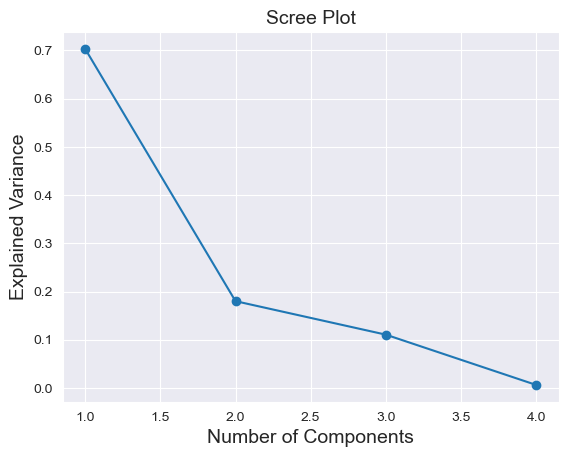

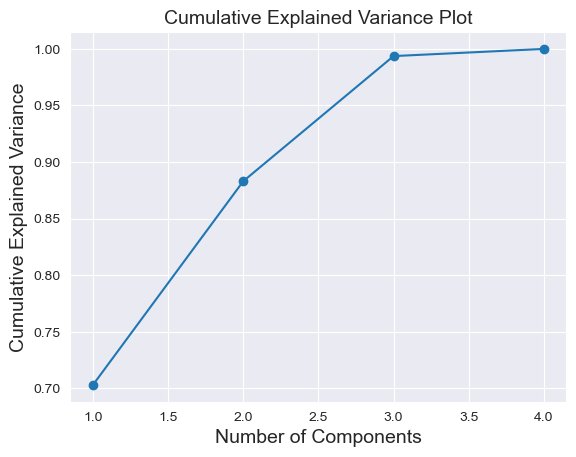

In [191]:
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt

numerical_features = ['LAT', 'LNG', 'DEPTH']
numerical_features_locationadded = ['LAT', 'LNG', 'LOCATION_', 'DEPTH']

pca = PCA(n_components=None)
pca.fit(X_train_norm_df)
explained_variance = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance)


plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance')
plt.title('Scree Plot')
plt.show()

# Visualize the cumulative explained variance
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance Plot')
plt.show()

In [192]:
print(explained_variance)

array([0.7030533 , 0.18002892, 0.11058243, 0.00633535])

on 3 components, cumulative explained variance reaches to almost full-%99. But on 2 components, it is also around %90. So that we are continuing with n_components=3

#### Applying PCA:

In [193]:
pca = PCA(n_components=3)  # Number of components we want to retain

X_train_pca = pca.fit_transform(X_train_norm_df)
X_val_pca = pca.transform(X_val_norm_df)
X_test_pca = pca.transform(X_test_norm_df)

# Create dataframes for scaled features with the original indices:
X_train_pca_df = pd.DataFrame(X_train_pca, columns=['Principal Component 1', 'Principal Component 2', 'Principal Component 3'], index=X_train.index)
X_val_pca_df = pd.DataFrame(X_val_pca, columns=['Principal Component 1', 'Principal Component 2', 'Principal Component 3'], index=X_val.index)
X_test_pca_df = pd.DataFrame(X_test_pca, columns=['Principal Component 1', 'Principal Component 2', 'Principal Component 3'], index=X_test.index)

In [194]:
X_test_pca

array([[-0.14008837,  0.11661045,  0.02189186],
       [-0.14709022,  0.14659032,  0.08874829],
       [-0.11706871, -0.05927273,  0.13300884],
       ...,
       [ 0.14117563,  0.08826345, -0.04160421],
       [-0.14987435, -0.13901859,  0.08509888],
       [-0.17768085, -0.01974137,  0.0289056 ]])

In [195]:
X_test_pca_df

,Principal Component 1,Principal Component 2,Principal Component 3
171957,-0.140088,0.116610,0.021892
74391,-0.147090,0.146590,0.088748
14597,-0.117069,-0.059273,0.133009
250407,0.126329,0.054940,-0.091752
249648,-0.149716,-0.002175,-0.045345
...,...,...,...
55253,-0.066558,-0.066103,0.013120
4462,-0.106517,0.059336,0.074570
75382,0.141176,0.088263,-0.041604
48448,-0.149874,-0.139019,0.085099


Visualize the transformed data:

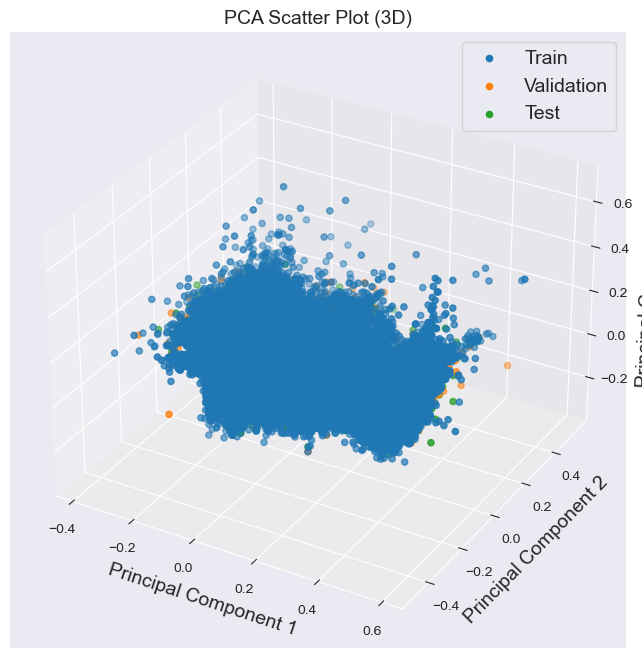

In [197]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_train_pca_df['Principal Component 1'], X_train_pca_df['Principal Component 2'], X_train_pca_df['Principal Component 3'], label='Train')
ax.scatter(X_val_pca_df['Principal Component 1'], X_val_pca_df['Principal Component 2'], X_val_pca_df['Principal Component 3'], label='Validation')
ax.scatter(X_test_pca_df['Principal Component 1'], X_test_pca_df['Principal Component 2'], X_test_pca_df['Principal Component 3'], label='Test')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('PCA Scatter Plot (3D)')
ax.legend()
plt.show()


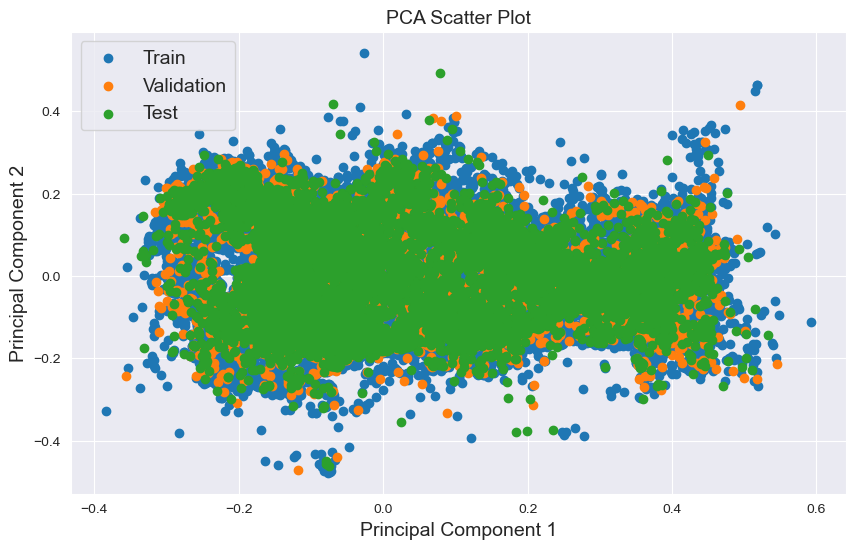

In [198]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

plt.scatter(X_train_pca_df['Principal Component 1'], X_train_pca_df['Principal Component 2'], label='Train')
plt.scatter(X_val_pca_df['Principal Component 1'], X_val_pca_df['Principal Component 2'], label='Validation')
plt.scatter(X_test_pca_df['Principal Component 1'], X_test_pca_df['Principal Component 2'], label='Test')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Scatter Plot')
plt.legend()
plt.show()


### 5-fold cross-validation

In [429]:
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPRegressor
import numpy as np

model = MLPRegressor(hidden_layer_sizes=(50,), activation='relu', max_iter=100)

# Create a 5-fold cross-validation splitter
kf = KFold(n_splits=5)

# Initialize a list to store evaluation metrics (e.g., RMSE)
metrics = []
metrics_mse = []

# Iterate through the cross-validation splits
for train_index, val_index in kf.split(X_train_scaled_df):
    X_train_fold, X_val_fold = X_train_scaled_df.iloc[train_index], X_train_scaled_df.iloc[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]
    
    # Train the model
    model.fit(X_train_fold, y_train_fold)
    
    # Make predictions on validation data
    y_pred_fold = model.predict(X_val_fold)
    
    # Calculate evaluation metric (e.g., RMSE)
    mse_fold = mean_squared_error(y_val_fold, y_pred_fold)
    rmse_fold = np.sqrt(mse_fold)
    
    
    # Store the metric for this fold
    metrics.append(rmse_fold)
    metrics_mse.append(mse_fold)

# Calculate the average RMSE across all folds
average_rmse = sum(metrics) / len(metrics)
average_mse = sum(metrics_mse) / len(metrics_mse)
print("Average RMSE:", average_rmse)
print("Average MSE:", average_mse)


Average RMSE: 0.4562060318860066
Average MSE: 0.2081284418853123


Average RMSE: 0.4562060318860066
Average MSE: 0.2081284418853123


 ## V. Probability Distribution, Correlation Matrix

Prabability distributions of numerical features:

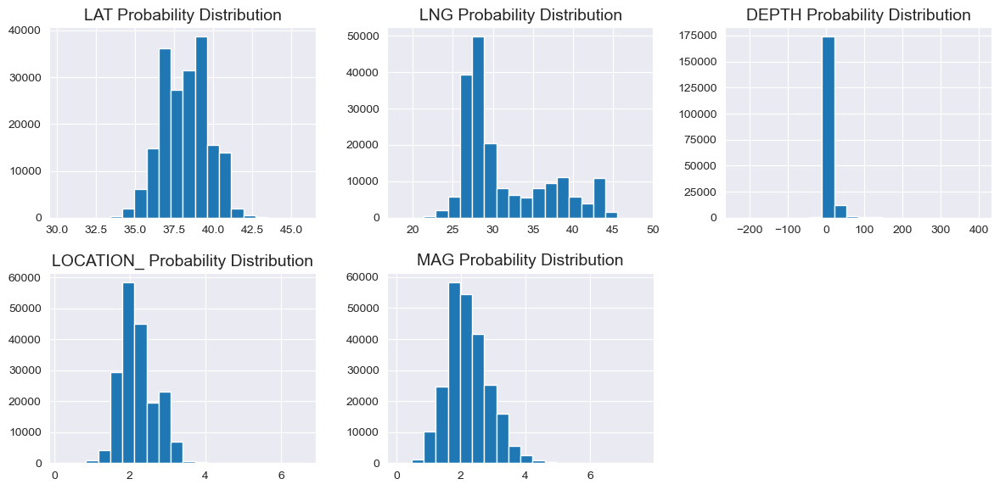

In [84]:
import matplotlib.pyplot as plt

# Plot histograms of numerical features
plt.figure(figsize=(12, 6))
plt.subplot(2, 3, 1)
plt.hist(X_train['LAT'], bins=20)
plt.title('LAT Probability Distribution')

plt.subplot(2, 3, 2)
plt.hist(X_train['LNG'], bins=20)
plt.title('LNG Probability Distribution')

plt.subplot(2, 3, 3)
plt.hist(X_train['DEPTH'], bins=20)
plt.title('DEPTH Probability Distribution')

plt.subplot(2, 3, 4)
plt.hist(X_train['LOCATION_'], bins=20)
plt.title('LOCATION_ Probability Distribution')

plt.subplot(2, 3, 5)
plt.hist(y, bins=20)
plt.title('MAG Probability Distribution')

plt.tight_layout()
plt.show()


 Negative depth values most probably indicates events above the reference point or sea level.

Correlation Matrix of numerical features:

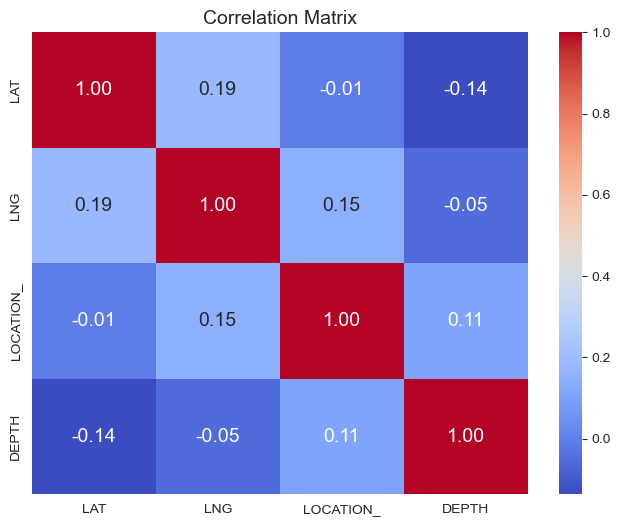

In [85]:
import seaborn as sns

# Calculate the correlation matrix
correlation_matrix = X_train[numerical_features_locationadded].corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

LAT         -0.016281
LNG          0.108519
LOCATION_    0.724065
DEPTH        0.069975
MAG          1.000000
Name: MAG, dtype: float64


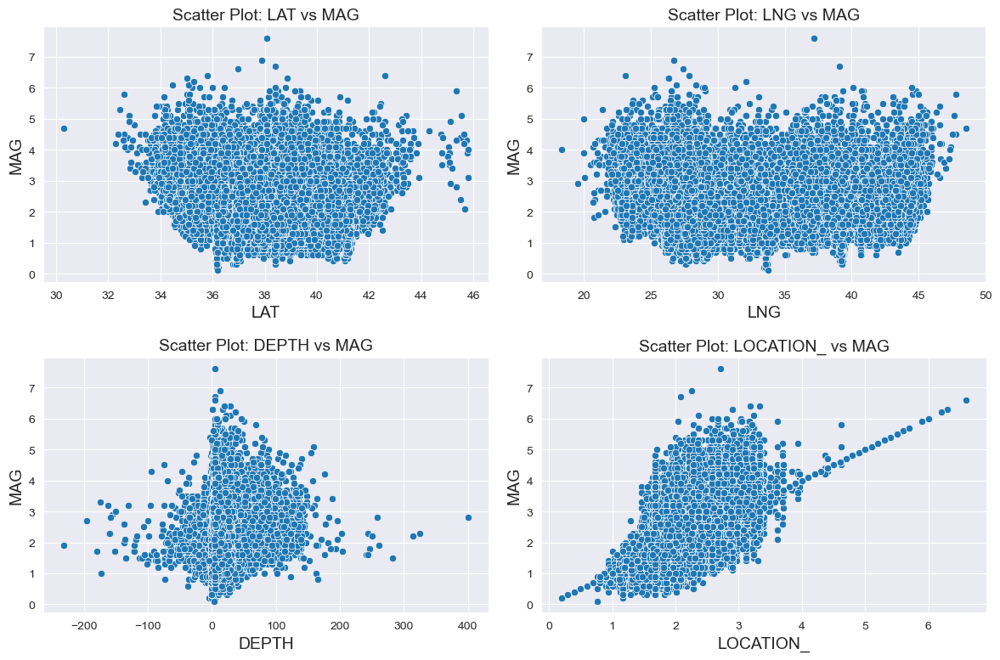

In [86]:
import seaborn as sns

# Combine the numerical features and the target variable (MAG) into a single DataFrame
data_with_mag = X_train[numerical_features_locationadded].copy()
data_with_mag['MAG'] = y_train

# Calculate the correlation between the features and the target variable
correlation_with_mag = data_with_mag.corr()

# Print the correlation values
print(correlation_with_mag['MAG'])


# Scatter plots for correlations against target variable MAG:
# Create scatter plots for each numerical feature against the target variable (MAG)
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
sns.scatterplot(data=data_with_mag, x='LAT', y='MAG')
plt.title('Scatter Plot: LAT vs MAG')

plt.subplot(2, 2, 2)
sns.scatterplot(data=data_with_mag, x='LNG', y='MAG')
plt.title('Scatter Plot: LNG vs MAG')

plt.subplot(2, 2, 3)
sns.scatterplot(data=data_with_mag, x='DEPTH', y='MAG')
plt.title('Scatter Plot: DEPTH vs MAG')

plt.subplot(2, 2, 4)
sns.scatterplot(data=data_with_mag, x='LOCATION_', y='MAG')
plt.title('Scatter Plot: LOCATION_ vs MAG')

plt.tight_layout()
plt.show()


Correlation Heatmap: correlation with the target variable

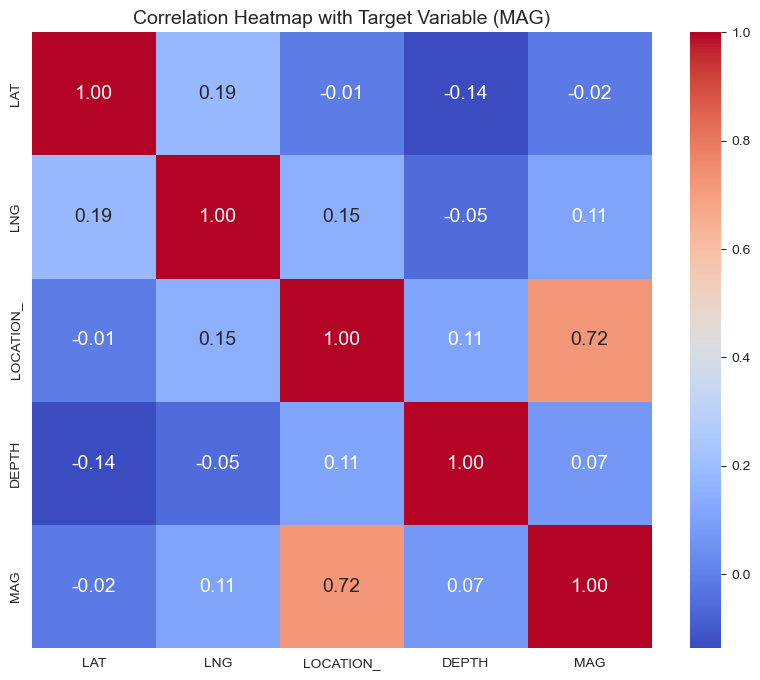

In [87]:
# Correlation Heatmap: correlation with the target variable

# Calculate the correlation matrix with the target variable
correlation_matrix_with_target = data_with_mag.corr()

# Plot the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_with_target, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap with Target Variable (MAG)')
plt.show()


Pairplot

C:\Users\Harun\anaconda3\envs\myenv\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


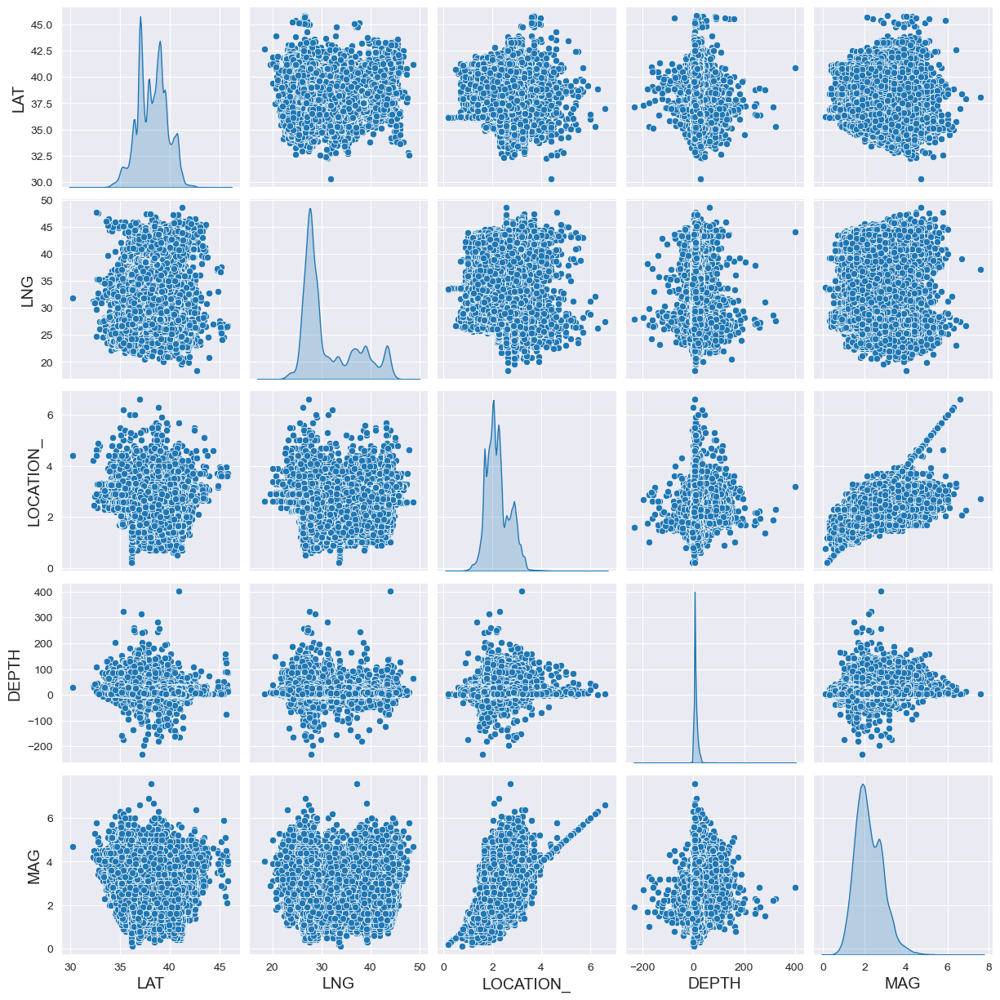

CPU times: total: 26.3 s
Wall time: 19.1 s


In [88]:
%%time
# Create a pairplot
sns.pairplot(data=data_with_mag, vars=numerical_features_locationadded + ['MAG'], diag_kind='kde')
plt.show()


Joint Distribution Plot

<Figure size 600x600 with 0 Axes>

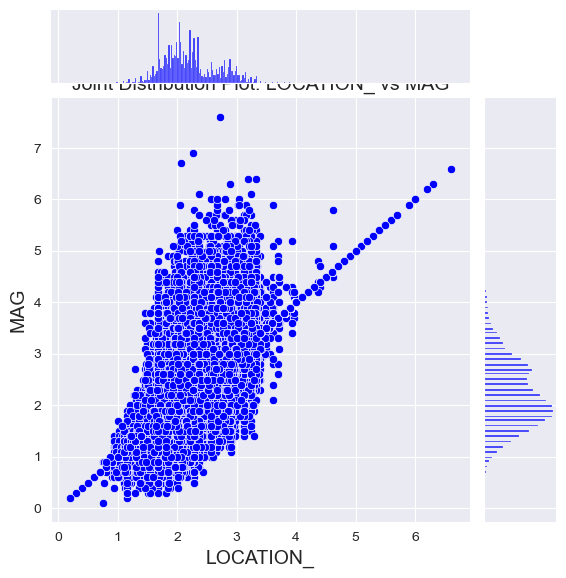

<Figure size 600x600 with 0 Axes>

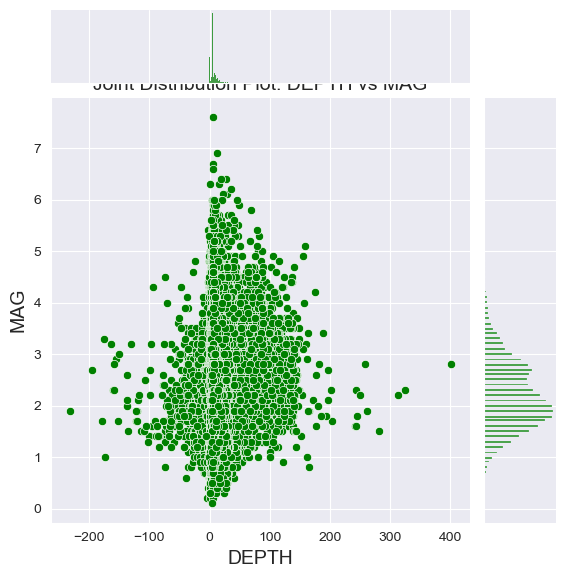

CPU times: total: 5.03 s
Wall time: 5.03 s


In [89]:
%%time
import matplotlib.pyplot as plt

# Create jointplot for LOCATION_ vs MAG
plt.figure(figsize=(6, 6))
jointplot_location = sns.jointplot(data=data_with_mag, x='LOCATION_', y='MAG', kind='scatter', color='b')
plt.title('Joint Distribution Plot: LOCATION_ vs MAG')
plt.show()

# Create jointplot for DEPTH vs MAG
plt.figure(figsize=(6, 6))
jointplot_depth = sns.jointplot(data=data_with_mag, x='DEPTH', y='MAG', kind='scatter', color='g')
plt.title('Joint Distribution Plot: DEPTH vs MAG')
plt.show()


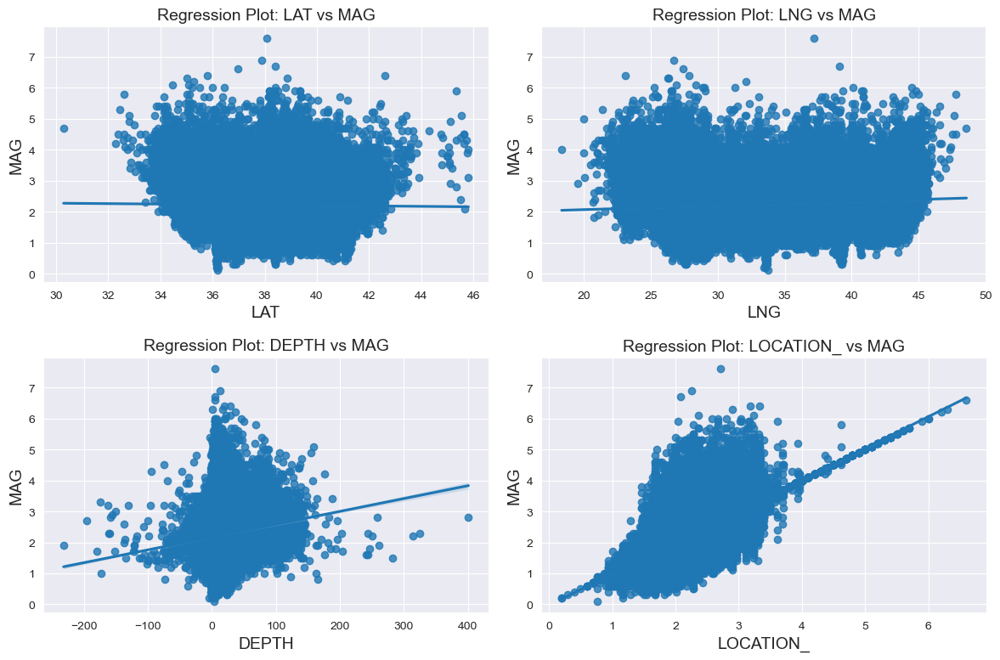

CPU times: total: 5min 41s
Wall time: 45.4 s


In [90]:
%%time
# sns.regplot for correlations btw MAG:
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
sns.regplot(data=data_with_mag, x='LAT', y='MAG')
plt.title('Regression Plot: LAT vs MAG')

plt.subplot(2, 2, 2)
sns.regplot(data=data_with_mag, x='LNG', y='MAG')
plt.title('Regression Plot: LNG vs MAG')

plt.subplot(2, 2, 3)
sns.regplot(data=data_with_mag, x='DEPTH', y='MAG')
plt.title('Regression Plot: DEPTH vs MAG')

plt.subplot(2, 2, 4)
sns.regplot(data=data_with_mag, x='LOCATION_', y='MAG')
plt.title('Regression Plot: LOCATION_ vs MAG')

plt.tight_layout(rect=[0, 0, 1, 1])
plt.show()


<Figure size 1200x800 with 4 Axes>
CPU times: total: 5min 33s
Wall time: 44.6 s


### Finding key inputs to our model:

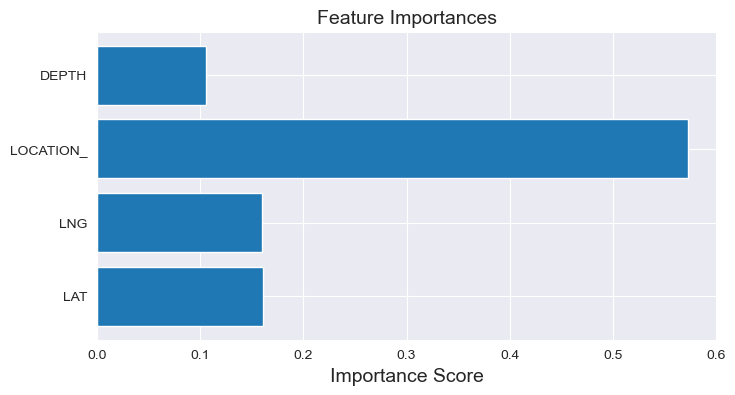

CPU times: total: 2min 48s
Wall time: 2min 48s


In [91]:
%%time
from sklearn.ensemble import RandomForestRegressor

# Initialize the model
model = RandomForestRegressor()

# Fit the model on the training data
model.fit(X_train[numerical_features_locationadded], y_train)

# Get feature importances
feature_importances = model.feature_importances_

# Plot feature importances
plt.figure(figsize=(8, 4))
plt.barh(numerical_features_locationadded, feature_importances)
plt.title('Feature Importances')
plt.xlabel('Importance Score')
plt.show()


- LOCATION_ is the most important feature as it is seen from the plot (~0.6 importance score)

2m 45s

## VI. Experiment with Multiple Regression Models

### 1. Random Forest Regression

Random Forest is an ensemble learning method that combines multiple decision trees to make predictions. It can handle a large number of features.

In [92]:
numerical_features_locationadded

['LAT', 'LNG', 'LOCATION_', 'DEPTH']

In [93]:
X_train

,ID,DATE_,LOCATION_,LAT,LNG,DEPTH,RECORDDATE
113579,113580.0,2015-12-27 07:24:45,1.944905,37.3137,28.1275,5.2,2023-02-27 15:02:09.117
9062,9063.0,2007-04-07 17:56:38,2.984851,40.0280,38.9882,7.4,2023-02-27 15:01:54.213
66455,66456.0,2013-01-13 04:08:21,1.801752,38.6745,28.0588,5.0,2023-02-27 15:02:02.023
145423,145439.0,2017-07-21 11:23:44,1.672904,36.8990,27.5750,18.5,2023-02-27 15:02:13.130
123721,123726.0,2016-09-01 13:27:00,1.929684,40.6980,29.2277,11.0,2023-02-27 15:02:10.563
...,...,...,...,...,...,...,...
112817,112818.0,2015-12-12 13:15:01,2.897369,34.5308,25.3850,20.5,2023-02-27 15:02:09.117
15433,15434.0,2008-09-07 20:45:57,3.323663,36.5195,28.0562,26.5,2023-02-27 15:01:55.460
103243,103244.0,2015-05-16 10:17:17,2.870591,35.2052,26.7827,9.6,2023-02-27 15:02:07.640
48195,48196.0,2012-01-13 11:36:12,2.053326,39.6682,29.4632,4.5,2023-02-27 15:01:59.940


In [94]:
%%time

#check if a saved version of the model exists before training:
import os
import pickle
from sklearn.ensemble import RandomForestRegressor

# Check if the saved model file exists for each model
if os.path.exists('rforest_model.pkl'):
    # Load the model from the file if it exists
    with open('rforest_model.pkl', 'rb') as file:
        rforest_model = pickle.load(file)
        print("rforest_model loaded from file rforest_model.pkl")
else:
    # Train the model if the file does not exist
    rforest_model = RandomForestRegressor(random_state=42)
    rforest_model.fit(X_train_scaled_df, y_train)
    # Save the models to files
    with open('rforest_model.pkl', 'wb') as file:
        pickle.dump(rforest_model, file)
        print("rforest_model saved to the file rforest_model.pkl")
    
    
    
    
if os.path.exists('rforest_model2.pkl'):
    # Load the model from the file if it exists
    with open('rforest_model2.pkl', 'rb') as file:
        rforest_model2 = pickle.load(file)
        print("rforest_model2 loaded from file rforest_model2.pkl")
else:
    # Train the model if the file does not exist
    rforest_model2 = RandomForestRegressor(random_state=42)
    rforest_model2.fit(X_train_pca_df, y_train)
    #save the model to file:
    with open('rforest_model2.pkl', 'wb') as file:
        pickle.dump(rforest_model2, file)
        print("rforest_model2 saved to the file rforest_model2.pkl")

rforest_model loaded from file rforest_model.pkl
rforest_model2 loaded from file rforest_model2.pkl
CPU times: total: 2.44 s
Wall time: 20 s


for training the models:
CPU times: total: 5min 35s
Wall time: 5min 38s

rforest_model2 saved to the file rforest_model2.pkl
CPU times: total: 3min 31s
Wall time: 3min 36s


In [95]:
rforest_model.score(X_test_scaled_df, y_test)


0.35429187101241755

In [202]:
print(rforest_model2.feature_importances_)
X_train_pca_df

[0.17291953 0.16994714 0.65713333]


,Principal Component 1,Principal Component 2,Principal Component 3
113579,-0.115687,0.040621,-0.038295
9062,0.273665,-0.071848,0.109411
66455,-0.108219,-0.048467,-0.052228
145423,-0.140325,0.061041,-0.080830
123721,-0.051820,-0.170188,-0.023328
...,...,...,...
112817,-0.218156,0.222266,0.100969
15433,-0.109599,0.113506,0.171801
103243,-0.167022,0.184111,0.096531
48195,-0.051239,-0.102071,-0.011199


In [203]:
print(rforest_model.feature_importances_)


[0.16092429 0.1605095  0.57255191 0.10601429]


,LAT,LNG,LOCATION_,DEPTH
113579,-0.616303,-0.582238,-0.563220,-0.406458
9062,1.219247,1.384372,1.625550,-0.211125
66455,0.303940,-0.594678,-0.864515,-0.424216
145423,-0.896744,-0.682283,-1.135701,0.774424
123721,1.672335,-0.383019,-0.595257,0.108513
...,...,...,...,...
112817,-2.498243,-1.078839,1.441428,0.952000
15433,-1.153381,-0.595149,2.338647,1.484729
103243,-2.042179,-0.825749,1.385069,-0.015791
48195,0.975931,-0.340375,-0.335027,-0.468610


### 2. Gradient Boosting Regression


Gradient Boosting is also an ensemble method that builds multiple decision trees sequentially, with each tree correcting the errors of the previous one. It often provides better predictive performance compared to Random Forest.

In [99]:
%%time
from sklearn.ensemble import GradientBoostingRegressor

# Check if the saved model file exists for each model
if os.path.exists('gboosting_model.pkl'):
    # Load the model from the file if it exists
    with open('gboosting_model.pkl', 'rb') as file:
        gboosting_model = pickle.load(file)
        print("gboosting_model loaded from file gboosting_model.pkl")
else:
    # Train the model if the file does not exist
    gboosting_model = GradientBoostingRegressor(random_state=42)
    gboosting_model.fit(X_train_scaled_df, y_train)
    with open('gboosting_model.pkl', 'wb') as file:
        pickle.dump(gboosting_model, file)
        print("gboosting_model saved to file, gboosting_model.pkl")
    
    
    
    
    
if os.path.exists('gboosting_model2.pkl'):
    # Load the model from the file if it exists
    with open('gboosting_model2.pkl', 'rb') as file:
        gboosting_model2 = pickle.load(file)
        print("gboosting_model2 loaded from file gboosting_model2.pkl")
else:
    # Train the model if the file does not exist
    gboosting_model2 = GradientBoostingRegressor(random_state=42)
    gboosting_model2.fit(X_train_pca_df, y_train)
    with open('gboosting_model2.pkl', 'wb') as file:
        pickle.dump(gboosting_model2, file)
        print("gboosting_model2 saved to file, gboosting_model2.pkl")


gboosting_model loaded from file gboosting_model.pkl
gboosting_model2 loaded from file gboosting_model2.pkl
CPU times: total: 0 ns
Wall time: 167 ms


gboosting_model saved to file, gboosting_model.pkl
gboosting_model2 saved to file, gboosting_model2.pkl

for training gboosting-model:
CPU times: total: 23.3 s
Wall time: 23.4 s

gboosting_model2 saved to file, gboosting_model2.pkl
CPU times: total: 42.9 s
Wall time: 43.5 s


In [206]:
gboosting_model.feature_importances_

array([0.01648578, 0.00923448, 0.94716616, 0.02711358])

In [101]:
print(X_train_scaled_df)

,LAT,LNG,LOCATION_,DEPTH
113579,-0.616303,-0.582238,-0.563220,-0.406458
9062,1.219247,1.384372,1.625550,-0.211125
66455,0.303940,-0.594678,-0.864515,-0.424216
145423,-0.896744,-0.682283,-1.135701,0.774424
123721,1.672335,-0.383019,-0.595257,0.108513
...,...,...,...,...
112817,-2.498243,-1.078839,1.441428,0.952000
15433,-1.153381,-0.595149,2.338647,1.484729
103243,-2.042179,-0.825749,1.385069,-0.015791
48195,0.975931,-0.340375,-0.335027,-0.468610


In [207]:
gboosting_model2.feature_importances_

array([0.03625053, 0.03319325, 0.93055623])

In [208]:
print(X_train_pca_df)

,Principal Component 1,Principal Component 2,Principal Component 3
113579,-0.115687,0.040621,-0.038295
9062,0.273665,-0.071848,0.109411
66455,-0.108219,-0.048467,-0.052228
145423,-0.140325,0.061041,-0.080830
123721,-0.051820,-0.170188,-0.023328
...,...,...,...
112817,-0.218156,0.222266,0.100969
15433,-0.109599,0.113506,0.171801
103243,-0.167022,0.184111,0.096531
48195,-0.051239,-0.102071,-0.011199


### 3. Support Vector Regression (SVR)

SVR is a regression version of Support Vector Machine (SVM). It works well for smaller datasets and captures complex relationships between features and target.

In [104]:
%%time
import os
import pickle
from sklearn.svm import SVR

# Check if the saved model file exists for each model
if os.path.exists('svr_model.pkl'):
    # Load the model from the file if it exists
    with open('svr_model.pkl', 'rb') as file:
        svr_model = pickle.load(file)
        print("svr_model loaded from file svr_model.pkl")
else:
    # Train the model if the file does not exist
    #Training Support Vector Regression (SVR) model is computationally expensive, because the dataset is large. So that we use reduced dimensionality with PCA.
    svr_model = SVR(kernel='linear', cache_size=2000)
    # Set n_jobs to utilize multiple CPU cores
    svr_model.n_jobs = -1
    svr_model.fit(X_train_scaled_df, y_train)
    # Save the model to files
    with open('svr_model.pkl', 'wb') as file:
        pickle.dump(svr_model, file)
        print("svr_model saved to file, svr_model.pkl")




# Check if the saved model file exists
if os.path.exists('svr_model2.pkl'):
    # Load the model from the file if it exists
    with open('svr_model2.pkl', 'rb') as file:
        svr_model2 = pickle.load(file)
        print("svr_model2 loaded from file svr_model2.pkl")
else:
    # Train the model if the file does not exist
    #Training Support Vector Regression (SVR) model is computationally expensive, because the dataset is large. So that we use reduced dimensionality with PCA.
    svr_model2 = SVR(kernel='linear', cache_size=2000)
    # Set n_jobs to utilize multiple CPU cores
    svr_model2.n_jobs = -1
    svr_model2.fit(X_train_pca_df, y_train)
    # Save the model to files
    with open('svr_model2.pkl', 'wb') as file:
        pickle.dump(svr_model2, file)
        print("svr_model2 saved to file, svr_model2.pkl")


svr_model loaded from file svr_model.pkl
svr_model2 loaded from file svr_model2.pkl
CPU times: total: 0 ns
Wall time: 187 ms


svr_model saved to file, svr_model.pkl
svr_model2 saved to file, svr_model2.pkl
for training both models:
CPU times: total: 1h 5min 5s
Wall time: 1h 5min 11s

for training the svr with X_train_pca_df model:
CPU times: total: 26min 31s
Wall time: 26min 34s

### 4. Neural Networks using TensorFlow/Keras

In [105]:
%%time
from keras.models import Sequential
import tensorflow as tf
import os
from keras.layers import Dense, BatchNormalization, Dropout
from keras.optimizers import SGD, Adam, Optimizer
from scikeras.wrappers import KerasRegressor
from tensorflow import keras
from keras.callbacks import EarlyStopping
from keras.models import load_model
from keras.callbacks import History



import pickle

def create_neural_network(learning_rate, momentum, dropout_rate, epochs, input_dim):
    model = keras.models.Sequential()
    model.add(Dense(64, activation='relu', kernel_initializer='uniform',  input_dim=input_dim.shape[1]))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate)) # The Dropout layer randomly sets input units to 0 with a frequency of rate at each step during training time, which helps prevent overfitting. Inputs not set to 0 are scaled up by 1/(1 - rate) such that the sum over all inputs is unchanged.
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='linear'))

    """if optimizer == 'adam':
        optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer == 'sgd':
        optimizer = keras.optimizers.SGD(learning_rate=learning_rate, momentum=momentum)"""
    # Compile the model with the optimizer and loss function
    
    decay_rate = learning_rate / epochs
    optimizer = SGD(learning_rate=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
    
    model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mse'])
    #model.compile(loss='mean_squared_error', metrics=['mse'])
    return model

# Check if the saved model file exists for each model
if os.path.exists('nn_history.pkl'):
    # Load the model from the file if it exists
    with (open('nn_history.pkl', 'rb') as file):
        nn_history = History()
        nn_history.history = pickle.load(file)
        print("nn_history loaded from file nn_history.pkl")
    
    # Check if the model file exists
    if os.path.exists('nn_model.h5'):
        # Load the saved model
        nn_model = load_model('nn_model.h5')
        print("nn_model loaded from file, nn_model.h5")
        
else:
    # Train the model if the file does not exist
    # Set early stopping to prevent overfitting
    early_stopping = EarlyStopping(patience=7, restore_best_weights=True)  #Stop training when a monitored metric has stopped improving.
    # Create the NN model:
    nn_model = create_neural_network(learning_rate=0.04, momentum=0.9, dropout_rate=0.5, epochs=67, input_dim=X_train_scaled_df)
    #nn_model = KerasRegressor(model=create_neural_network(), epochs=100, batch_size=32, verbose=0, callbacks=[early_stopping])
    
    # Train the model on the training data and validate on the validation data
    nn_history = nn_model.fit(X_train_scaled_df, y_train, validation_data=(X_val_scaled_df, y_val), epochs=65, batch_size=32, verbose=1, callbacks=[early_stopping])
    
    # Save the trained model to the file
    nn_model.save('nn_model.h5')
    print("nn_model saved to file, nn_model.h5")

    # Convert the history object to a dictionary
    history_dict = nn_history.history

    # Save the history dictionary to a file using pickle
    with open('nn_history.pkl', 'wb') as file:
        pickle.dump(history_dict, file)
        print("nn_history saved to file, nn_history.pkl")

    

# nn_history2 = nn_model.fit(X_train_pca, y_train, validation_data=(X_val_pca, y_val), epochs=100, batch_size=32, callbacks=[early_stopping])
# Check if the saved model file exists for model
if os.path.exists('nn_history2.pkl'):
    # Load the model from the file if it exists
    with (open('nn_history2.pkl', 'rb') as file):
        nn_history2 = History()
        nn_history2.history = pickle.load(file)
        print("nn_history2 loaded from file nn_history2.pkl")
        
    # Check if the model file exists
    if os.path.exists('nn_model2.h5'):
        # Load the saved model
        nn_model2 = load_model('nn_model2.h5')
        print("nn_model2 loaded from file, nn_model2.h5")
        
else:
    # Train the model if the file does not exist
    # Set early stopping to prevent overfitting
    early_stopping = EarlyStopping(patience=7, restore_best_weights=True)  #Stop training when a monitored metric has stopped improving.
    # Create the NN model:
    nn_model2 = create_neural_network(learning_rate=0.009, momentum=0.9, dropout_rate=0.5, epochs=67, input_dim=X_train_pca_df)
    #nn_model = KerasRegressor(model=create_neural_network(), epochs=100, batch_size=32, verbose=0, callbacks=[early_stopping])
    
    # Train the model on the training data and validate on the validation data
    nn_history2 = nn_model2.fit(X_train_pca_df, y_train, validation_data=(X_val_pca_df, y_val), epochs=65, batch_size=16, verbose=1, callbacks=[early_stopping])
    
    # Save the trained model to the file:
    nn_model2.save('nn_model2.h5')
    print("nn_model2 saved to file, nn_model2.h5")
    
    # Convert the history object to a dictionary
    history_dict2 = nn_history2.history

    # Save the history dictionary to a file using pickle
    with open('nn_history2.pkl', 'wb') as file:
        pickle.dump(history_dict2, file)
        print("nn_history2 saved to file, nn_history2.pkl")
    


nn_history loaded from file nn_history.pkl
nn_model loaded from file, nn_model.h5
nn_history2 loaded from file nn_history2.pkl
nn_model2 loaded from file, nn_model2.h5
CPU times: total: 344 ms
Wall time: 616 ms


nn_model2 saved to file, nn_model2.h5
nn_history2 saved to file, nn_history2.pkl

CPU times: total: 11min 13s
Wall time: 7min 30s

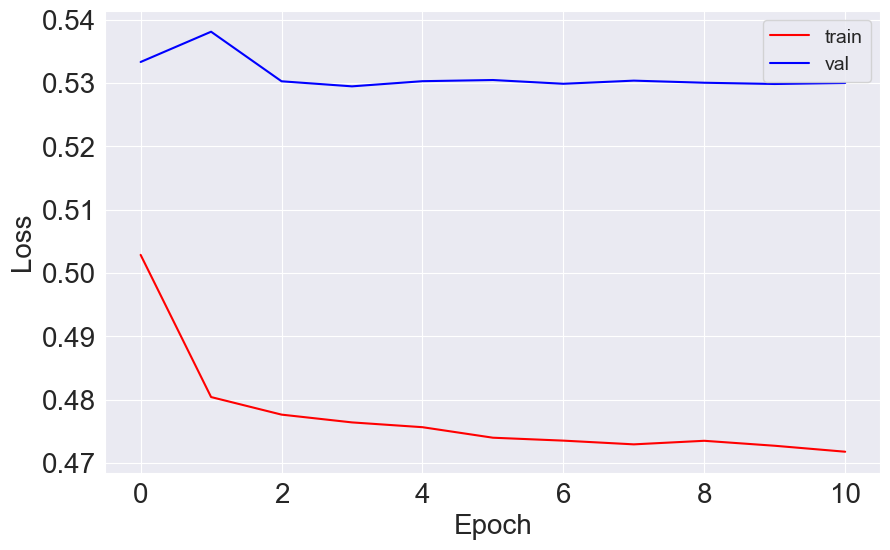

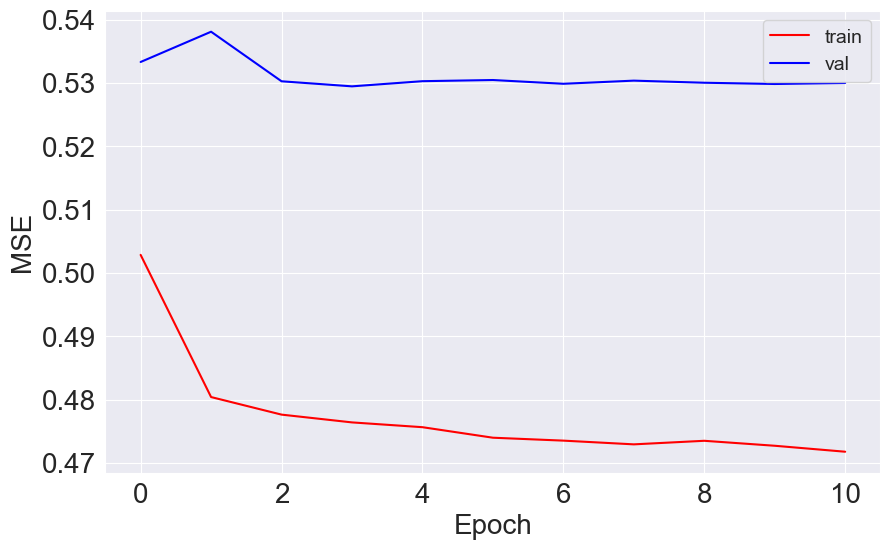

In [211]:
# Plot the loss function
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(np.sqrt(nn_history.history['loss']), 'r', label='train')
ax.plot(np.sqrt(nn_history.history['val_loss']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'Loss', fontsize=20)
ax.legend()
ax.tick_params(labelsize=20)

# Plot the accuracy
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(np.sqrt(nn_history.history['mse']), 'r', label='train')
ax.plot(np.sqrt(nn_history.history['val_mse']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'MSE', fontsize=20)
ax.legend()
ax.tick_params(labelsize=20)

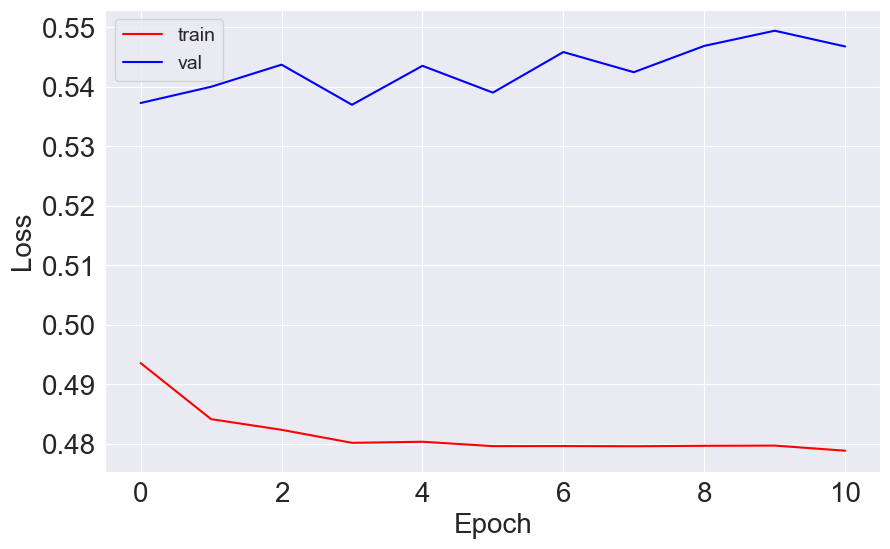

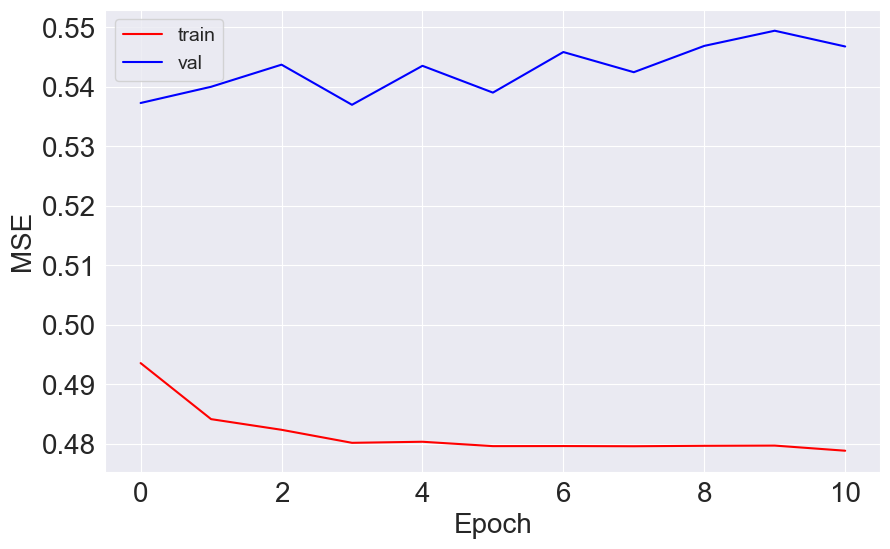

In [212]:
# Plot the loss function for nn_history2
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(np.sqrt(nn_history2.history['loss']), 'r', label='train')
ax.plot(np.sqrt(nn_history2.history['val_loss']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'Loss', fontsize=20)
ax.legend()
ax.tick_params(labelsize=20)

# Plot the accuracy
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(np.sqrt(nn_history2.history['mse']), 'r', label='train')
ax.plot(np.sqrt(nn_history2.history['val_mse']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'MSE', fontsize=20)
ax.legend()
ax.tick_params(labelsize=20)

Epoch 1/100
5905/5905 [==============================] - 7s 987us/step - loss: 0.2600 - mse: 0.2600 - val_loss: 0.3165 - val_mse: 0.3165
Epoch 2/100
5905/5905 [==============================] - 6s 942us/step - loss: 0.2414 - mse: 0.2414 - val_loss: 0.3214 - val_mse: 0.3214
Epoch 3/100
5905/5905 [==============================] - 6s 959us/step - loss: 0.2372 - mse: 0.2372 - val_loss: 0.4763 - val_mse: 0.4763
Epoch 4/100
5905/5905 [==============================] - 6s 954us/step - loss: 0.2365 - mse: 0.2365 - val_loss: 0.4977 - val_mse: 0.4977
Epoch 5/100
5905/5905 [==============================] - 6s 953us/step - loss: 0.2370 - mse: 0.2370 - val_loss: 0.4703 - val_mse: 0.4703
Epoch 6/100
5905/5905 [==============================] - 6s 972us/step - loss: 0.2372 - mse: 0.2372 - val_loss: 0.4100 - val_mse: 0.4100
Epoch 7/100
5905/5905 [==============================] - 6s 958us/step - loss: 0.2360 - mse: 0.2360 - val_loss: 0.5205 - val_mse: 0.5205
Epoch 8/100
5905/5905 [==============================] - 6s 955us/step - loss: 0.2367 - mse: 0.2367 - val_loss: 0.4923 - val_mse: 0.4923
Epoch 9/100
5905/5905 [==============================] - 6s 963us/step - loss: 0.2368 - mse: 0.2368 - val_loss: 0.5182 - val_mse: 0.5182
Epoch 10/100
5905/5905 [==============================] - 6s 952us/step - loss: 0.2367 - mse: 0.2367 - val_loss: 0.4361 - val_mse: 0.4361
Epoch 11/100
5905/5905 [==============================] - 6s 956us/step - loss: 0.2362 - mse: 0.2362 - val_loss: 0.5496 - val_mse: 0.5496
INFO:tensorflow:Assets written to: ram://c0a5df86-4c82-4080-8cb1-e0c555b69a07/assets
CPU times: total: 1min 49s
Wall time: 1min 5s


### 5. XGBoost Regression

XGBoost and LightGBM are gradient boosting frameworks that are widely used for regression tasks. They are highly efficient and perform well on a wide range of datasets. They are also good for performance.

In [214]:
%%time
from xgboost import XGBRegressor

# Check if the saved model file exists for each model
if os.path.exists('xgb_model.pkl'):
    # Load the model from the file if it exists
    with open('xgb_model.pkl', 'rb') as file:
        xgb_model = pickle.load(file)
        print(f"xgb_model loaded from xgb_model.pkl")
else:
    # Train the model if the file does not exist
    xgb_model = XGBRegressor(random_state=42)
    xgb_model.fit(X_train_scaled_df, y_train)
    with open('xgb_model.pkl', 'wb') as file:
        pickle.dump(xgb_model, file)
    
if os.path.exists('xgb_model2.pkl'):
    # Load the model from the file if it exists
    with open('xgb_model2.pkl', 'rb') as file:
        xgb_model2 = pickle.load(file)
        print(f"xgb_model2 loaded from xgb_model2.pkl")
else:
    # Train the model if the file does not exist
    xgb_model2 = XGBRegressor(random_state=42)
    xgb_model2.fit(X_train_pca_df, y_train)
    with open('xgb_model2.pkl', 'wb') as file:   
        pickle.dump(xgb_model2, file)


xgb_model loaded from xgb_model.pkl
xgb_model2 loaded from xgb_model2.pkl
CPU times: total: 0 ns
Wall time: 7.01 ms


CPU times: total: 2min 7s
Wall time: 9.06 s

xgb_model2
CPU times: total: 1min 16s
Wall time: 6.67 s


### - Saving the trained models to a file

By saving the trained models to a file, we can avoid retraining them every time we run your project and we can simply load the pre-trained models from the file.

In [109]:
# %%time
# import pickle
# 
# # Assuming you have already trained your models and stored them in variables:
# # rforest_model, svr_model, nn_model, etc.
# 
# # Save the models to files
# with open('rforest_model.pkl', 'wb') as file:
#     pickle.dump(rforest_model, file)
#     print("rforest_model saved to the file rforest_model.pkl")
# 
# with open('rforest_model2.pkl', 'wb') as file:
#     pickle.dump(rforest_model2, file)
#     print("rforest_model2 saved to the file rforest_model2.pkl")
# 
# with open('gboosting_model.pkl', 'wb') as file:
#     pickle.dump(gboosting_model, file)
# 
# with open('gboosting_model2.pkl', 'wb') as file:
#     pickle.dump(gboosting_model2, file)
# 
# with open('svr_model.pkl', 'wb') as file:
#     pickle.dump(svr_model, file)
# 
# with open('nn_history.pkl', 'wb') as file:
#     pickle.dump(nn_history, file)
# 
# with open('xgb_model.pkl', 'wb') as file:
#     pickle.dump(xgb_model, file)
# 
# with open('xgb_model2.pkl', 'wb') as file:   
#     pickle.dump(xgb_model2, file)

# ctrl + / for commenting

This code will save each trained model to a separate file with the specified names ('rforest_model.pkl', 'svr_model.pkl', etc.).

### - Evaluate Trained models on the test set:

In [217]:
%%time
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

models_trained = [rforest_model, rforest_model2, gboosting_model, gboosting_model2, svr_model, svr_model2, nn_model, nn_model2, xgb_model,  xgb_model2]
model_names_trained = ['Random Forest', 'Random Forest 2', 'Gradient Boosting', 'Gradient Boosting 2', 'SVR', 'SVR 2', 'Neural Networks', 'Neural Networks 2', 'XGBoost',  'XGBoost 2']

pickle_file_path = 'results_trained.pkl'
if os.path.exists(pickle_file_path):
    results_trained_df = pd.read_pickle(pickle_file_path)
else:
    results_trained = []
    for model, name in zip(models_trained, model_names_trained):
        if model == rforest_model or model == gboosting_model or model == svr_model or model == nn_model or model == xgb_model:
            y_predict_val = model.predict(X_val_scaled_df)
            test_score = model.predict(X_test_scaled_df)
        else:
            y_predict_val = model.predict(X_val_pca_df)
            test_score = model.predict(X_test_pca_df)
        mse = mean_squared_error(y_val, y_predict_val)
        mae = mean_absolute_error(y_val, y_predict_val)
        r2 = r2_score(y_val, y_predict_val)
        test_mae = mean_absolute_error(y_test, test_score)

        results_trained.append([name, mse, mae, r2, test_mae])
        print(f"Model: {name}")
        print(f"Mean Squared Error: {mse:.3f}")
        print(f"Mean Absolute Error: {mae:.3f}")
        print(f"R-squared: {r2:.2f}\n\n")
    
    #    print(f"Test Score on test set (MAE): {mean_squared_error(y_test, test_score)}\n\n")

    # Create a DataFrame to store the results
    columns = ['Model', 'Mean Squared Error (Validation)', 'Mean Absolute Error (Validation)', 'R-squared (Validation)', 'Mean Absolute Error (Test)']
    results_trained_df = pd.DataFrame(results_trained, columns=columns)
    results_trained_df.to_pickle(pickle_file_path)


print(results_trained_df)

Model: Random Forest
Mean Squared Error: 0.286
Mean Absolute Error: 0.399
R-squared: 0.35

Model: Random Forest 2
Mean Squared Error: 0.290
Mean Absolute Error: 0.403
R-squared: 0.34


Model: Gradient Boosting
Mean Squared Error: 0.273
Mean Absolute Error: 0.390
R-squared: 0.38


Model: Gradient Boosting 2
Mean Squared Error: 0.283
Mean Absolute Error: 0.399
R-squared: 0.35

Model: SVR
Mean Squared Error: 0.293
Mean Absolute Error: 0.401
R-squared: 0.33

Model: SVR 2
Mean Squared Error: 0.292
Mean Absolute Error: 0.401
R-squared: 0.33


830/830 [==============================] - 0s 563us/step
Model: Neural Networks
Mean Squared Error: 0.280
Mean Absolute Error: 0.395
R-squared: 0.36


830/830 [==============================] - 0s 566us/step
Model: Neural Networks 2
Mean Squared Error: 0.288
Mean Absolute Error: 0.402
R-squared: 0.34


Model: XGBoost
Mean Squared Error: 0.265
Mean Absolute Error: 0.383
R-squared: 0.39


Model: XGBoost 2
Mean Squared Error: 0.279
Mean Absolute Error: 0.3

In [430]:
print(results_trained_df)

                 Model  Mean Squared Error (Validation)  \
0        Random Forest                         0.285878   
1      Random Forest 2                         0.290110   
2    Gradient Boosting                         0.272657   
3  Gradient Boosting 2                         0.282945   
4                  SVR                         0.292683   
5                SVR 2                         0.292481   
6      Neural Networks                         0.280317   
7    Neural Networks 2                         0.288362   
8              XGBoost                         0.264630   
9            XGBoost 2                         0.278846   

   Mean Absolute Error (Validation)  R-squared (Validation)  \
0                          0.398523                0.345540   
1                          0.402725                0.335851   
2                          0.390453                0.375806   
3                          0.398500                0.352254   
4                          0.401132

In [218]:
results_trained_df

,Model,Mean Squared Error (Validation),Mean Absolute Error (Validation),R-squared (Validation),Mean Absolute Error (Test)
0,Random Forest,0.285878,0.398523,0.345540,0.398455
1,Random Forest 2,0.290110,0.402725,0.335851,0.405746
2,Gradient Boosting,0.272657,0.390453,0.375806,0.392536
3,Gradient Boosting 2,0.282945,0.398500,0.352254,0.399657
4,SVR,0.292683,0.401132,0.329962,0.403784
5,SVR 2,0.292481,0.401161,0.330424,0.403755
6,Neural Networks,0.280317,0.394917,0.358271,0.397201
7,Neural Networks 2,0.288362,0.401874,0.339853,0.403929
8,XGBoost,0.264630,0.382901,0.394184,0.385841
9,XGBoost 2,0.278846,0.394604,0.361638,0.397516


#### Choose the best performing model and evaluate on the test set


In [219]:
# Choose the best performing model and evaluate on the test set
#best_model = models_trained[np.argmax([model.score() for model in models_trained])]
# Find the index of the best performing model based on validation MSE
best_model_idx = results_trained_df['Mean Squared Error (Validation)'].idxmin()
best_model_name = results_trained_df.loc[best_model_idx, 'Model']
best_model = models_trained[best_model_idx]

# Evaluate the best model on the test set
if best_model in [rforest_model, gboosting_model, svr_model, nn_model, xgb_model]:
    y_predict_test = best_model.predict(X_test_scaled_df)
else:
    y_predict_test = best_model.predict(X_test_pca_df)

mse_test = mean_squared_error(y_test, y_predict_test)
mae_test = mean_absolute_error(y_test, y_predict_test)
r2_test = r2_score(y_test, y_predict_test)
print(f"Best Performing Model: {best_model}")
print(f"Mean Squared Error on Test Set: {mse_test:.2f}")
print(f"Mean Absolute Error on Test Set: {mae_test:.2f}")
print(f"R-squared on Test Set: {r2_test:.2f}")

Best Performing Model: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)
Mean Squared Error on Test Set: 0.27
Mean Absolute Error on Test Set: 0.39
R-squared on Test Set: 0.39


Best Performing Model: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

Mean Squared Error on Test Set: 0.27
Mean Absolute Error on Test Set: 0.39
R-squared on Test Set: 0.39


## VII. Hyperparameter Tuning

### a. Random Forest Regression

In [271]:
%%time
from sklearn.model_selection import RandomizedSearchCV #, GridSearchCV

import joblib

def tune_model_rf(estimator, param_distributions, train, n_iter=10, cv=kf, scoring='neg_mean_squared_error', random_state=42, model_name=''):
    model_file = f'{model_name}_random_search.pkl'
    
    if os.path.exists(model_file):
        # Load the tuned model from the file if it exists
        print(f"Loading {model_name} model from {model_file}")
        tuned_model = joblib.load(model_file)
    else:
        # Perform hyperparameter tuning with RandomizedSearchCV if the file does not exist
        print(f"Tuning {model_name} model...")
        rf_random_search = RandomizedSearchCV(
            estimator=estimator,
            param_distributions=param_distributions,
            n_iter=n_iter,
            cv=cv,
            scoring=scoring,
            random_state=random_state,
            n_jobs=-1,  # Parallelize the tuning process
            verbose=2
        )
        
        rf_random_search.fit(train, y_train)
        tuned_model = rf_random_search
        joblib.dump(tuned_model, model_file)
        print(f"{model_name} model tuned and saved to {model_file}")
    
    return tuned_model

# Define the hyperparameter distributions for Random Forest
param_random_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Tune the Random Forest model
tuned_rf_model = tune_model_rf(estimator=rforest_model, param_distributions=param_random_rf, n_iter=5, model_name='rf', train=X_train_scaled_df)

# We can use the tuned_rf_model for prediction and evaluation
#y_predict_val_rf = tuned_rf_model.best_estimator_.predict(X_val)

Tuning rf model...
Fitting 5 folds for each of 5 candidates, totalling 25 fits
rf model tuned and saved to rf_random_search.pkl
CPU times: total: 1min 53s
Wall time: 12min 29s


Tuning rf model...(with X_train_scaled_df)
Fitting 5 folds for each of 5 candidates, totalling 25 fits
rf model tuned and saved to rf_random_search.pkl
CPU times: total: 1min 53s
Wall time: 12min 29s



In [272]:
print(tuned_rf_model.best_params_)

{'n_estimators': 100, 'min_samples_split': 5, 'max_depth': 10}

In [306]:
print(tuned_rf_model.best_estimator_)

RandomForestRegressor(max_depth=10, min_samples_split=5, random_state=42)

rf_random_search model tuned and saved to rf_random_search.pkl(before scaling data)

CPU times: total: 36min 19s
Wall time: 36min 22s

In [274]:
%%time
# Tune the Random Forest model 2
tuned_rf_model2 = tune_model_rf(estimator=rforest_model2, param_distributions=param_random_rf, n_iter=10, model_name='rf2', train=X_train_pca_df)

Tuning rf2 model...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
rf2 model tuned and saved to rf2_random_search.pkl
CPU times: total: 1min 25s
Wall time: 10min 34s


Tuning rf2 model...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
rf2 model tuned and saved to rf2_random_search.pkl
CPU times: total: 1min 25s
Wall time: 10min 34s


In [276]:
print(tuned_rf_model2.best_params_)

{'n_estimators': 100, 'min_samples_split': 10, 'max_depth': 10}

Tuning rf2 model...(before pca applied)
rf2 model tuned and saved to rf2_random_search.pkl
CPU times: total: 11min 27s
Wall time: 16min 9s


In [221]:
print(tuned_rf_model.n_features_in_)
X_val_pca_df.shape

4


(25768, 3)

### b. Gradient Boosting Regression

In [278]:
%%time
import os
from sklearn.model_selection import RandomizedSearchCV
import joblib

def tune_model_gb(estimator, param_distributions, train, n_iter=10, cv=kf, scoring='neg_mean_squared_error', random_state=42, model_name=''):
    model_file = f'{model_name}_random_search.pkl'
    
    if os.path.exists(model_file):
        # Load the tuned model from the file if it exists
        print(f"Loading {model_name} model from {model_file}")
        tuned_model = joblib.load(model_file)
    else:
        # Perform hyperparameter tuning with RandomizedSearchCV if the file does not exist
        print(f"Tuning {model_name} model...")
        gb_random_search = RandomizedSearchCV(
            estimator=estimator,
            param_distributions=param_distributions,
            n_iter=n_iter,
            cv=cv,
            scoring=scoring,
            random_state=random_state,
            verbose=3,
            n_jobs=-1  # Parallelize the tuning process
        )
        gb_random_search.fit(train, y_train)
        tuned_model = gb_random_search
        joblib.dump(tuned_model, model_file)
        print(f"{model_name} model tuned and saved to {model_file}")
    
    return tuned_model

# Define the hyperparameter distributions for Gradient Boosting
param_random_gb = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.001, 0.01, 0.1, 0.5]
}

# Tune the Gradient Boosting model
tuned_gb_model = tune_model_gb(estimator=gboosting_model, param_distributions=param_random_gb, n_iter=10, model_name='gb', train=X_train_scaled_df)

# We can use the tuned_gb_model for prediction and evaluation
#y_predict_val_gb = tuned_gb_model.best_estimator_.predict(X_val)


Tuning gb model...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
gb model tuned and saved to gb_random_search.pkl
CPU times: total: 2min 56s
Wall time: 8min 52s


Tuning gb model...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
gb model tuned and saved to gb_random_search.pkl
CPU times: total: 2min 56s
Wall time: 8min 52s


In [282]:
print(tuned_gb_model.best_params_)

{'n_estimators': 300, 'learning_rate': 0.1}

In [283]:
%%time
# Tune the Gradient Boosting model2
tuned_gb_model2 = tune_model_gb(estimator=gboosting_model2, param_distributions=param_random_gb, n_iter=5, model_name='gb2', train=X_train_pca_df)


Tuning gb2 model...
Fitting 5 folds for each of 5 candidates, totalling 25 fits
gb2 model tuned and saved to gb2_random_search.pkl
CPU times: total: 43.1 s
Wall time: 2min 29s


Tuning gb2 model...
Fitting 5 folds for each of 5 candidates, totalling 25 fits
gb2 model tuned and saved to gb2_random_search.pkl
CPU times: total: 43.1 s
Wall time: 2min 29s


In [285]:
print(tuned_gb_model2.best_params_)

{'n_estimators': 100, 'learning_rate': 0.5}

### c. Support Vector Regression (SVR)


#### RandomizedSearchCV  (computationally expensive - +5 hours..)

In [5]:
# %%time
# def tune_model_svr(estimator, param_distributions, train, y_train, n_iter=10, cv=kf, scoring='neg_mean_squared_error', random_state=42, model_name=''):
#     model_file = f'{model_name}_random_search.pkl'
#     
#     if os.path.exists(model_file):
#         # Load the tuned model from the file if it exists
#         print(f"Loading {model_name} model from {model_file}")
#         tuned_model = joblib.load(model_file)
#     else:
#         # Perform hyperparameter tuning with RandomizedSearchCV if the file does not exist
#         print(f"Tuning {model_name} model...")
#         svr_random_search = RandomizedSearchCV(
#             estimator=estimator,
#             param_distributions=param_distributions,
#             n_iter=n_iter,
#             cv=cv,
#             scoring=scoring,
#             random_state=random_state,
#             verbose=3,
#             n_jobs=-1  # Parallelize the tuning process
#         )
#         svr_random_search.fit(train, y_train)
#         tuned_model = svr_random_search
#         joblib.dump(tuned_model, model_file)
#         print(f"{model_name} model tuned and saved to {model_file}")
#     
#     return tuned_model
# 
# # Define the hyperparameter distributions for SVR
# param_random_svr = {
#     'C': [0.1, 1, 10],
#     'kernel': ['linear', 'rbf', 'poly'],
#     'gamma': ['scale', 'auto', 0.1, 1],
# }
# 
# # Choose a smaller subset of the data for tuning
# subset_size = 3000
# X_train_subset = X_train_scaled_df[:subset_size]
# y_train_subset = y_train[:subset_size]
# 
# # Tune the SVR model
# tuned_svr_model = tune_model_svr(estimator=svr_model, param_distributions=param_random_svr, n_iter=3, model_name='svr', train=X_train_subset, y_train=y_train_subset)
# # Print the best hyperparameters found
# print("Best Hyperparameters:")
# print(tuned_svr_model.best_params_)
# 
# # We can use the tuned_svr_model for prediction and evaluation
# #y_predict_val_svr = tuned_svr_model.best_estimator_.predict(X_val_pca)

NameError: name 'X_train_scaled_df' is not defined

svr model tuned and saved to svr_random_search.pkl
CPU times: total: 1h 14min 46s
Wall time: 1h 15min 11s

In [130]:
# %%time
# 
# def tune_model_svr(estimator, param_distributions, train, y_train, n_iter=10, cv=3, scoring='neg_mean_squared_error', random_state=42, model_name=''):
#     model_file = f'{model_name}_random_search.pkl'
#     
#     if os.path.exists(model_file):
#         # Load the tuned model from the file if it exists
#         print(f"Loading {model_name} model from {model_file}")
#         tuned_model = joblib.load(model_file)
#     else:
#         # Perform hyperparameter tuning with RandomizedSearchCV if the file does not exist
#         print(f"Tuning {model_name} model...")
#         svr_random_search = RandomizedSearchCV(
#             estimator=estimator,
#             param_distributions=param_distributions,
#             n_iter=n_iter,
#             cv=cv,
#             scoring=scoring,
#             random_state=random_state,
#             verbose=3,
#             n_jobs=-1  # Parallelize the tuning process
#         )
#         svr_random_search.fit(train, y_train)
#         tuned_model = svr_random_search
#         joblib.dump(tuned_model, model_file)
#         print(f"{model_name} model tuned and saved to {model_file}")
#     
#     return tuned_model
# 
# # Define the hyperparameter distributions for SVR
# param_random_svr = {
#     'C': [0.1, 1, 10],
#     'kernel': ['linear', 'rbf', 'poly'],
#     'gamma': ['scale', 'auto', 0.1, 1],
# }
# 
# 
# 
# 
# subset_size = 500
# X_train_pca_subset = X_train_pca_df[:subset_size]
# y_train_subset = y_train[:subset_size]
# # Tune the SVR model 2
# tuned_svr_model2 = tune_model_svr(estimator=svr_model2, param_distributions=param_random_svr, n_iter=4, model_name='svr2', train=X_train_pca_subset, y_train=y_train_subset)
# print("Best Hyperparameters:")
# print(tuned_svr_model2.best_params_)


Tuning svr2 model...
Fitting 3 folds for each of 4 candidates, totalling 12 fits


KeyboardInterrupt: 

3h 2m 32s (full train data)

#### BayesSearchCV

In [290]:
%%time
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.metrics import mean_squared_error
from sklearn.svm import SVR


def tune_model_svr_bayesian(estimator, param_distributions, train, y_train, n_iter=10, cv=kf, scoring='neg_mean_squared_error', random_state=42, model_name=''):
    model_file = f'{model_name}_bayes_search.pkl'
    
    if os.path.exists(model_file):
        # Load the tuned model from the file if it exists
        print(f"Loading {model_name} model from {model_file}")
        tuned_model = joblib.load(model_file)
    else:
        # Perform hyperparameter tuning with RandomizedSearchCV if the file does not exist
        print(f"Tuning {model_name} model...")
        svr_bayes_search = BayesSearchCV(
            estimator,
            param_distributions,
            n_iter=n_iter,
            cv=cv,
            scoring=scoring,
            random_state=random_state,
            verbose=3,
            n_jobs=-1  # Parallelize the tuning process
        )
        svr_bayes_search.fit(train, y_train)
        tuned_model = svr_bayes_search
        joblib.dump(tuned_model, model_file)
        print(f"{model_name} model tuned and saved to {model_file}")
    
    return tuned_model

# Define the hyperparameter distributions for SVR
param_bayes_svr = {
    'C': Real(0.1, 10.0, prior='log-uniform'),
    'kernel': Categorical(['linear', 'rbf', 'poly']),
    'gamma': Categorical(['scale', 'auto'])
}

# Choose a smaller subset of the data for tuning
subset_size = 10000
X_train_subset = X_train_scaled_df[:subset_size]
y_train_subset = y_train[:subset_size]

# Tune the SVR model
tuned_svr_model_bayesian = tune_model_svr_bayesian(estimator=svr_model, param_distributions=param_bayes_svr, n_iter=10, model_name='svr', train=X_train_subset, y_train=y_train_subset)
# Print the best hyperparameters found
print("Best Hyperparameters:")
print(tuned_svr_model_bayesian.best_params_)

# We can use the tuned_svr_model for prediction and evaluation
#y_predict_val_svr = tuned_svr_model.best_estimator_.predict(X_val_pca)

Tuning svr model...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
svr model tuned and saved to svr_bayes_search.pkl
Best Hyperparameters:
OrderedDict([('C', 0.661009829541915), ('gamma', 'scale'), ('kernel', 'rbf')])
CPU times: total: 7.02 s
Wall time: 1min 49s


Tuning svr model...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
svr model tuned and saved to svr_bayes_search.pkl

Best Hyperparameters:
OrderedDict([('C', 0.661009829541915), ('gamma', 'scale'), ('kernel', 'rbf')])
CPU times: total: 7.02 s
Wall time: 1min 49s


had an error with bayessearch in the beginning:
AttributeError: module 'numpy' has no attribute 'int'.
Replaced all np.int with int in the file 'anaconda3\envs\myenv\Lib\site-packages\skopt\space\transformers.py'
restarted kernel,
and error fixed.

In [291]:
X_train_pca_df

,Principal Component 1,Principal Component 2,Principal Component 3
113579,-0.115687,0.040621,-0.038295
9062,0.273665,-0.071848,0.109411
66455,-0.108219,-0.048467,-0.052228
145423,-0.140325,0.061041,-0.080830
123721,-0.051820,-0.170188,-0.023328
...,...,...,...
112817,-0.218156,0.222266,0.100969
15433,-0.109599,0.113506,0.171801
103243,-0.167022,0.184111,0.096531
48195,-0.051239,-0.102071,-0.011199


In [292]:
%%time
# Choose a smaller subset of the data for tuning
subset_size = 25000
X_train_pca_subset = X_train_pca_df[:subset_size]
y_train_subset = y_train[:subset_size]

# Tune the SVR model 2 with bayesian
tuned_svr_model_bayesian2 = tune_model_svr_bayesian(estimator=svr_model2, param_distributions=param_bayes_svr, n_iter=10, model_name='svr2', train=X_train_pca_subset, y_train=y_train_subset)
# Print the best hyperparameters found
print("Best Hyperparameters:")
print(tuned_svr_model_bayesian2.best_params_)


Tuning svr2 model...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
svr2 model tuned and saved to svr2_bayes_search.pkl
Best Hyperparameters:
OrderedDict([('C', 8.146216961026964), ('gamma', 'scale'), ('kernel', 'rbf')])
CPU times: total: 26.2 s
Wall time: 4min 15s


Tuning svr2 model...
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
svr2 model tuned and saved to svr2_bayes_search.pkl
Best Hyperparameters:
OrderedDict([('C', 8.146216961026964), ('gamma', 'scale'), ('kernel', 'rbf')])
CPU times: total: 26.2 s
Wall time: 4min 15s


### d. Neural Networks - hyperopt


In [298]:
%%time
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from hyperopt import fmin, tpe, hp, Trials
from sklearn.metrics import mean_squared_error

# Define the objective function
def objective(params):
    model = create_neural_network(
        learning_rate=params['learning_rate'],
        momentum=params['momentum'],
        dropout_rate=params['dropout_rate'],
        epochs=int(params['epochs']),
        input_dim=X_train_scaled_df
    )
    
    model.compile(optimizer='adam', loss='mse')  # Adjust optimizer and loss if needed
    
    model.fit(X_train_scaled_df, y_train, validation_data=(X_val_scaled_df, y_val), verbose=0)
    
    y_pred = model.predict(X_val_scaled_df)
    mse = mean_squared_error(y_val, y_pred)
    
    return mse

# Check if the tuned model file exists
tuned_model_file = 'nn_tuned_tuner_hyperopt.joblib'

if os.path.exists(tuned_model_file):
    # Load the tuned model from the file
    nn_tuned_tuner_hyperopt = joblib.load(tuned_model_file)
else:
    # Define the hyperparameter search space
    space = {
        'learning_rate': hp.loguniform('learning_rate', np.log(0.0001), np.log(0.01)),
        'momentum': hp.uniform('momentum', 0.1, 0.9),
        'dropout_rate': hp.uniform('dropout_rate', 0.0, 0.5),
        'epochs': hp.quniform('epochs', 10, 110, 1)
    }

    # Perform hyperparameter search
    nn_tuned_tuner_hyperopt = fmin(
        fn=objective,
        space=space,
        algo=tpe.suggest,
        max_evals=10,  # Number of iterations
        trials=Trials(),  # Required for Hyperopt to keep track of results
    )

    # Save the tuned tuner to a file
    joblib.dump(nn_tuned_tuner_hyperopt, tuned_model_file)

print("Best Hyperparameters:")
print(nn_tuned_tuner_hyperopt)

# Get the best hyperparameters
best_learning_rate_hyperopt = nn_tuned_tuner_hyperopt['learning_rate']
best_momentum_hyperopt = nn_tuned_tuner_hyperopt['momentum']
best_dropout_rate_hyperopt = nn_tuned_tuner_hyperopt['dropout_rate']
best_epochs_hyperopt = int(nn_tuned_tuner_hyperopt['epochs'])

# Create the best model
best_nn_model = create_neural_network(
    learning_rate=best_learning_rate_hyperopt,
    momentum=best_momentum_hyperopt,
    dropout_rate=best_dropout_rate_hyperopt,
    epochs=best_epochs_hyperopt,
    input_dim=X_train_scaled_df
)

# Compile the model
best_nn_model.compile(optimizer='adam', loss='mse')  # Adjust optimizer and loss if needed

# Train the best model on the entire training dataset
best_nn_model.fit(X_train_scaled_df, y_train, verbose=1)

# Save the best model to disk
best_model_file = 'best_nn_model_hyperopt.h5'
best_nn_model.save(best_model_file)
print(f"Best model saved to file {best_model_file}")

# Later, we can load the best model and use it for predictions
loaded_best_nn_model = tf.keras.models.load_model(best_model_file)
y_pred_val = loaded_best_nn_model.predict(X_val_scaled_df)
# ... (rest of your prediction code)



806/806 [==============================] - 1s 607us/step

806/806 [==============================] - 1s 594us/step

806/806 [==============================] - 1s 594us/step

806/806 [==============================] - 1s 592us/step

806/806 [==============================] - 1s 586us/step

806/806 [==============================] - 1s 583us/step

806/806 [==============================] - 1s 574us/step

806/806 [==============================] - 1s 583us/step

806/806 [==============================] - 1s 576us/step

806/806 [==============================] - 1s 577us/step

100%|██████████| 10/10 [01:06<00:00,  6.68s/trial, best loss: 0.28228757065384763]
Best Hyperparameters:
{'dropout_rate': 0.3337388960850514, 'epochs': 104.0, 'learning_rate': 0.002509538499018026, 'momentum': 0.5668255997767192}
5905/5905 [==============================] - 6s 870us/step - loss: 0.2625
Best model saved to file best_nn_model_hyperopt.h5
806/806 [==============================] - 1s 579us/step
CPU time


100%|██████████| 10/10 [01:06<00:00,  6.68s/trial, best loss: 0.28228757065384763]
Best Hyperparameters:
{'dropout_rate': 0.3337388960850514, 'epochs': 104.0, 'learning_rate': 0.002509538499018026, 'momentum': 0.5668255997767192}
5905/5905 [==============================] - 6s 870us/step - loss: 0.2625
Best model saved to file best_nn_model_hyperopt.h5
806/806 [==============================] - 1s 579us/step

CPU times: total: 1min 57s
Wall time: 1min 13s


do the tuning for X_train_pca_df:

In [235]:
%%time
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from hyperopt import fmin, tpe, hp
from sklearn.metrics import mean_squared_error

# Define the objective function
def objective2(params):
    model = create_neural_network(
        learning_rate=params['learning_rate'],
        momentum=params['momentum'],
        dropout_rate=params['dropout_rate'],
        epochs=int(params['epochs']),
        input_dim=X_train_pca_df
    )
    
    model.compile(optimizer='adam', loss='mse')  # Adjust optimizer and loss if needed
    
    model.fit(X_train_pca_df, y_train, validation_data=(X_val_pca_df, y_val))
    
    y_pred = model.predict(X_val_pca_df)
    mse = mean_squared_error(y_val, y_pred)
    
    return mse

# Check if the tuned model file exists
tuned_model_file2 = 'nn_tuned_tuner_hyperopt2.joblib'

if os.path.exists(tuned_model_file2):
    # Load the tuned model from the file
    nn_tuned_tuner_hyperopt2 = joblib.load(tuned_model_file2)
else:
    # Define the hyperparameter search space
    space = {
        'learning_rate': hp.loguniform('learning_rate', np.log(0.0001), np.log(0.01)),
        'momentum': hp.uniform('momentum', 0.1, 0.9),
        'dropout_rate': hp.uniform('dropout_rate', 0.0, 0.5),
        'epochs': hp.quniform('epochs', 10, 110, 1)
    }
    # Perform hyperparameter search
    nn_tuned_tuner_hyperopt2 = fmin(
        fn=objective2,
        space=space,
        algo=tpe.suggest,
        max_evals=10  # Number of iterations
    )
    # Save the tuned tuner to a file
    joblib.dump(nn_tuned_tuner_hyperopt2, tuned_model_file2)

print("Best Hyperparameters:")
print(nn_tuned_tuner_hyperopt2)


# Get the best hyperparameters
best_learning_rate_hyperopt2 = nn_tuned_tuner_hyperopt2['learning_rate']
best_momentum_hyperopt2 = nn_tuned_tuner_hyperopt2['momentum']
best_dropout_rate_hyperopt2 = nn_tuned_tuner_hyperopt2['dropout_rate']
best_epochs_hyperopt2 = int(nn_tuned_tuner_hyperopt2['epochs'])

# Create the best model
best_nn_model2 = create_neural_network(
    learning_rate=best_learning_rate_hyperopt2,
    momentum=best_momentum_hyperopt2,
    dropout_rate=best_dropout_rate_hyperopt2,
    epochs=best_epochs_hyperopt2,
    input_dim=X_train_pca_df
)

# Compile the model
best_nn_model2.compile(optimizer='adam', loss='mse')  # Adjust optimizer and loss if needed

# Train the best model on the entire training dataset
best_nn_model2.fit(X_train_pca_df, y_train, verbose=1)

# Save the best model to disk
best_model_file2 = 'best_nn_model_hyperopt2.h5'
best_nn_model2.save(best_model_file2)
print(f"Best model saved to file {best_model_file2}")

# Later, we can load the best model and use it for predictions
#loaded_best_nn_model2 = tf.keras.models.load_model(best_model_file2)
#y_pred_val = loaded_best_nn_model2.predict(X_val_pca_df)
# ... (rest of your prediction code)



5905/5905 [==============================] - 7s 1ms/step - loss: 0.2780 - val_loss: 0.2966

806/806 [==============================] - 1s 590us/step

5905/5905 [==============================] - 6s 973us/step - loss: 0.2569 - val_loss: 0.2865

806/806 [==============================] - 1s 604us/step

5905/5905 [==============================] - 6s 993us/step - loss: 0.2463 - val_loss: 0.2867

806/806 [==============================] - 1s 603us/step

5905/5905 [==============================] - 6s 983us/step - loss: 0.2605 - val_loss: 0.2925

806/806 [==============================] - 1s 587us/step

5905/5905 [==============================] - 6s 991us/step - loss: 0.2516 - val_loss: 0.2895

806/806 [==============================] - 1s 593us/step

5905/5905 [==============================] - 6s 986us/step - loss: 0.2527 - val_loss: 0.2893

806/806 [==============================] - 1s 591us/step

5905/5905 [==============================] - 6s 978us/step - loss: 0.2614 - val_loss: 0.29

 1/806 [..............................] - ETA: 48s                              
 83/806 [==>...........................] - ETA: 0s 
168/806 [=====>........................] - ETA: 0s
256/806 [========>.....................] - ETA: 0s
344/806 [===========>..................] - ETA: 0s
430/806 [===============>..............] - ETA: 0s
517/806 [==================>...........] - ETA: 0s
600/806 [=====================>........] - ETA: 0s
688/806 [========================>.....] - ETA: 0s
776/806 [===========================>..] - ETA: 0s
806/806 [==============================] - 1s 582us/step

100%|██████████| 10/10 [01:14<00:00,  7.45s/trial, best loss: 0.28653451183189993]
Best Hyperparameters:
{'dropout_rate': 0.1506556154557538, 'epochs': 53.0, 'learning_rate': 0.0007482544731455019, 'momentum': 0.2632593069069997}
5905/5905 [==============================] - 6s 856us/step - loss: 0.2597
Best model saved to file best_nn_model_hyperopt2.h5
CPU times: total: 2min 6s
Wall time: 1min 20s

### d0. Neural Networks - Keras Tuner skopt  (expensive and errors)

### d1. Neural Networks - optuna (too computationally expensive - 3h)

In [114]:
# %%time
# import optuna
# import os
# import json
# import tensorflow as tf
# from tensorflow import keras
# 
# # Define the objective function for Optuna
# def objective(trial):
#     # Sample hyperparameters
#     dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)
#     learning_rate = trial.suggest_float('learning_rate', 0.001, 0.1)
#     momentum = trial.suggest_float('momentum', 0.1, 0.9)
#     batch_size = trial.suggest_categorical('batch_size', [16, 32, 64, 128])
#     epochs = trial.suggest_categorical('epochs', [50, 100, 150, 200])
# 
#     # Create the Keras model
#     model = create_neural_network(learning_rate=learning_rate, momentum=momentum, dropout_rate=dropout_rate, epochs=epochs)
# 
#     # Set early stopping to prevent overfitting
#     early_stopping = EarlyStopping(patience=7, restore_best_weights=True)
# 
#     # Train the model on the training data and validate on the validation data
#     model.fit(
#         X_train[numerical_features_locationadded],
#         y_train,
#         epochs=epochs,
#         batch_size=batch_size,
#         validation_data=(X_val[numerical_features_locationadded], y_val),
#         callbacks=[early_stopping],
#         verbose=0
#     )
# 
#     # Evaluate the model on the validation data and return the mean squared error
#     val_score = model.evaluate(X_val[numerical_features_locationadded], y_val, verbose=0)[1]
#     return val_score
# 
# def hyperparameter_tuning_optuna_nn(n_trials=100, study_name='my_study_nn'):
#     study_file = study_name + '.pkl'
#     best_hyperparameters_file = 'best_nn_hyperparameters.json'
#     best_model_file = 'best_nn_model.h5'
# 
#     # Check if the study file exists
#     if os.path.exists(study_file):
#         # Load the existing study from the file
#         #study = optuna.create_study(
#         #   study_name=study_name,
#         #  storage=f"sqlite:///{study_file}",
#         #    load_if_exists=True,
#         #)
#         study = optuna.load_study(study_name=study_name, storage=f'sqlite:///{study_file}')
#         print(f"Existing study loaded from {study_file} file")
#         
#         #print(f"Existing study loaded from {study_file} file")
#     else:
#         # Create a new study and perform the hyperparameter search using Optuna
#         study = optuna.create_study(direction='minimize', study_name=study_name, storage=f'sqlite:///{study_file}')
#         study.optimize(objective, n_trials=n_trials)
#         
#         # Save the study to the file
#         study.trials_dataframe().to_csv(study_file)
# 
# 
#     # Check if the best hyperparameters file exists
#     if os.path.exists(best_hyperparameters_file):
#         # Load the best hyperparameters from the file
#         with open(best_hyperparameters_file, 'r') as f:
#             best_params = json.load(f)
#     else:
#         # Get the best hyperparameters from the study
#         best_params = study.best_params
#         # Save the best hyperparameters to a file (JSON)
#         with open(best_hyperparameters_file, 'w') as f:
#             json.dump(best_params, f)
#         print("Best parameters saved to the file, best_nn_hyperparameters.json")
# 
# 
#     # Check if the best model file exists
#     if os.path.exists(best_model_file):
#         # Load the best model from the file
#         best_model = keras.models.load_model(best_model_file)
#     else:
#         # Create and train the best model using the best hyperparameters
#         best_model = create_neural_network(dropout_rate=best_params['dropout_rate'],
#                                            learning_rate=best_params['learning_rate'],
#                                            momentum=best_params['momentum'],
#                                            epochs=best_params['epochs'])
#         # Set early stopping to prevent overfitting
#         early_stopping = EarlyStopping(patience=10, restore_best_weights=True)  #Stop training when a monitored metric has stopped improving.
#         # Train the best model on the full training data and validate on the validation data
#         best_model.fit(X_train[numerical_features_locationadded], y_train,
#                        epochs=best_params['epochs'],
#                        batch_size=best_params['batch_size'],
#                        validation_data=(X_val[numerical_features_locationadded], y_val),
#                        verbose=0, callbacks=[early_stopping])
#         
#         # Save the best model
#         best_model.save(best_model_file)
#         print(f"Best model trained with X_train[numerical_features_locationadded], validated with X_val[numerical_features_locationadded], and saved to the file, {best_model_file}")
#     
# 
# # Call the function to perform hyperparameter tuning
# hyperparameter_tuning_optuna_nn(n_trials=100)
# 
# best_hyperparameters_file = 'best_nn_hyperparameters.json'
# best_model_file = 'best_nn_model.h5'
# if os.path.exists(best_hyperparameters_file):
#     # Load the best hyperparameters from the file
#     with open(best_hyperparameters_file, 'r') as f:
#         best_params_nn = json.load(f)
#     print(f"Best nn hyperparameters loaded from the file, {best_hyperparameters_file}")
# if os.path.exists(best_model_file):
#     # Load the best model from the file
#     best_model_nn = keras.models.load_model(best_model_file)
#     print(f"Best nn model loaded from the file, {best_model_file}")
# 
# """
# # Get the best hyperparameters and model
# best_params = study.best_params
# best_model = create_neural_network(dropout_rate=best_params['dropout_rate'], learning_rate=best_params['learning_rate'], momentum=best_params['momentum'])
# 
# # Train the best model on the full training data
# best_model.fit(X_train, y_train, epochs=100, batch_size=best_params['batch_size'], verbose=0)
# 
# # Evaluate on the test set
# test_score = best_model.evaluate(X_test, y_test, verbose=0)[1]
# print(f"Test Score (MSE): {test_score}")
# """

Existing study loaded from my_study_nn.pkl file
Best model trained with X_train[numerical_features_locationadded], validated with X_val[numerical_features_locationadded], and saved to the file, best_nn_model.h5
Best nn hyperparameters loaded from the file, best_nn_hyperparameters.json
Best nn model loaded from the file, best_nn_model.h5
CPU times: total: 4min 11s
Wall time: 2min 52s


'\n# Get the best hyperparameters and model\nbest_params = study.best_params\nbest_model = create_neural_network(dropout_rate=best_params[\'dropout_rate\'], learning_rate=best_params[\'learning_rate\'], momentum=best_params[\'momentum\'])\n\n# Train the best model on the full training data\nbest_model.fit(X_train, y_train, epochs=100, batch_size=best_params[\'batch_size\'], verbose=0)\n\n# Evaluate on the test set\ntest_score = best_model.evaluate(X_test, y_test, verbose=0)[1]\nprint(f"Test Score (MSE): {test_score}")\n'

Executed in 3h 2m 32s

In [115]:
#best_params_nn

{'dropout_rate': 0.1409261291340914,
 'learning_rate': 0.09551075408699548,
 'momentum': 0.1494320819116141,
 'batch_size': 16,
 'epochs': 200}

[I 2023-08-04 16:56:28,899] Trial 99 finished with value: 0.28738343715667725 and parameters: {'dropout_rate': 0.13114790675230317, 'learning_rate': 0.08032125978988923, 'momentum': 0.17225150193359284, 'batch_size': 16, 'epochs': 200}. Best is trial 43 with value: 0.2830849885940552.

Executed in 3h 2m 32s

[I 2023-08-04 15:07:06,717] Trial 43 finished with value: 0.2830849885940552 and parameters: {'dropout_rate': 0.1409261291340914, 'learning_rate': 0.09551075408699548, 'momentum': 0.1494320819116141, 'batch_size': 16, 'epochs': 200}. Best is trial 43 with value: 0.2830849885940552.


best_params:  {'dropout_rate': 0.1409261291340914, 'learning_rate': 0.09551075408699548, 'momentum': 0.1494320819116141, 'batch_size': 16, 'epochs': 200}
best_trial:  FrozenTrial(number=43, state=TrialState.COMPLETE, values=[0.2830849885940552], datetime_start=datetime.datetime(2023, 8, 4, 15, 3, 31, 538026), datetime_complete=datetime.datetime(2023, 8, 4, 15, 7, 6, 716643), params={'dropout_rate': 0.1409261291340914, 'learning_rate': 0.09551075408699548, 'momentum': 0.1494320819116141, 'batch_size': 16, 'epochs': 200}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'dropout_rate': FloatDistribution(high=0.5, log=False, low=0.1, step=None), 'learning_rate': FloatDistribution(high=0.1, log=False, low=0.001, step=None), 'momentum': FloatDistribution(high=0.9, log=False, low=0.1, step=None), 'batch_size': CategoricalDistribution(choices=(16, 32, 64, 128)), 'epochs': CategoricalDistribution(choices=(50, 100, 150, 200))}, trial_id=43, value=None)


### e. XGBoost Regression

In [293]:
%%time
from scipy.stats import randint

def tune_model_xgb(estimator, param_distributions, train, n_iter=10, cv=kf, scoring='neg_mean_squared_error', random_state=42, model_name=''):
    model_file = f'{model_name}_random_search.pkl'
    
    if os.path.exists(model_file):
        # Load the tuned model from the file if it exists
        print(f"Loading {model_name} model from {model_file}")
        tuned_model = joblib.load(model_file)
    else:
        # Perform hyperparameter tuning with RandomizedSearchCV if the file does not exist
        print(f"Tuning {model_name} model...")
        xgb_random_search = RandomizedSearchCV(
            estimator=estimator,
            param_distributions=param_distributions,
            n_iter=n_iter,
            cv=cv,
            scoring=scoring,
            random_state=random_state,
            verbose=3,
            #n_jobs=-1  # Parallelize the tuning process
        )
        xgb_random_search.fit(train, y_train)
        tuned_model = xgb_random_search
        joblib.dump(tuned_model, model_file)
        print(f"{model_name} model tuned and saved to {model_file}")
    
    return tuned_model

param_random_xgb = {
    'n_estimators': randint(50, 300),
    'learning_rate': [0.01, 0.1, 0.5],
    'max_depth': [None, 5, 10],
    'min_child_weight': randint(1, 21)
}

# Tune the XGB model
tuned_xgb_model = tune_model_xgb(estimator=xgb_model, param_distributions=param_random_xgb, n_iter=10, model_name='xgb', train=X_train_scaled_df)

# We can use the tuned_svr_model for prediction and evaluation
#y_predict_val_xgb = tuned_xgb_model.best_estimator_.predict(X_val_scaled_df)


Tuning xgb model...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END learning_rate=0.5, max_depth=None, min_child_weight=15, n_estimators=156;, score=-0.203 total time=   7.8s
[CV 2/5] END learning_rate=0.5, max_depth=None, min_child_weight=15, n_estimators=156;, score=-0.211 total time=   6.1s
[CV 3/5] END learning_rate=0.5, max_depth=None, min_child_weight=15, n_estimators=156;, score=-0.208 total time=   5.9s
[CV 4/5] END learning_rate=0.5, max_depth=None, min_child_weight=15, n_estimators=156;, score=-0.207 total time=   6.0s
[CV 5/5] END learning_rate=0.5, max_depth=None, min_child_weight=15, n_estimators=156;, score=-0.209 total time=   5.9s
[CV 1/5] END learning_rate=0.01, max_depth=None, min_child_weight=7, n_estimators=171;, score=-0.308 total time=   6.8s
[CV 2/5] END learning_rate=0.01, max_depth=None, min_child_weight=7, n_estimators=171;, score=-0.315 total time=   6.7s
[CV 3/5] END learning_rate=0.01, max_depth=None, min_child_weight=7, n_estimato

Tuning xgb model...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
xgb model tuned and saved to xgb_random_search.pkl
CPU times: total: 1h 57min 32s
Wall time: 7min 31s


In [440]:
print(X_train_scaled_df)

,LAT,LNG,LOCATION_,DEPTH
113579,0.624803,-0.153417,-0.208792,-0.482335
9062,-0.609218,1.132059,0.998347,-0.341588
66455,0.794040,-0.348362,-0.611604,-0.526775
145423,-0.112262,-0.741769,-1.008369,1.307837
123721,0.622285,-0.545902,-0.599863,0.226807
...,...,...,...,...
112817,-0.368673,-1.043699,1.833715,1.705801
15433,-0.950390,-1.131166,1.996595,2.164167
103243,0.378108,-0.253439,2.086363,0.208928
48195,0.710753,-0.214838,-0.207097,-0.618256


In [294]:
print(tuned_xgb_model.best_params_)

{'learning_rate': 0.1,
 'max_depth': None,
 'min_child_weight': 12,
 'n_estimators': 138}

In [295]:
%%time
# Tune the XGB model
tuned_xgb_model2 = tune_model_xgb(estimator=xgb_model2, param_distributions=param_random_xgb, n_iter=10, model_name='xgb2', train=X_train_pca_df)

Tuning xgb2 model...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END learning_rate=0.5, max_depth=None, min_child_weight=15, n_estimators=156;, score=-0.203 total time=   5.8s
[CV 2/5] END learning_rate=0.5, max_depth=None, min_child_weight=15, n_estimators=156;, score=-0.209 total time=   5.8s
[CV 3/5] END learning_rate=0.5, max_depth=None, min_child_weight=15, n_estimators=156;, score=-0.206 total time=   5.9s
[CV 4/5] END learning_rate=0.5, max_depth=None, min_child_weight=15, n_estimators=156;, score=-0.205 total time=   5.9s
[CV 5/5] END learning_rate=0.5, max_depth=None, min_child_weight=15, n_estimators=156;, score=-0.206 total time=   5.8s
[CV 1/5] END learning_rate=0.01, max_depth=None, min_child_weight=7, n_estimators=171;, score=-0.305 total time=   6.5s
[CV 2/5] END learning_rate=0.01, max_depth=None, min_child_weight=7, n_estimators=171;, score=-0.314 total time=   6.5s
[CV 3/5] END learning_rate=0.01, max_depth=None, min_child_weight=7, n_estimat

Tuning xgb2 model...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
xgb2 model tuned and saved to xgb2_random_search.pkl
CPU times: total: 1h 53min 30s
Wall time: 7min 16s

In [299]:
print(tuned_xgb_model.best_params_)

{'learning_rate': 0.1,
 'max_depth': None,
 'min_child_weight': 12,
 'n_estimators': 138}

{'learning_rate': 0.1,
 'max_depth': None,
 'min_child_weight': 12,
 'n_estimators': 138}

In [300]:
print(tuned_xgb_model2.best_params_)


{'learning_rate': 0.1,
 'max_depth': None,
 'min_child_weight': 12,
 'n_estimators': 138}

{'learning_rate': 0.1,
 'max_depth': None,
 'min_child_weight': 12,
 'n_estimators': 138}

Here we tried to use Randomized Search: Because the hyperparameter grid is still too large, we decided using RandomizedSearchCV instead of GridSearchCV. RandomizedSearchCV samples a fixed number of hyperparameter combinations randomly, which can be more efficient for large grids.

## VIII. Compare Model Performance on Validation and Test Set

In [336]:
%%time
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

models = [tuned_rf_model, tuned_rf_model2, tuned_gb_model, tuned_gb_model2, tuned_svr_model_bayesian, tuned_svr_model_bayesian2, best_nn_model, best_nn_model2, tuned_xgb_model,  tuned_xgb_model2]
model_names = ['Random Forest', 'Random Forest 2', 'Gradient Boosting', 'Gradient Boosting 2', 'SVR', 'SVR 2', 'Neural Networks', 'Neural Networks 2', 'XGBoost',  'XGBoost 2']
training_time_model = ['2min 53s', '3min 36s', '23.4 s', '43.5 s', '38min 37s', '26min 34s', '4min 47s', '2min 43 s', '9.06 s', '6.67 s']
training_time_tuning = ['12min 29s', '10min 34s', '8min 52s', '2min 29s', '1min 49s', '4min 15s', '1min 13s', '1min 20s', '7min 31s', '7min 16s']


final_results_file = 'final_results_df.pkl'

try:
    final_results_df = joblib.load(final_results_file)
    print("Final results loaded successfully.")
except FileNotFoundError:
    # Lists to store the results
    methods = []
    preprocessing = []
    data_splits = []
    feature_extraction = []
    mae_test_set = []
    mae_independent_test_set = []
    time_model = []
    time_hyperparameters = []
    tuned_parameters = []
    cross_validation = []
    
    for model, name, time_m, time_t in zip(models, model_names, training_time_model, training_time_tuning):
        if model == best_nn_model:
            y_predict_val = model.predict(X_val_scaled_df)
            preprocessing.append('Norm')
            cross_validation.append('Hyperopt')
        elif model == best_nn_model2:
            y_predict_val = model.predict(X_val_pca_df)
            preprocessing.append('Norm, \nPCA')
            cross_validation.append('Hyperopt')
        elif model == tuned_rf_model2 or model == tuned_gb_model2 or model == tuned_svr_model_bayesian2 or model == tuned_xgb_model2:
            y_predict_val = model.best_estimator_.predict(X_val_pca_df)
            preprocessing.append('Norm, \nPCA')
            cross_validation.append('5-fold CV')
        else:
            y_predict_val = model.best_estimator_.predict(X_val_scaled_df)
            preprocessing.append('Norm')
            cross_validation.append('5-fold CV')
        mse = mean_squared_error(y_val, y_predict_val)
        mae = mean_absolute_error(y_val, y_predict_val)
        r2 = r2_score(y_val, y_predict_val)
        print(f"Model: {name}")
        print(f"Mean Squared Error: {mse:.3f}")
        print(f"Mean Absolute Error: {mae:.3f}")
        print(f"R-squared: {r2:.2f}\n\n")
    
        # Append results to the lists
        methods.append(name)
        #preprocessing.append('PCA' if 'with X_val_pca' in name else 'Norm')
        data_splits.append('random')
    
        feature_extraction.append('None' if 'with X_val_pca' in name else 'Helper Function')
        mae_test_set.append(mae)
        time_model.append(time_m)  # model training time
        time_hyperparameters.append(time_t)  # training time for hyperparameter tuning
        
        if model == best_nn_model:
            tuned_parameters.append(nn_tuned_tuner_hyperopt)
        elif model == best_nn_model2:
            tuned_parameters.append(nn_tuned_tuner_hyperopt2)
        else:
            tuned_parameters.append(model.best_params_)
        
        
    # Evaluate best models on test sets:
    for model, name in zip(models, model_names):
        if model == best_nn_model:
            y_predict_test = model.predict(X_test_scaled_df)
        elif model == best_nn_model2:
            y_predict_test = model.predict(X_test_pca_df)
        elif model == tuned_rf_model2 or model == tuned_gb_model2 or model == tuned_svr_model_bayesian2 or model == tuned_xgb_model2:
            y_predict_test = model.best_estimator_.predict(X_test_pca_df)
        else:
            y_predict_test = model.best_estimator_.predict(X_test_scaled_df)
        mae_test = mean_absolute_error(y_test, y_predict_test)
        mae_independent_test_set.append(mae_test)
    
    # Create a DataFrame to store the results
    final_results_df = pd.DataFrame({
        'Method': methods,
        'Preprocessing step': preprocessing,
        'Data Splits': data_splits,
        'Feature Extraction': feature_extraction,
        'MAE on Test Set (mm)': mae_test_set,
        'MAE on Independent Test Set': mae_independent_test_set,
        'Training Time for Model training': time_model,
        'Training Time for Hyperparameter Tuning': time_hyperparameters,
        'Tuned Parameters (Best Hyperparameters)': tuned_parameters,
        'Hyperparameter tuning (CV)': cross_validation
    })
    
    # Save final_results_df to file, final_results_file = 'final_results_df.pkl'
    joblib.dump(final_results_df, final_results_file)
    print(f"Final results saved to '{final_results_file}'.")

# from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# 
# models = [tuned_rf_model, tuned_rf_model2, tuned_gb_model, tuned_gb_model2, tuned_svr_model_bayesian, tuned_svr_model_bayesian2, best_nn_model, best_nn_model2, tuned_xgb_model,  tuned_xgb_model2]
# model_names = ['Random Forest', 'Random Forest 2', 'Gradient Boosting', 'Gradient Boosting 2', 'SVR', 'SVR 2', 'Neural Networks', 'Neural Networks 2', 'XGBoost',  'XGBoost 2']
# training_time_model = ['2min 53s', '3min 36s', '23.4 s', '43.5 s', '38min 37s', '26min 34s', '4min 47s', '2min 43 s', '9.06 s', '6.67 s']
# training_time_tuning = ['12min 29s', '10min 34s', '8min 52s', '2min 29s', '1min 49s', '4min 15s', '1min 13s', '1min 20s', '7min 31s', '7min 16s']
# 
# # Lists to store the results
# methods = []
# preprocessing = []
# data_splits = []
# feature_extraction = []
# mae_test_set = []
# mae_independent_test_set = []
# time_model = []
# time_hyperparameters = []
# tuned_parameters = []
# cross_validation = []
# 
# for model, name, time_m, time_t in zip(models, model_names, training_time_model, training_time_tuning):
#     if model == best_nn_model:
#         y_predict_val = model.predict(X_val_scaled_df)
#         preprocessing.append('Norm')
#     elif model == best_nn_model2:
#         y_predict_val = model.predict(X_val_pca_df)
#         preprocessing.append('Norm, \nPCA')
#     elif model == tuned_rf_model2 or model == tuned_gb_model2 or model == tuned_svr_model_bayesian2 or model == tuned_xgb_model2:
#         y_predict_val = model.best_estimator_.predict(X_val_pca_df)
#         preprocessing.append('Norm, \nPCA')
#         cross_validation.append('5-fold CV')
#     else:
#         y_predict_val = model.best_estimator_.predict(X_val_scaled_df)
#         preprocessing.append('Norm')
#         cross_validation.append('5-fold CV')
#     mse = mean_squared_error(y_val, y_predict_val)
#     mae = mean_absolute_error(y_val, y_predict_val)
#     r2 = r2_score(y_val, y_predict_val)
#     print(f"Model: {name}")
#     print(f"Mean Squared Error: {mse:.3f}")
#     print(f"Mean Absolute Error: {mae:.3f}")
#     print(f"R-squared: {r2:.2f}\n\n")
#     
#     # Append results to the lists
#     methods.append(name)
#     #preprocessing.append('PCA' if 'with X_val_pca' in name else 'Norm')
#     data_splits.append('random')
#     
#     feature_extraction.append('None' if 'with X_val_pca' in name else 'Helper Function')
#     mae_test_set.append(mae)
#     time_model.append(time_m)  # model training time
#     time_hyperparameters.append(time_t)  # training time for hyperparameter tuning
#     if model == best_nn_model:
#         tuned_parameters.append(nn_tuned_tuner_hyperopt)
#     elif model == best_nn_model2:
#         tuned_parameters.append(nn_tuned_tuner_hyperopt2)
#     else:
#         tuned_parameters.append(model.best_params_)
#         
# # Evaluate best models on test sets:
# for model, name in zip(models, model_names):
#     if model == best_nn_model:
#         y_predict_test = model.predict(X_test_scaled_df)
#     elif model == best_nn_model2:
#         y_predict_test = model.predict(X_test_pca_df)
#     elif model == tuned_rf_model2 or model == tuned_gb_model2 or model == tuned_svr_model_bayesian2 or model == tuned_xgb_model2:
#         y_predict_test = model.best_estimator_.predict(X_test_pca_df)
#     else:
#         y_predict_test = model.best_estimator_.predict(X_test_scaled_df)
#     mae_test = mean_absolute_error(y_test, y_predict_test)
#     mae_independent_test_set.append(mae_test)
# 
# # Create a DataFrame to store the results
# final_results_df = pd.DataFrame({
#     'Method': methods,
#     'Preprocessing': preprocessing,
#     'Data Splits': data_splits,
#     'Feature Extraction': feature_extraction,
#     'MAE on Test Set (mm)': mae_test_set,
#     'MAE on Independent Test Set': mae_independent_test_set,
#     'Training Time for Model training': time_model,
#     'Training Time for Hyperparameter Tuning': time_hyperparameters,
#     'Tuned Parameters (Best Hyperparameters)': tuned_parameters,
#     'CV (Hyperparameter tuning)': cross_validation
# })



# Display the table
print(final_results_df)
final_results_df

Model: Random Forest
Mean Squared Error: 0.276
Mean Absolute Error: 0.393
R-squared: 0.37


Model: Random Forest 2
Mean Squared Error: 0.279
Mean Absolute Error: 0.395
R-squared: 0.36

Model: Gradient Boosting
Mean Squared Error: 0.276
Mean Absolute Error: 0.393
R-squared: 0.37


Model: Gradient Boosting 2
Mean Squared Error: 0.281
Mean Absolute Error: 0.397
R-squared: 0.36

Model: SVR
Mean Squared Error: 0.284
Mean Absolute Error: 0.397
R-squared: 0.35

Model: SVR 2
Mean Squared Error: 0.286
Mean Absolute Error: 0.397
R-squared: 0.35


806/806 [==============================] - 0s 587us/step
Model: Neural Networks
Mean Squared Error: 0.288
Mean Absolute Error: 0.401
R-squared: 0.34

806/806 [==============================] - 0s 587us/step
Model: Neural Networks 2
Mean Squared Error: 0.292
Mean Absolute Error: 0.401
R-squared: 0.33


Model: XGBoost
Mean Squared Error: 0.274
Mean Absolute Error: 0.391
R-squared: 0.37


Model: XGBoost 2
Mean Squared Error: 0.279
Mean Absolute Error: 0.39

,Method,Preprocessing,Data Splits,Feature Extraction,MAE on Test Set (mm),MAE on Independent Test Set,Training Time for Model training,Training Time for Hyperparameter Tuning,Tuned Parameters (Best Hyperparameters)
0,Random Forest,Norm,5-fold CV,Helper Function,0.392513,0.394573,2min 53s,12min 29s,"{'n_estimators': 100, 'min_samples_split': 5, ..."
1,Random Forest 2,"Norm, \nPCA",5-fold CV,Helper Function,0.395063,0.397627,3min 36s,10min 34s,"{'n_estimators': 100, 'min_samples_split': 10,..."
2,Gradient Boosting,Norm,5-fold CV,Helper Function,0.392997,0.396074,23.4 s,8min 52s,"{'n_estimators': 300, 'learning_rate': 0.1}"
3,Gradient Boosting 2,"Norm, \nPCA",5-fold CV,Helper Function,0.396902,0.399255,43.5 s,2min 29s,"{'n_estimators': 100, 'learning_rate': 0.5}"
4,SVR,Norm,5-fold CV,Helper Function,0.396975,0.399318,38min 37s,1min 49s,"{'C': 0.661009829541915, 'gamma': 'scale', 'ke..."
5,SVR 2,"Norm, \nPCA",5-fold CV,Helper Function,0.396562,0.398673,26min 34s,4min 15s,"{'C': 8.146216961026964, 'gamma': 'scale', 'ke..."
6,Neural Networks,Norm,5-fold CV,Helper Function,0.401043,0.403123,4min 47s,1min 13s,"{'dropout_rate': 0.3337388960850514, 'epochs':..."
7,Neural Networks 2,"Norm, \nPCA",5-fold CV,Helper Function,0.401244,0.403615,2min 43 s,1min 20s,"{'dropout_rate': 0.1506556154557538, 'epochs':..."
8,XGBoost,Norm,5-fold CV,Helper Function,0.391286,0.393584,9.06 s,7min 31s,"{'learning_rate': 0.1, 'max_depth': None, 'min..."
9,XGBoost 2,"Norm, \nPCA",5-fold CV,Helper Function,0.394734,0.397065,6.67 s,7min 16s,"{'learning_rate': 0.1, 'max_depth': None, 'min..."


CPU times: total: 1min 58s
Wall time: 1min 57s

In [337]:
from tabulate import tabulate

table_str = tabulate(final_results_df, headers='keys', tablefmt='grid')
print(table_str)


+----+---------------------+-----------------+---------------+----------------------+------------------------+-------------------------------+------------------------------------+-------------------------------------------+------------------------------------------------------------------------------------------------------------------------------+
|    | Method              | Preprocessing   | Data Splits   | Feature Extraction   |   MAE on Test Set (mm) |   MAE on Independent Test Set | Training Time for Model training   | Training Time for Hyperparameter Tuning   | Tuned Parameters (Best Hyperparameters)                                                                                      |
+====+=====================+=================+===============+======================+========================+===============================+====================================+===========================================+===========================================================================

In [338]:
final_results_df

,Method,Preprocessing,Data Splits,Feature Extraction,MAE on Test Set (mm),MAE on Independent Test Set,Training Time for Model training,Training Time for Hyperparameter Tuning,Tuned Parameters (Best Hyperparameters)
0,Random Forest,Norm,5-fold CV,Helper Function,0.392513,0.394573,2min 53s,12min 29s,"{'n_estimators': 100, 'min_samples_split': 5, ..."
1,Random Forest 2,"Norm, \nPCA",5-fold CV,Helper Function,0.395063,0.397627,3min 36s,10min 34s,"{'n_estimators': 100, 'min_samples_split': 10,..."
2,Gradient Boosting,Norm,5-fold CV,Helper Function,0.392997,0.396074,23.4 s,8min 52s,"{'n_estimators': 300, 'learning_rate': 0.1}"
3,Gradient Boosting 2,"Norm, \nPCA",5-fold CV,Helper Function,0.396902,0.399255,43.5 s,2min 29s,"{'n_estimators': 100, 'learning_rate': 0.5}"
4,SVR,Norm,5-fold CV,Helper Function,0.396975,0.399318,38min 37s,1min 49s,"{'C': 0.661009829541915, 'gamma': 'scale', 'ke..."
5,SVR 2,"Norm, \nPCA",5-fold CV,Helper Function,0.396562,0.398673,26min 34s,4min 15s,"{'C': 8.146216961026964, 'gamma': 'scale', 'ke..."
6,Neural Networks,Norm,5-fold CV,Helper Function,0.401043,0.403123,4min 47s,1min 13s,"{'dropout_rate': 0.3337388960850514, 'epochs':..."
7,Neural Networks 2,"Norm, \nPCA",5-fold CV,Helper Function,0.401244,0.403615,2min 43 s,1min 20s,"{'dropout_rate': 0.1506556154557538, 'epochs':..."
8,XGBoost,Norm,5-fold CV,Helper Function,0.391286,0.393584,9.06 s,7min 31s,"{'learning_rate': 0.1, 'max_depth': None, 'min..."
9,XGBoost 2,"Norm, \nPCA",5-fold CV,Helper Function,0.394734,0.397065,6.67 s,7min 16s,"{'learning_rate': 0.1, 'max_depth': None, 'min..."


Lower MSE and MAE values indicate better performance, where 0 is the best possible value.
Higher R-squared values (closer to 1) indicate a better fit of the model to the data.

### Visualize Model Performances

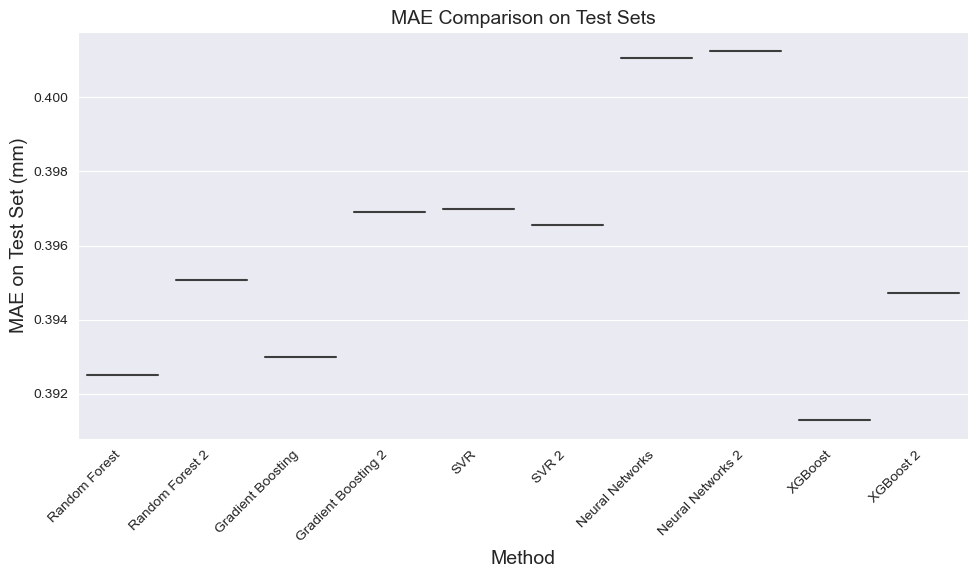

In [347]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.violinplot(data=final_results_df, x='Method', y='MAE on Test Set (mm)')
plt.xlabel('Method')
plt.ylabel('MAE on Test Set (mm)')
plt.title('MAE Comparison on Test Sets')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()



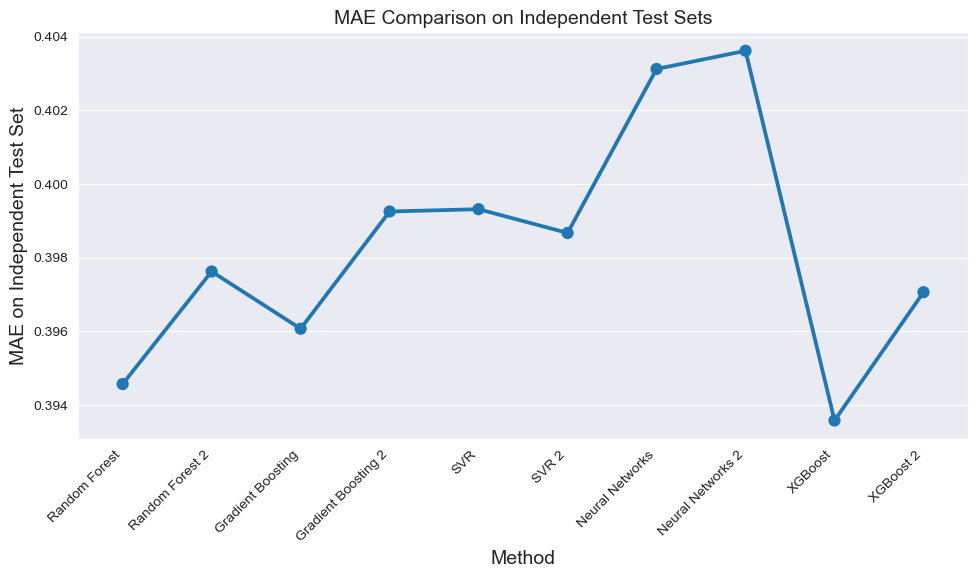

In [348]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.pointplot(data=final_results_df, x='Method', y='MAE on Independent Test Set', dodge=True)
plt.xlabel('Method')
plt.ylabel('MAE on Independent Test Set')
plt.title('MAE Comparison on Independent Test Sets')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()



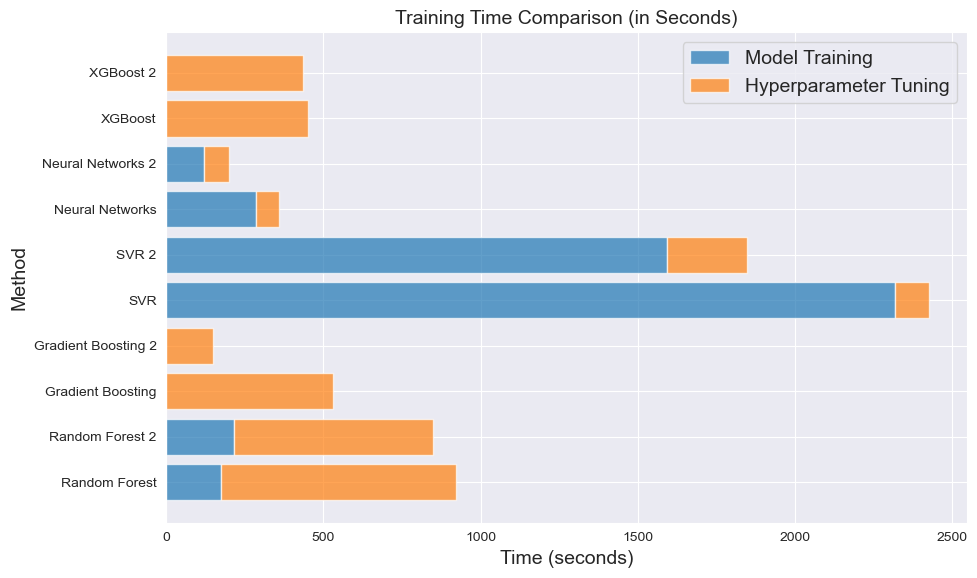

In [344]:
import matplotlib.pyplot as plt
import re

# Extract minutes and seconds from the training time strings
def extract_time_in_seconds(time_str):
    minutes_match = re.search(r'(\d+)min', time_str)
    seconds_match = re.search(r'(\d+)s', time_str)
    
    minutes = int(minutes_match.group(1)) if minutes_match else 0
    seconds = int(seconds_match.group(1)) if seconds_match else 0
    
    return minutes * 60 + seconds

# Convert training times to seconds and add them as new columns
final_results_df['Model Training Time (sec)'] = final_results_df['Training Time for Model training'].apply(extract_time_in_seconds)
final_results_df['Hyperparameter Tuning Time (sec)'] = final_results_df['Training Time for Hyperparameter Tuning'].apply(extract_time_in_seconds)

# Plotting
plt.figure(figsize=(10, 6))

# Plot Model Training Time in seconds
plt.barh(final_results_df['Method'], final_results_df['Model Training Time (sec)'], label='Model Training', alpha=0.7)

# Plot Hyperparameter Tuning Time in seconds on top of Model Training Time
plt.barh(final_results_df['Method'], final_results_df['Hyperparameter Tuning Time (sec)'], left=final_results_df['Model Training Time (sec)'], label='Hyperparameter Tuning', alpha=0.7)

# Adding labels and title
plt.xlabel('Time (seconds)')
plt.ylabel('Method')
plt.title('Training Time Comparison (in Seconds)')

# Create a legend
plt.legend()

# Add tight layout and show the plot
plt.tight_layout()
plt.show()


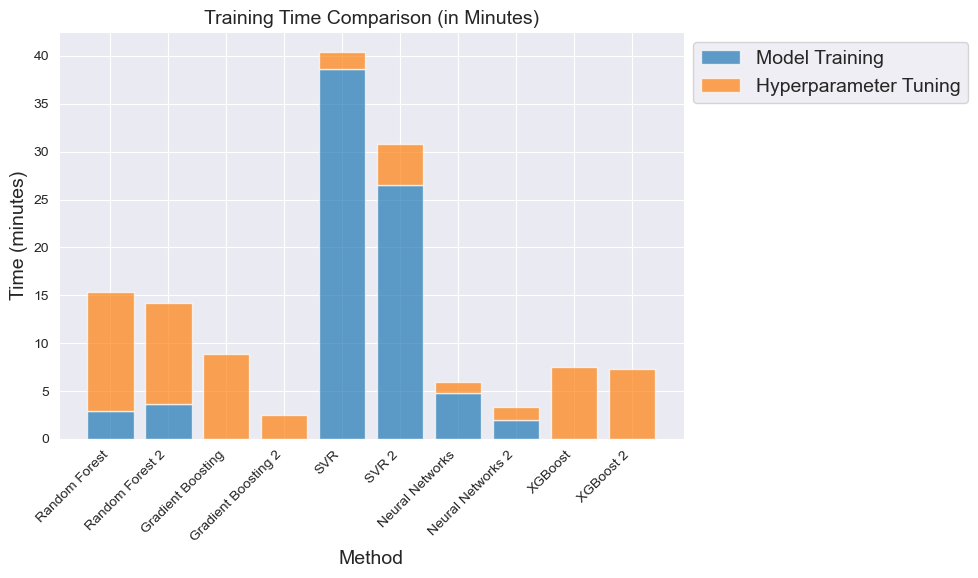

In [342]:
def extract_time_in_minutes(time_str):
    minutes_match = re.search(r'(\d+)min', time_str)
    seconds_match = re.search(r'(\d+)s', time_str)
    
    minutes = int(minutes_match.group(1)) if minutes_match else 0
    seconds = int(seconds_match.group(1)) if seconds_match else 0
    
    total_minutes = minutes + seconds / 60  # Convert seconds to minutes
    return total_minutes

# Convert training times to minutes and add them as new columns
final_results_df['Model Training Time (min)'] = final_results_df['Training Time for Model training'].apply(extract_time_in_minutes)
final_results_df['Hyperparameter Tuning Time (min)'] = final_results_df['Training Time for Hyperparameter Tuning'].apply(extract_time_in_minutes)

# Plotting
plt.figure(figsize=(10, 6))

# Plot Model Training Time in minutes
plt.bar(final_results_df['Method'], final_results_df['Model Training Time (min)'], label='Model Training', alpha=0.7)

# Plot Hyperparameter Tuning Time in minutes on top of Model Training Time
plt.bar(final_results_df['Method'], final_results_df['Hyperparameter Tuning Time (min)'], bottom=final_results_df['Model Training Time (min)'], label='Hyperparameter Tuning', alpha=0.7)

# Adding labels and title
plt.xlabel('Method')
plt.ylabel('Time (minutes)')
plt.title('Training Time Comparison (in Minutes)')
plt.xticks(rotation=45, ha='right')

# Create a legend outside of plt.bar() using plt.legend()
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Add tight layout and show the plot
plt.tight_layout()
plt.show()


## IX. Choose the best performing model and evaluate on the test set

In [313]:
# Find the best performing model based on the lowest MAE on the test set
best_model_index = final_results_df['MAE on Test Set (mm)'].idxmin()
best_model_final = models[best_model_index]


# Predict on the test set using the best model
if best_model_final == best_nn_model:
    y_predict_test = best_model_final.predict(X_test_scaled_df)
    print("Test set used: X_test_scaled_df ", X_test_scaled_df)
elif best_model_final == best_nn_model2:
    y_predict_test = best_model_final.predict(X_test_pca_df)
    print("Test set used: X_test_pca_df ", X_test_pca_df)
elif best_model_final in (tuned_rf_model2, tuned_gb_model2, tuned_svr_model_bayesian2, tuned_xgb_model2):
    y_predict_test = best_model_final.best_estimator_.predict(X_test_pca_df)
    best_model_final = best_model_final.best_estimator_
    print("Test set used: X_test_pca_df ", X_test_pca_df)
else:
    y_predict_test = best_model_final.best_estimator_.predict(X_test_scaled_df)
    best_model_final = best_model_final.best_estimator_
    print("Test set used: X_test_scaled_df ", X_test_scaled_df)


# Get the best hyperparameters for the best model
best_hyperparameters_final = final_results_df.loc[best_model_index, 'Tuned Parameters (Best Hyperparameters)']

# Calculate evaluation metrics
mse_test = mean_squared_error(y_test, y_predict_test)
mae_test = mean_absolute_error(y_test, y_predict_test)
r2_test = r2_score(y_test, y_predict_test)
print(f"Best Performing Model: {best_model_final}")
print(f"Best Hyperparameters for Best Model: {best_hyperparameters_final}")
print(f"Mean Squared Error on Test Set: {mse_test:.2f}")
print(f"Mean Absolute Error on Test Set: {mae_test:.2f}")
print(f"R-squared on Test Set: {r2_test:.2f}")

Test set used: X_test_scaled_df               LAT       LNG  LOCATION_     DEPTH
171957  0.057631 -0.483637   0.619514  0.913567
74391   0.044571 -0.486700   1.638124  0.919385
14597   0.201290 -1.040792   1.526494  1.207112
250407 -0.418543  1.046094  -1.059726 -0.592749
249648  0.500276 -0.697791  -0.515950  0.587415
...          ...       ...        ...       ...
55253   0.654200 -0.248839   0.194263 -0.348791
4462    0.268809 -0.365182   1.250285  0.527372
75382  -0.622194  1.083480  -0.398165 -0.167555
48448   1.117565 -0.983858   1.051940 -0.155109
237244  0.759731 -0.905371   0.523113  0.422952

[26540 rows x 4 columns]
Best Performing Model: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
   

Best Performing Model: 
- XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=12, missing=nan, monotone_constraints=None,
             n_estimators=138, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)
             
Test set used: X_test_scaled_df 
Best Hyperparameters for Best Model: {'learning_rate': 0.1, 'max_depth': None, 'min_child_weight': 12, 'n_estimators': 138}
Mean Squared Error on Test Set: 0.28
Mean Absolute Error on Test Set: 0.39
R-squared on Test Set: 0.37

We can use this best model to make predictions on new data. Lower values of MSE indicate better performance.


## X. Using best model XGBRegressor with the best Hyperparameters to make predictions on new data.

In [309]:
X_test_scaled_df

,LAT,LNG,LOCATION_,DEPTH
171957,0.057631,-0.483637,0.619514,0.913567
74391,0.044571,-0.486700,1.638124,0.919385
14597,0.201290,-1.040792,1.526494,1.207112
250407,-0.418543,1.046094,-1.059726,-0.592749
249648,0.500276,-0.697791,-0.515950,0.587415
...,...,...,...,...
55253,0.654200,-0.248839,0.194263,-0.348791
4462,0.268809,-0.365182,1.250285,0.527372
75382,-0.622194,1.083480,-0.398165,-0.167555
48448,1.117565,-0.983858,1.051940,-0.155109


We can use this best model (XGBRegressor) to predict outcomes on unseen data - Assuming we have new data in X_test_scaled_df:

In [455]:
print(X_test_scaled_df.shape)
print(y_test.shape)

(26540, 4)
(26540,)


In [315]:
# %%time
# import time
# t1 = time.time()
# # Retrain model on combined training and validation sets
# best_model_final.fit(X_train_scaled_df, y_train)
# t2 = time.time()
# print(f"Model training took {t2 - t1} seconds")
# 
# 
# # evaluate performance on test set
# final_test_predictions = best_model_final.predict(X_test_scaled_df)
# 
# print("Test predictions using the Best Hyperparameters with the best model XGBRegressor:\n", final_test_predictions)
# 
# # evaluate the performance of the predictions using metrics from sklearn
# from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# mse_final = mean_squared_error(y_test, final_test_predictions)
# mae_final = mean_absolute_error(y_test, final_test_predictions)
# r2_final = r2_score(y_test, final_test_predictions)
# print(f"Test predictions results of the best model {best_model_final}:")
# print("Mean Squared Error:", mse_final)
# print("Mean Absolute Error:", mae_final)
# print("R-squared:", r2_final)

Model training took 9.180345058441162 seconds
Test predictions using the Best Hyperparameters with the best model XGBRegressor:
 [2.4134867 2.8192868 2.8133783 ... 2.108392  2.6460311 2.4491124]
Test predictions results of the best model XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=12, missing=nan, monotone_constraints=None,
             n_estimators=138, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...):
Mean Squared Error: 0.281

In [ ]:
%%time
import time

# Check if the saved best_model_final model file exists:
if os.path.exists('best_model_final.pkl'):
    # Load the model from the file if it exists
    with open('best_model_final.pkl', 'rb') as file:
        best_model_final = pickle.load(file)
        print(f"best_model_final loaded from best_model_final.pkl")
else:  
    t1 = time.time()
    # Retrain model on combined training and validation sets if saved model file not present:
    best_model_final.fit(X_train_scaled_df, y_train)
    t2 = time.time()
    print(f"Model training took {t2 - t1} seconds")
    with open('best_model_final.pkl', 'wb') as file:
        pickle.dump(best_model_final, file)
        print(f"best_model_final saved to best_model_final.pkl")


# evaluate performance on test set
final_test_predictions = best_model_final.predict(X_test_scaled_df)

print("Test predictions using the Best Hyperparameters with the best model XGBRegressor:\n", final_test_predictions)

# evaluate the performance of the predictions using metrics from sklearn
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
mse_final = mean_squared_error(y_test, final_test_predictions)
mae_final = mean_absolute_error(y_test, final_test_predictions)
r2_final = r2_score(y_test, final_test_predictions)
print(f"Test predictions results of the best model {best_model_final}:")
print("Mean Squared Error:", mse_final)
print("Mean Absolute Error:", mae_final)
print("R-squared:", r2_final)

Test predictions results of the best model XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=12, missing=nan, monotone_constraints=None,
             n_estimators=138, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...):
Mean Squared Error: 0.28157587010381213
Mean Absolute Error: 0.39358361894732236
R-squared: 0.36845470106621103
CPU times: total: 1min 47s
Wall time: 9.2 s

#### Listing predictions

In [316]:
print(X_test)

,ID,DATE_,LOCATION_,LAT,LNG,DEPTH,RECORDDATE
171957,171987.0,2018-07-25 20:56:34,2.362881,36.1913,27.5283,15.100000,2023-02-27 15:02:16.087
74391,284616.0,2013-06-19 16:29:08,2.804068,35.8125,27.2617,15.000000,2023-02-27 15:02:03.037
14597,14598.0,2008-07-03 10:49:51,2.963683,39.0933,27.2942,18.300000,2023-02-27 15:01:55.303
250407,250440.0,2021-11-21 10:44:22,1.723721,37.5025,35.5503,4.900000,2023-02-27 15:02:26.053
249648,249681.0,2021-10-15 12:03:08,1.854603,37.8963,26.9723,12.900000,2023-02-27 15:02:25.820
...,...,...,...,...,...,...,...
55253,55254.0,2012-06-10 06:48:15,2.223808,39.1218,29.0767,6.400000,2023-02-27 15:02:00.820
4462,4463.0,2005-11-12 16:55:03,2.676154,37.2097,28.1897,12.500000,2023-02-27 15:01:53.097
75382,75383.0,2013-07-24 09:04:39,2.069763,37.0945,35.9918,8.200000,2023-02-27 15:02:03.223
48448,48449.0,2012-01-18 22:18:02,2.595693,40.1758,26.1382,7.700000,2023-02-27 15:01:59.940


In [320]:
# Create a new DataFrame to store the decoded results
decoded_df = X_test.copy()

# Iterate through the indices and replace 'location_' in decoded_df with the original location names 
# we will use indices to cross-check with original df:
for index, row in decoded_df.iterrows():
    original_location = df.loc[index, 'LOCATION_']
    decoded_df.at[index, 'LOCATION_'] = original_location

# Print or view the updated decoded_df
print(decoded_df)
decoded_df.to_csv('decoded_df.csv', index=False)


# # Use the 'location_mapping' dictionary to inverse transform the encoded locations
# decoded_df['LOCATION_'] = decoded_df['LOCATION_'].map(location_mapping)


# Now we can see the actual location names along with the predicted MAG values
decoded_df['PREDICTED_MAG'] = final_test_predictions
decoded_df['MAG'] = y_test

# Print the DataFrame to see the results
decoded_df.info()
decoded_df

              ID               DATE_  \
171957  171987.0 2018-07-25 20:56:34   
74391   284616.0 2013-06-19 16:29:08   
14597    14598.0 2008-07-03 10:49:51   
250407  250440.0 2021-11-21 10:44:22   
249648  249681.0 2021-10-15 12:03:08   
...          ...                 ...   
55253    55254.0 2012-06-10 06:48:15   
4462      4463.0 2005-11-12 16:55:03   
75382    75383.0 2013-07-24 09:04:39   
48448    48449.0 2012-01-18 22:18:02   
237244  237277.0 2021-05-03 13:05:40   

                                                LOCATION_      LAT      LNG  \
171957  AKDENIZ                                       ...  36.1913  27.5283   
74391   AKDENiZ                                       ...  35.8125  27.2617   
14597                                       KINIK (iZMiR)  39.0933  27.2942   
250407  ENIZCAKIRI-KOZAN (ADANA)                      ...  37.5025  35.5503   
249648  KUSADASI KORFEZI (EGE DENIZI)                 ...  37.8963  26.9723   
...                                          

,ID,DATE_,LOCATION_,LAT,LNG,DEPTH,RECORDDATE,PREDICTED_MAG,MAG
171957,171987.0,2018-07-25 20:56:34,AKDENIZ ...,36.1913,27.5283,15.100000,2023-02-27 15:02:16.087,2.413487,2.0
74391,284616.0,2013-06-19 16:29:08,AKDENiZ ...,35.8125,27.2617,15.000000,2023-02-27 15:02:03.037,2.819287,2.7
14597,14598.0,2008-07-03 10:49:51,KINIK (iZMiR),39.0933,27.2942,18.300000,2023-02-27 15:01:55.303,2.813378,2.7
250407,250440.0,2021-11-21 10:44:22,ENIZCAKIRI-KOZAN (ADANA) ...,37.5025,35.5503,4.900000,2023-02-27 15:02:26.053,1.781601,1.3
249648,249681.0,2021-10-15 12:03:08,KUSADASI KORFEZI (EGE DENIZI) ...,37.8963,26.9723,12.900000,2023-02-27 15:02:25.820,1.817422,1.8
...,...,...,...,...,...,...,...,...,...
55253,55254.0,2012-06-10 06:48:15,SOGUT-SIMAV (KUTAHYA) ...,39.1218,29.0767,6.400000,2023-02-27 15:02:00.820,2.215696,2.1
4462,4463.0,2005-11-12 16:55:03,YERKESiK- (MUGLA),37.2097,28.1897,12.500000,2023-02-27 15:01:53.097,2.727029,2.9
75382,75383.0,2013-07-24 09:04:39,DOKUZTEKNE-CEYHAN (ADANA) ...,37.0945,35.9918,8.200000,2023-02-27 15:02:03.223,2.108392,2.7
48448,48449.0,2012-01-18 22:18:02,KEMALYERi ACIKLARI-CANAKKALE (EGE DENiZi) ...,40.1758,26.1382,7.700000,2023-02-27 15:01:59.940,2.646031,2.5


#### Biggest Predicted MAG vs. Biggest Actual MAG

In [324]:
# Find the index of the row with the biggest predicted MAG
index_max_predicted = decoded_df['PREDICTED_MAG'].idxmax()

# Find the index of the row with the biggest actual MAG
index_max_actual = decoded_df['MAG'].idxmax()

# Get the info for the biggest predicted MAG:
location_predicted_max = decoded_df.loc[index_max_predicted, 'LOCATION_']
date_predicted_max = decoded_df.loc[index_max_predicted, 'DATE_']
predicted_mag_value_for_predicted_max = decoded_df.loc[index_max_predicted, 'PREDICTED_MAG']  # Get predicted MAG value
actual_mag_value_for_predicted_max = decoded_df.loc[index_max_predicted, 'MAG']  # Get actual MAG value for the predicted MAG 


# Get the info for the biggest actual MAG:
location_actual_max = decoded_df.loc[index_max_actual, 'LOCATION_']
date_actual_max = decoded_df.loc[index_max_actual, 'DATE_']
actual_mag_value_for_actual_max = decoded_df.loc[index_max_actual, 'MAG']  # Get actual MAG value
predicted_mag_value_for_actual_max = decoded_df.loc[index_max_actual, 'PREDICTED_MAG']  # Get predicted MAG value for the actual MAG


# Print the results
print("Biggest Predicted MAG:")
print("Date:", date_predicted_max)
print("Location:", location_predicted_max)
print("Predicted MAG Value:", predicted_mag_value_for_predicted_max)
print("Actual MAG Value for this Location:", actual_mag_value_for_predicted_max)  # Print actual MAG value


print("\nBiggest Actual MAG:")
print("Date:", date_actual_max)
print("Location:", location_actual_max)
print("Actual MAG Value:", actual_mag_value_for_actual_max)
print("Predicted MAG Value for this Location:", predicted_mag_value_for_actual_max)  # Print predicted MAG value

Biggest Predicted MAG:
Date: 2017-11-13 06:14:35
Location: IRAN                                              
Predicted MAG Value: 4.737505
Actual MAG Value for this Location: 4.2

Biggest Actual MAG:
Date: 2020-05-02 15:51:06
Location: GIRIT ADASI ACIKLARI (AKDENIZ)                    İlksel
Actual MAG Value: 6.6
Predicted MAG Value for this Location: 3.7084682


- Biggest Predicted MAG:
Date: 2017-11-13 06:14:35
Location: IRAN                                              
Predicted MAG Value: 4.737505
Actual MAG Value for this Location: 4.2


- Biggest Actual MAG:
Date: 2020-05-02 15:51:06
Location: GIRIT ADASI ACIKLARI (AKDENIZ)                    İlksel
Actual MAG Value: 6.6
Predicted MAG Value for this Location: 3.7084682


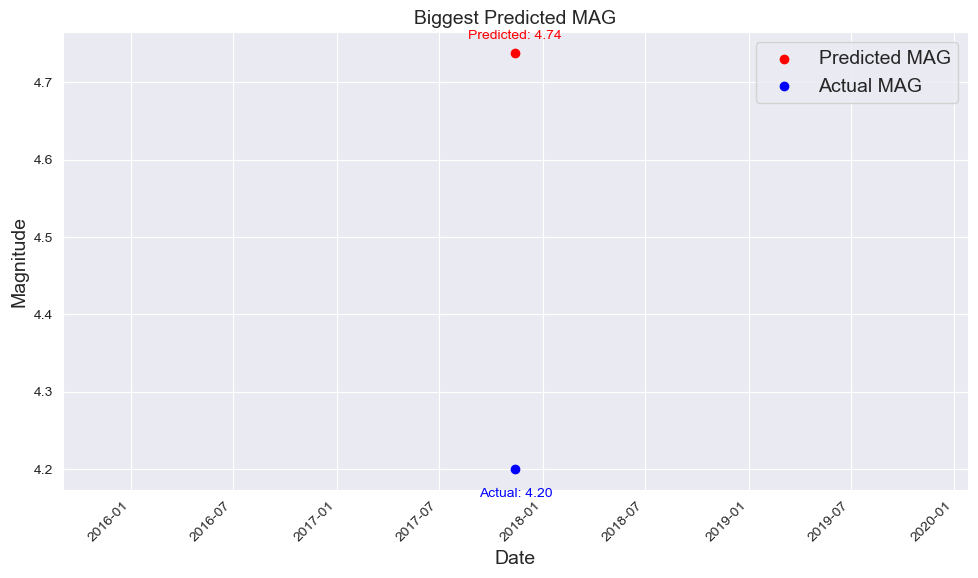

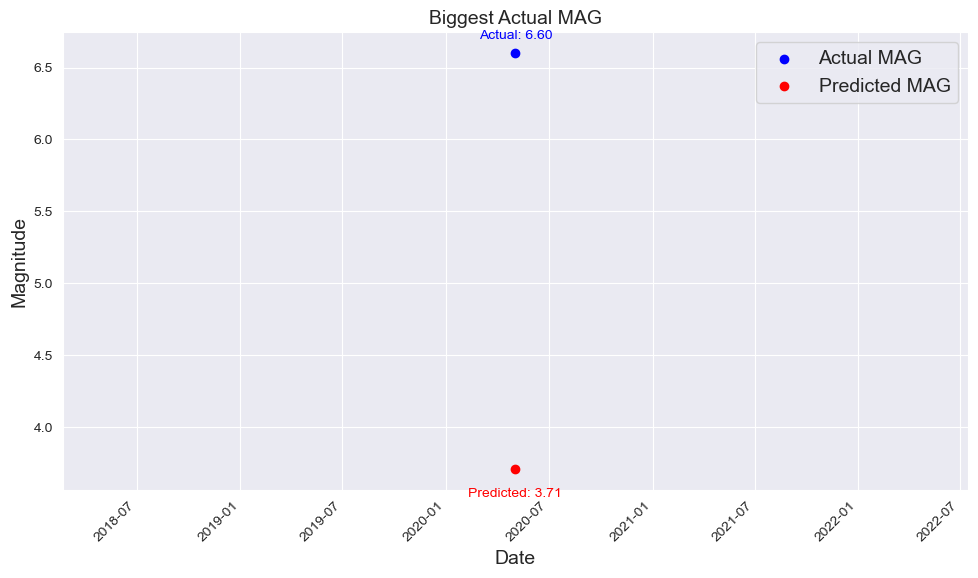

In [349]:
import matplotlib.pyplot as plt

# Create a scatter plot to visualize the biggest predicted MAG
plt.figure(figsize=(10, 6))
plt.scatter(date_predicted_max, predicted_mag_value_for_predicted_max, color='red', label='Predicted MAG')
plt.scatter(date_predicted_max, actual_mag_value_for_predicted_max, color='blue', label='Actual MAG')
plt.annotate(f'Predicted: {predicted_mag_value_for_predicted_max:.2f}', 
             (date_predicted_max, predicted_mag_value_for_predicted_max), 
             textcoords="offset points", xytext=(0,10), ha='center', fontsize=10, color='red')
plt.annotate(f'Actual: {actual_mag_value_for_predicted_max:.2f}', 
             (date_predicted_max, actual_mag_value_for_predicted_max), 
             textcoords="offset points", xytext=(0,-20), ha='center', fontsize=10, color='blue')
plt.xlabel('Date')
plt.ylabel('Magnitude')
plt.title('Biggest Predicted MAG')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

# Create a scatter plot to visualize the biggest actual MAG
plt.figure(figsize=(10, 6))
plt.scatter(date_actual_max, actual_mag_value_for_actual_max, color='blue', label='Actual MAG')
plt.scatter(date_actual_max, predicted_mag_value_for_actual_max, color='red', label='Predicted MAG')
plt.annotate(f'Actual: {actual_mag_value_for_actual_max:.2f}', 
             (date_actual_max, actual_mag_value_for_actual_max), 
             textcoords="offset points", xytext=(0,10), ha='center', fontsize=10, color='blue')
plt.annotate(f'Predicted: {predicted_mag_value_for_actual_max:.2f}', 
             (date_actual_max, predicted_mag_value_for_actual_max), 
             textcoords="offset points", xytext=(0,-20), ha='center', fontsize=10, color='red')
plt.xlabel('Date')
plt.ylabel('Magnitude')
plt.title('Biggest Actual MAG')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


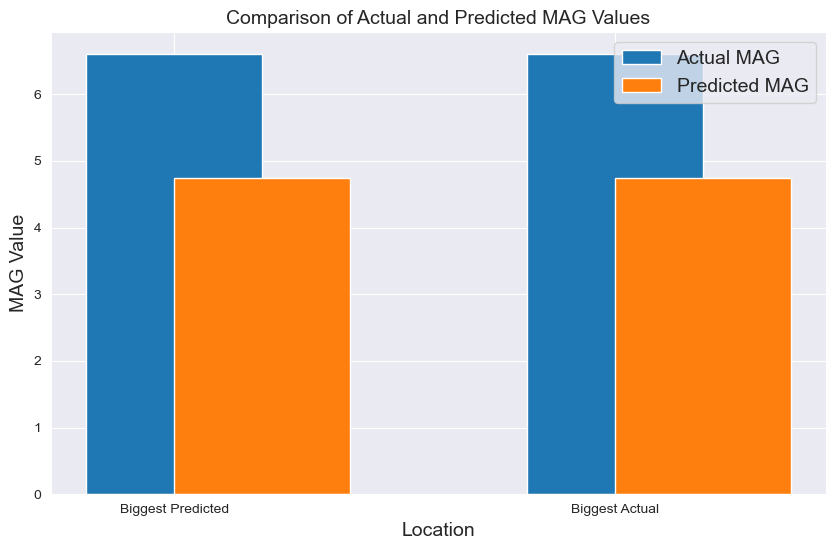

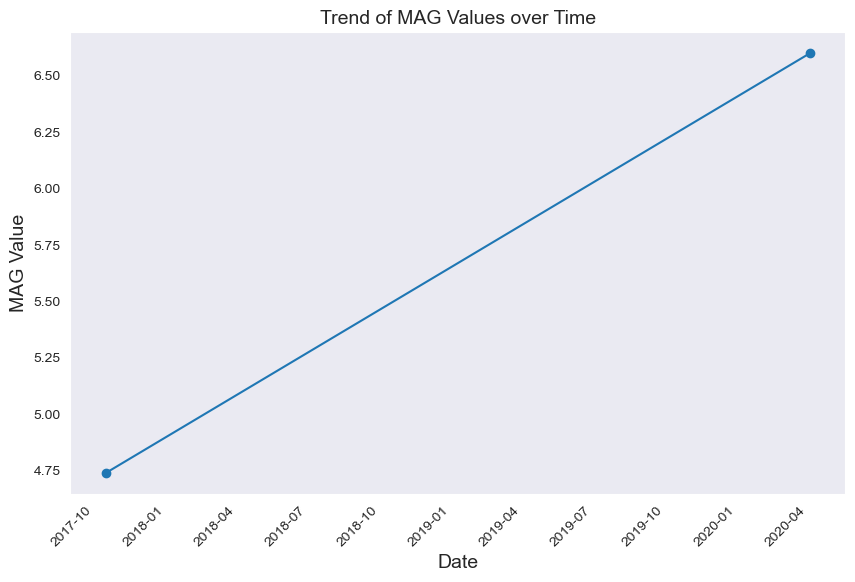

In [325]:
import matplotlib.pyplot as plt

# Create a bar plot for actual and predicted MAG values
locations = ['Biggest Predicted', 'Biggest Actual']
actual_values = [actual_mag_value_for_actual_max, actual_mag_value_for_actual_max]
predicted_values = [predicted_mag_value_for_predicted_max, predicted_mag_value_for_predicted_max]

plt.figure(figsize=(10, 6))
plt.bar(locations, actual_values, width=0.4, align='center', label='Actual MAG')
plt.bar(locations, predicted_values, width=0.4, align='edge', label='Predicted MAG')
plt.xlabel('Location')
plt.ylabel('MAG Value')
plt.title('Comparison of Actual and Predicted MAG Values')
plt.legend()
plt.show()

# Create a line plot for MAG values over time (date)
plt.figure(figsize=(10, 6))
plt.plot([date_predicted_max, date_actual_max], [predicted_mag_value_for_predicted_max, actual_mag_value_for_actual_max], marker='o')
plt.xlabel('Date')
plt.ylabel('MAG Value')
plt.title('Trend of MAG Values over Time')
plt.xticks(rotation=45)
plt.grid()
plt.show()


In [378]:
decoded_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 26540 entries, 171957 to 237244
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   ID                26540 non-null  float64       
 1   DATE_             26540 non-null  datetime64[ns]
 2   LOCATION_         26540 non-null  object        
 3   LAT               26540 non-null  float64       
 4   LNG               26540 non-null  float64       
 5   DEPTH             26540 non-null  float64       
 6   RECORDDATE        26540 non-null  datetime64[ns]
 7   PREDICTED_MAG     26540 non-null  float32       
 8   MAG               26540 non-null  float64       
 9   Prediction Error  26540 non-null  float64       
 10  MAE               26540 non-null  float64       
dtypes: datetime64[ns](2), float32(1), float64(7), object(1)
memory usage: 3.3+ MB


#### Visualising Predictions

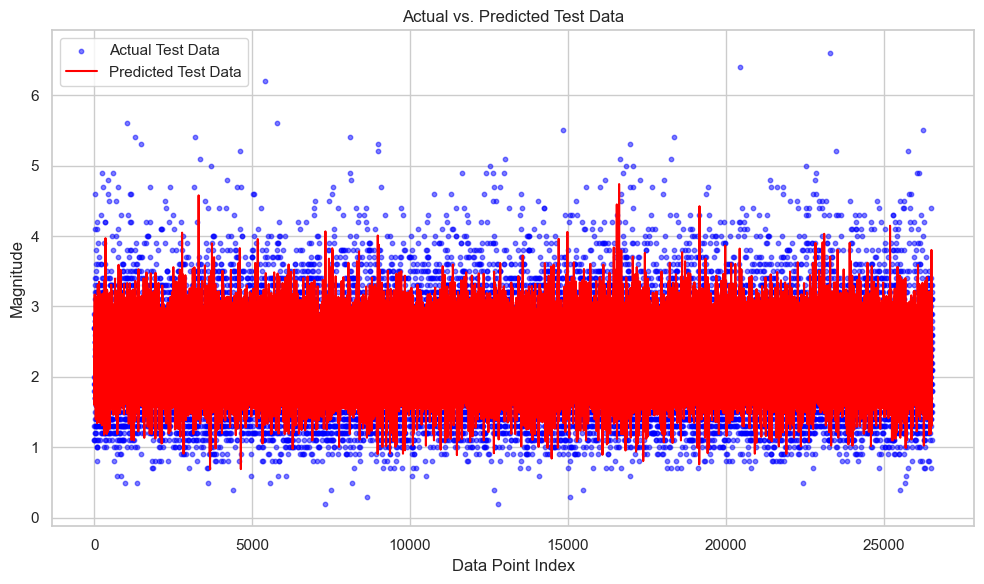

In [458]:
import matplotlib.pyplot as plt
import numpy as np

# Create an array of indices for the data points
indices = np.arange(len(y_test))

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the actual test data (depth vs. magnitude)
ax.scatter(indices, y_test, label='Actual Test Data', color='blue', alpha=0.5, s=10)

# Plot the predicted test data (depth vs. predicted magnitude)
ax.plot(indices, decoded_df['PREDICTED_MAG'], label='Predicted Test Data', color='red')

# Add labels and title
ax.set_xlabel('Data Point Index')
ax.set_ylabel('Magnitude')
ax.set_title('Actual vs. Predicted Test Data')

# Add legend
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()


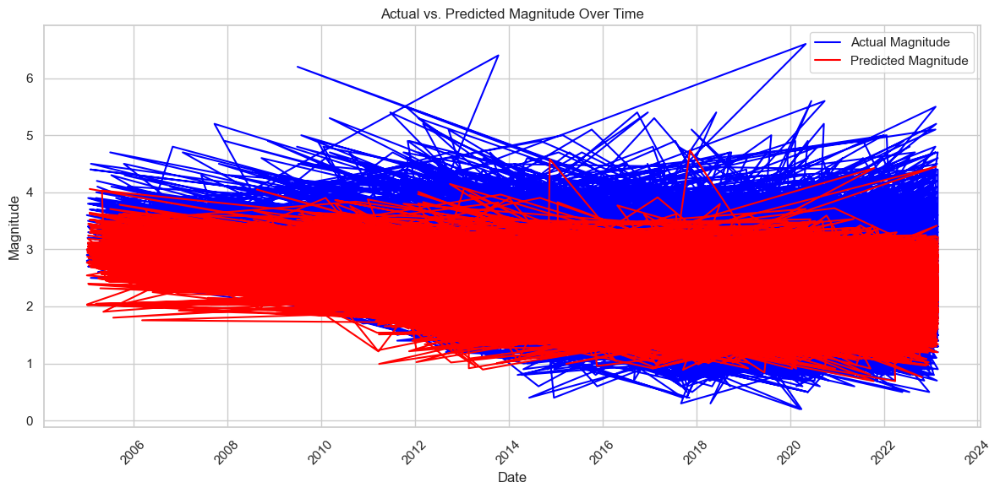

In [463]:
plt.figure(figsize=(12, 6))
plt.plot(decoded_df['DATE_'], decoded_df['MAG'], label='Actual Magnitude', color='blue')
plt.plot(decoded_df['DATE_'], decoded_df['PREDICTED_MAG'], label='Predicted Magnitude', color='red')
plt.xlabel('Date')
plt.ylabel('Magnitude')
plt.title('Actual vs. Predicted Magnitude Over Time')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


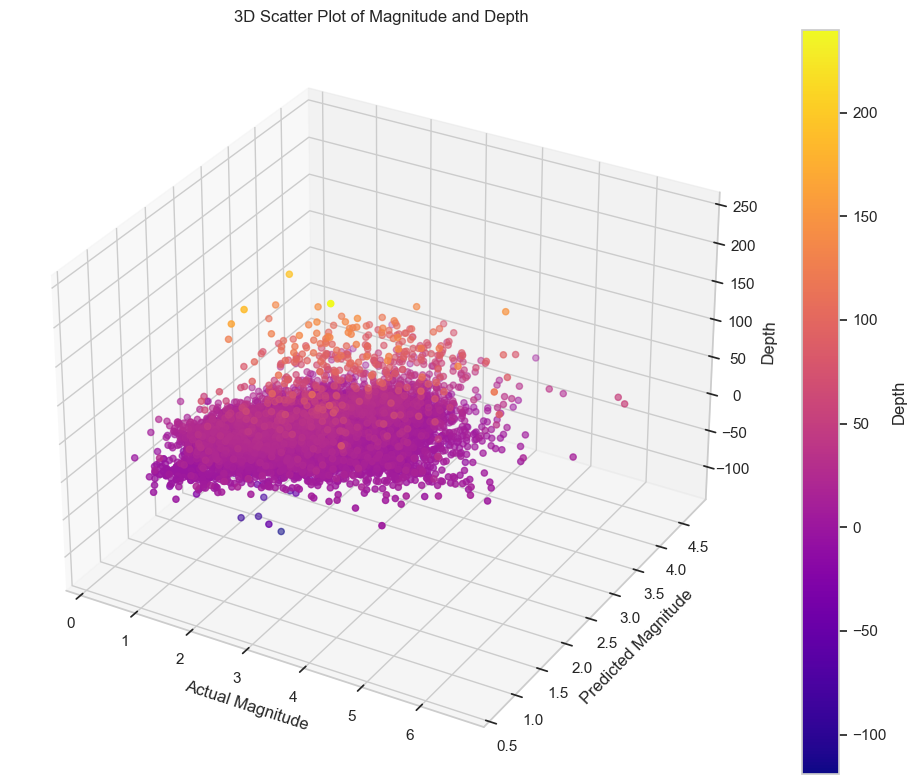

In [473]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(decoded_df['MAG'], decoded_df['PREDICTED_MAG'], decoded_df['DEPTH'], c=decoded_df['DEPTH'], cmap='plasma')
ax.set_xlabel('Actual Magnitude')
ax.set_ylabel('Predicted Magnitude')
ax.set_zlabel('Depth')
ax.set_title('3D Scatter Plot of Magnitude and Depth')
plt.colorbar(scatter, label='Depth')
plt.tight_layout()
plt.savefig('3D Scatter Plot of Magnitude and Depth.png')
plt.show()


In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(abs(decoded_df['MAG'] - decoded_df['PREDICTED_MAG']), bins=20, edgecolor='black')
plt.xlabel('Mean Absolute Error (MAE)')
plt.ylabel('Frequency')
plt.title('Histogram of Mean Absolute Error (MAE) Values')
plt.grid()
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Filter data for magnitudes bigger than 3.9
filtered_data = decoded_df[decoded_df['MAG'] > 3.9]

# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(filtered_data['DATE_'], filtered_data['PREDICTED_MAG'], color='blue', label='Predicted Magnitude', alpha=0.7)
plt.scatter(filtered_data['DATE_'], filtered_data['MAG'], color='orange', label='Actual Magnitude', alpha=0.7)
plt.xlabel('Date')
plt.ylabel('Magnitude')
plt.title('Predicted vs Actual Magnitude Over Time for Magnitudes > 3.9')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.savefig('Predicted_vs_Actual_ Magnitude_ Over_ Time__Magnitudes_3.9.png')

plt.show()


In [ ]:
# Error Distribution Plot
plt.figure(figsize=(10, 6))
sns.histplot(decoded_df['PREDICTED_MAG'] - decoded_df['MAG'], bins=20, kde=True, color='purple')
plt.xlabel('MAG Prediction Error')
plt.ylabel('Density')
plt.title('Error Distribution Plot')
plt.savefig('error_dist_plot.png')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


# Set the style for the plot
sns.set(style="whitegrid")

# Create a figure and axis
plt.figure(figsize=(10, 6))

# Plot the error distribution using a violin plot
ax = sns.violinplot(x=decoded_df['DATE_'], y=decoded_df['MAE'], color='r')

# Adding labels and title
plt.xlabel('Date')
plt.ylabel('Magnitude Error')
plt.title('Error Plot: Actual vs. Predicted Magnitude')

# Rotating x-axis labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.savefig('Error_plot_violin.png')
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Create a figure and axis
plt.figure(figsize=(10, 6))

# Create a contour plot
contour = plt.tricontourf(decoded_df['MAG'], decoded_df['DEPTH'], decoded_df['PREDICTED_MAG'], cmap='viridis')

# Adding colorbar
cbar = plt.colorbar(contour)
cbar.set_label('Predicted Magnitude')

# Adding labels and title
plt.xlabel('Actual Magnitude')
plt.ylabel('Depth')
plt.title('Contour Plot: Predicted Magnitude based on Actual Magnitude and Depth')

# Display the plot
plt.tight_layout()
plt.savefig('Contour_plot.png')
plt.show()


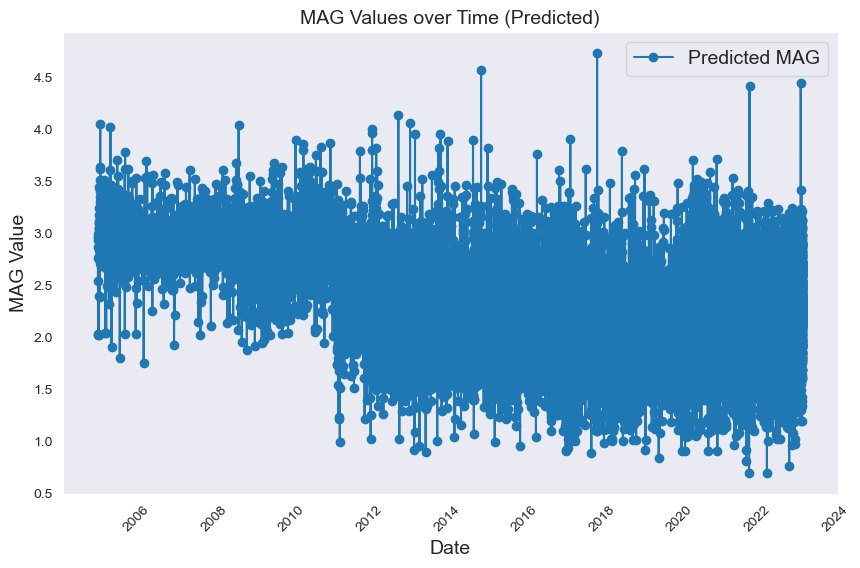

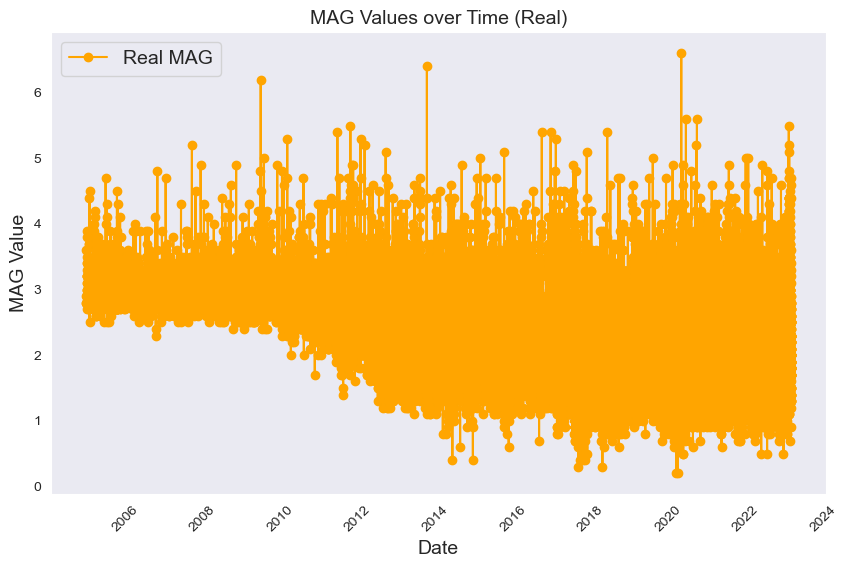

In [327]:
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'decoded_df' with 'DATE' and 'PREDICTED_MAG' columns

# Sort the DataFrame by date
decoded_df_sorted = decoded_df.sort_values('DATE_')

# Plotting MAG values over time for predicted values
plt.figure(figsize=(10, 6))
plt.plot(decoded_df_sorted['DATE_'], decoded_df_sorted['PREDICTED_MAG'], marker='o', label='Predicted MAG')
plt.xlabel('Date')
plt.ylabel('MAG Value')
plt.title('MAG Values over Time (Predicted)')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.show()

# Assuming you also have a 'MAG' column for real MAG values

# Sort the DataFrame by date
decoded_df_sorted = decoded_df.sort_values('DATE_')

# Plotting MAG values over time for real values
plt.figure(figsize=(10, 6))
plt.plot(decoded_df_sorted['DATE_'], decoded_df_sorted['MAG'], marker='o', color='orange', label='Real MAG')
plt.xlabel('Date')
plt.ylabel('MAG Value')
plt.title('MAG Values over Time (Real)')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.show()


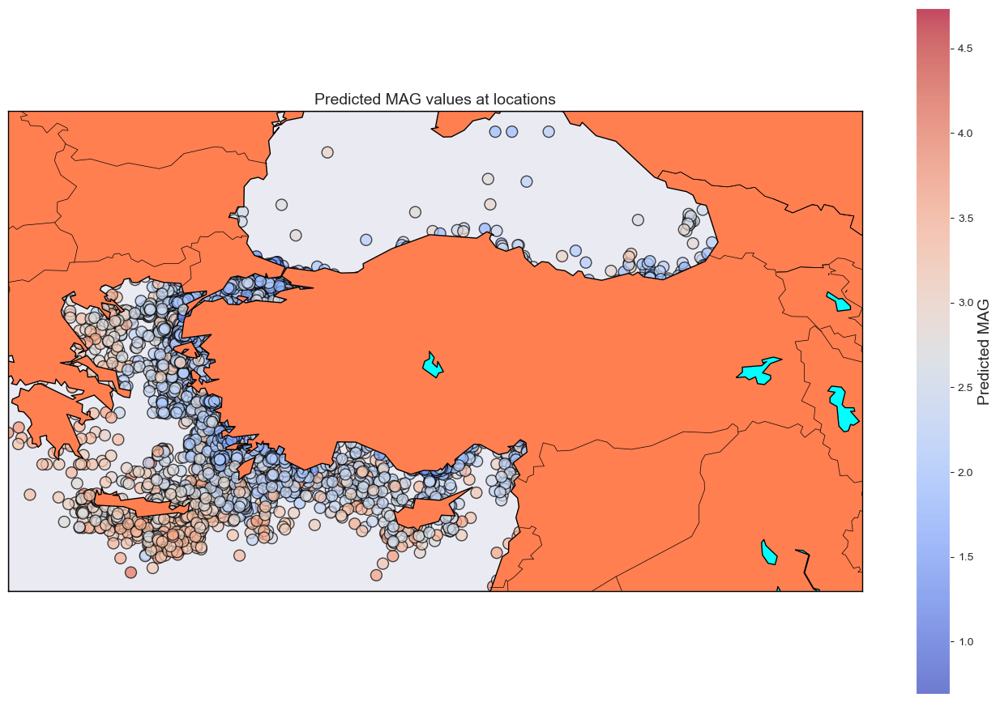

In [352]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

# Assuming you have the latitude and longitude values for the test data
test_latitudes = X_test["LAT"].tolist()
test_longitudes = X_test["LNG"].tolist()

# Create a Basemap object
#m = Basemap(projection='mill', llcrnrlat=-80, urcrnrlat=80, llcrnrlon=-180, urcrnrlon=180, lat_ts=20, resolution='c')
m = Basemap(projection='mill', llcrnrlat=33, urcrnrlat=45, llcrnrlon=21, urcrnrlon=46, resolution='l')
#m = Basemap(projection='mill', llcrnrlat=25, urcrnrlat=45, llcrnrlon=35, urcrnrlon=45, resolution='l')

# Convert latitudes and longitudes to Basemap coordinates
x, y = m(test_longitudes, test_latitudes)

# Plot the locations with colors representing the predicted MAG values
fig = plt.figure(figsize=(17, 11))
plt.title("Predicted MAG values at locations")
m.scatter(x, y, s=100, c=final_test_predictions, cmap='coolwarm', edgecolors='k', alpha=0.7)
#m.plot(x, y, "o", markersize=5, color='blue')
m.drawcoastlines()
m.fillcontinents(color='coral', lake_color='aqua')
m.drawmapboundary()
m.drawcountries()
plt.colorbar(label='Predicted MAG')

# Save the plot to a file (e.g., PNG format)
plt.savefig('line_plot_Predicted MAG values at locations.png')
plt.savefig('line_plot_Predicted MAG values at locations.pdf')  

plt.show()


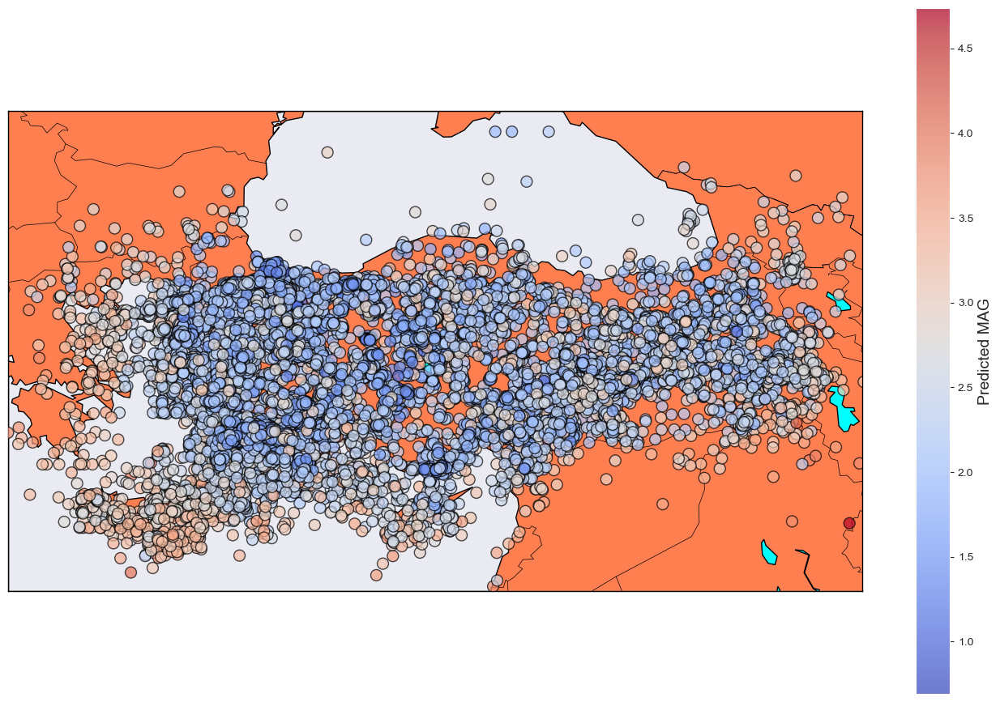

In [365]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

# Assuming you have the latitude and longitude values for the test data
test_latitudes = X_test["LAT"].tolist()
test_longitudes = X_test["LNG"].tolist()

# Create a Basemap object
m = Basemap(projection='mill', llcrnrlat=33, urcrnrlat=45, llcrnrlon=21, urcrnrlon=46, resolution='l')

# Convert latitudes and longitudes to Basemap coordinates
x, y = m(test_longitudes, test_latitudes)

# Create a figure and axis
fig = plt.figure(figsize=(17, 11))
ax = fig.add_subplot(1, 1, 1)

# Plot the map
m.drawcoastlines()
m.fillcontinents(color='coral', lake_color='aqua')
m.drawmapboundary()
m.drawcountries()

# Plot the locations with colors representing the predicted MAG values on top of the map
scatter = ax.scatter(x, y, s=100, c=final_test_predictions, cmap='coolwarm', edgecolors='k', alpha=0.7, zorder=10)

# Add a colorbar
cbar = plt.colorbar(scatter, label='Predicted MAG')

# Save the plot to a file (e.g., PNG format)
plt.savefig('scatter_plot_Predicted_MAG_values_at_locations.png')
plt.savefig('scatter_plot_Predicted_MAG_values_at_locations.pdf')  

plt.show()


In [391]:
decoded_df_sorted

,ID,DATE_,LOCATION_,LAT,LNG,DEPTH,RECORDDATE,PREDICTED_MAG,MAG
11,12.0,2005-01-01 20:18:52,YUNAK (KONYA),38.7072,31.6262,27.6,2023-02-27 15:01:52.367,2.767937,2.9
19,20.0,2005-01-02 07:59:53,PATNOS (AGRI),39.3143,42.7458,29.5,2023-02-27 15:01:52.367,2.994905,3.6
20,21.0,2005-01-02 10:35:04,KARACABEY (BURSA),40.3612,28.2242,18.2,2023-02-27 15:01:52.367,2.543750,2.8
26,284616.0,2005-01-03 15:22:17,MERZiFON (AMASYA),40.7618,35.4228,49.2,2023-02-27 15:01:52.367,2.035439,2.8
48,49.0,2005-01-05 11:16:54,GOKDERE (ELAZIG),38.7567,40.1315,26.6,2023-02-27 15:01:52.367,2.024222,3.0
...,...,...,...,...,...,...,...,...,...
281212,281245.0,2023-02-27 13:35:25,GUNDUZBEY-YESILYURT (MALATYA) ...,38.2717,38.2967,19.8,2023-02-27 15:02:29.527,2.425964,2.0
281292,281325.0,2023-02-27 13:41:38,ALAATTIN-(HATAY) ...,36.2503,36.2355,5.0,2023-02-27 15:02:29.527,2.350996,1.8
282467,282500.0,2023-02-27 14:33:00,CARDAKLI-(HATAY) ...,36.1592,36.1225,23.7,2023-02-27 15:02:29.527,2.180763,1.7
277477,277510.0,2023-02-27 14:38:16,CATALCAM-TUFANBEYLI (ADANA) ...,38.1745,36.0800,5.1,2023-02-27 15:02:29.527,2.238332,1.4


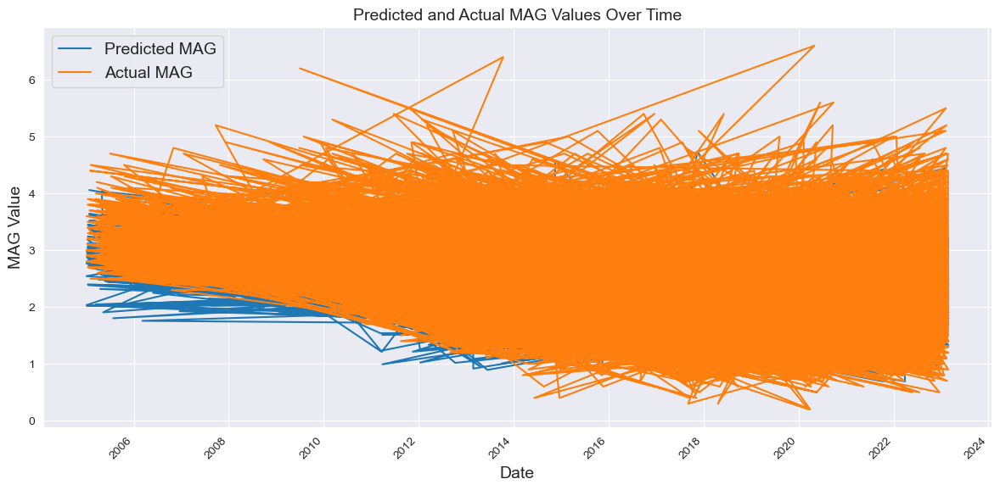

In [353]:
plt.figure(figsize=(12, 6))
plt.plot(decoded_df['DATE_'], decoded_df['PREDICTED_MAG'], label='Predicted MAG')
plt.plot(decoded_df['DATE_'], decoded_df['MAG'], label='Actual MAG')
plt.xlabel('Date')
plt.ylabel('MAG Value')
plt.title('Predicted and Actual MAG Values Over Time')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


In [355]:
decoded_df.columns


Index(['ID', 'DATE_', 'LOCATION_', 'LAT', 'LNG', 'DEPTH', 'RECORDDATE',
       'PREDICTED_MAG', 'MAG'],
      dtype='object')

In [362]:
decoded_df

,ID,DATE_,LOCATION_,LAT,LNG,DEPTH,RECORDDATE,PREDICTED_MAG,MAG,Prediction Error,MAE
171957,171987.0,2018-07-25 20:56:34,AKDENIZ ...,36.1913,27.5283,15.100000,2023-02-27 15:02:16.087,2.413487,2.0,0.413487,0.413487
74391,284616.0,2013-06-19 16:29:08,AKDENiZ ...,35.8125,27.2617,15.000000,2023-02-27 15:02:03.037,2.819287,2.7,0.119287,0.119287
14597,14598.0,2008-07-03 10:49:51,KINIK (iZMiR),39.0933,27.2942,18.300000,2023-02-27 15:01:55.303,2.813378,2.7,0.113378,0.113378
250407,250440.0,2021-11-21 10:44:22,ENIZCAKIRI-KOZAN (ADANA) ...,37.5025,35.5503,4.900000,2023-02-27 15:02:26.053,1.781601,1.3,0.481601,0.481601
249648,249681.0,2021-10-15 12:03:08,KUSADASI KORFEZI (EGE DENIZI) ...,37.8963,26.9723,12.900000,2023-02-27 15:02:25.820,1.817422,1.8,0.017422,0.017422
...,...,...,...,...,...,...,...,...,...,...,...
55253,55254.0,2012-06-10 06:48:15,SOGUT-SIMAV (KUTAHYA) ...,39.1218,29.0767,6.400000,2023-02-27 15:02:00.820,2.215696,2.1,0.115696,0.115696
4462,4463.0,2005-11-12 16:55:03,YERKESiK- (MUGLA),37.2097,28.1897,12.500000,2023-02-27 15:01:53.097,2.727029,2.9,-0.172971,0.172971
75382,75383.0,2013-07-24 09:04:39,DOKUZTEKNE-CEYHAN (ADANA) ...,37.0945,35.9918,8.200000,2023-02-27 15:02:03.223,2.108392,2.7,-0.591608,0.591608
48448,48449.0,2012-01-18 22:18:02,KEMALYERi ACIKLARI-CANAKKALE (EGE DENiZi) ...,40.1758,26.1382,7.700000,2023-02-27 15:01:59.940,2.646031,2.5,0.146031,0.146031


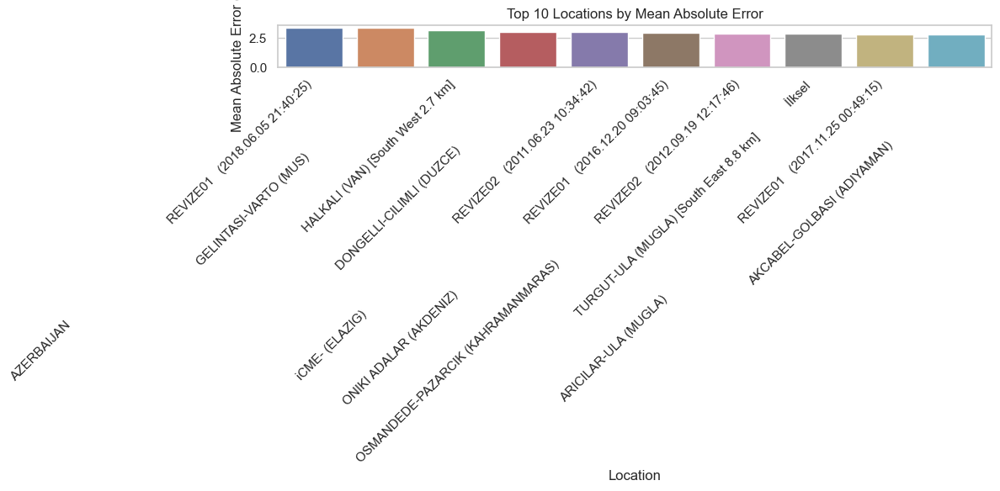

In [374]:
# Sort by mean MAE in descending order
sorted_df = grouped_df.sort_values(by='MAE', ascending=False)

# Select the top N locations to visualize
top_n = 10  # You can adjust this number as needed
top_locations = sorted_df.head(top_n)

# Set the style for seaborn plots
sns.set(style="whitegrid")

# Create a bar plot of mean MAE for the top locations
plt.figure(figsize=(12, 6))
sns.barplot(x='LOCATION_', y='MAE', data=top_locations)
plt.xlabel('Location')
plt.ylabel('Mean Absolute Error (MAE)')
plt.title(f'Top {top_n} Locations by Mean Absolute Error')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

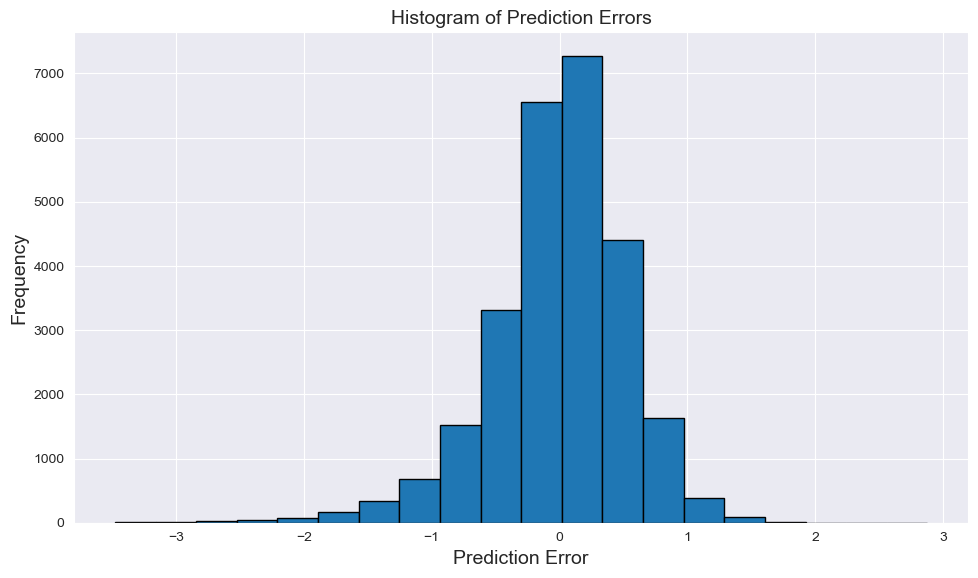

In [356]:
plt.figure(figsize=(10, 6))
prediction_errors = decoded_df['PREDICTED_MAG'] - decoded_df['MAG']
plt.hist(prediction_errors, bins=20, edgecolor='black')
plt.xlabel('Prediction Error')
plt.ylabel('Frequency')
plt.title('Histogram of Prediction Errors')
plt.tight_layout()
plt.show()


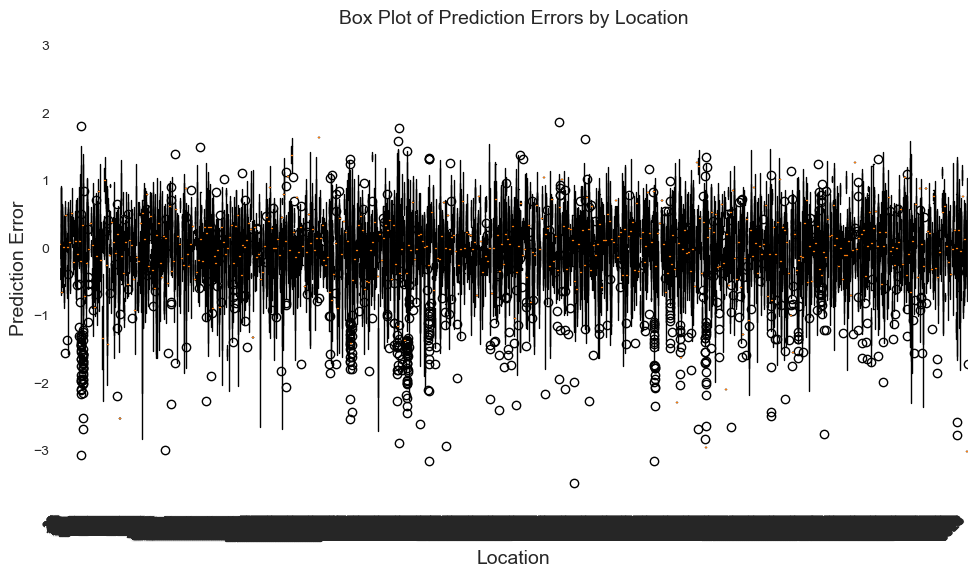

In [357]:
plt.figure(figsize=(10, 6))
decoded_df['Prediction Error'] = prediction_errors
plt.boxplot(decoded_df.groupby('LOCATION_')['Prediction Error'].apply(list).values)
plt.xlabel('Location')
plt.ylabel('Prediction Error')
plt.title('Box Plot of Prediction Errors by Location')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


create a map and add markers for each data point, where the marker color represents the predicted MAG value and the marker icon represents the actual MAG value:

In [373]:
%%time
import folium
from folium.plugins import MarkerCluster

# Create a folium map centered at the mean coordinates
mean_lat, mean_lng = decoded_df['LAT'].mean(), decoded_df['LNG'].mean()
map_object = folium.Map(location=[mean_lat, mean_lng], zoom_start=5)

# Create a marker cluster for both predicted and actual MAG values
marker_cluster = MarkerCluster().add_to(map_object)

# Add markers for predicted and actual MAG values
for index, row in decoded_df.iterrows():
    folium.Marker(location=[row['LAT'], row['LNG']],
                  popup=f'Predicted MAG: {row["PREDICTED_MAG"]}',
                  icon=folium.Icon(color='blue')).add_to(marker_cluster)

    folium.Marker(location=[row['LAT'], row['LNG']],
                  popup=f'Actual MAG: {row["MAG"]}',
                  icon=folium.Icon(color='red')).add_to(marker_cluster)

# Display the map
map_object


CPU times: total: 16.5 s
Wall time: 16.5 s


KeyboardInterrupt: 

In [370]:
map_object.save('map_MAG_PredictedMAG.html')
import webbrowser
webbrowser.open('map_MAG_PredictedMAG.html')

KeyboardInterrupt: 

In [375]:
import folium
from folium.plugins import MarkerCluster

# Create a folium map centered at the mean coordinates
mean_lat, mean_lng = decoded_df['LAT'].mean(), decoded_df['LNG'].mean()
map_object = folium.Map(location=[mean_lat, mean_lng], zoom_start=5)

# Create a marker cluster for both predicted and actual MAG values
marker_cluster = MarkerCluster().add_to(map_object)

# Define how many markers you want to show (for example, every 100th row)
marker_step = 100

# Create a list to store markers
marker_list = []

# Loop through the DataFrame
for index, row in decoded_df.iterrows():
    if index % marker_step == 0:  # Only add markers for every Nth row
        predicted_marker = folium.Marker(
            location=[row['LAT'], row['LNG']],
            popup=f'Predicted MAG: {row["PREDICTED_MAG"]}',
            icon=folium.Icon(color='blue')
        )
        
        actual_marker = folium.Marker(
            location=[row['LAT'], row['LNG']],
            popup=f'Actual MAG: {row["MAG"]}',
            icon=folium.Icon(color='red')
        )
        
        marker_list.extend([predicted_marker, actual_marker])

# Add all markers to the marker cluster
for marker in marker_list:
    marker.add_to(marker_cluster)

# Display the map
map_object


In [376]:
map_object.save('map_MAG_PredictedMAG.html')
import webbrowser
webbrowser.open('map_MAG_PredictedMAG.html')

True

on the map on html page, it shows predicted mag and actual mag values on locations

plot the predicted MAG and MAG values on the Turkey map:

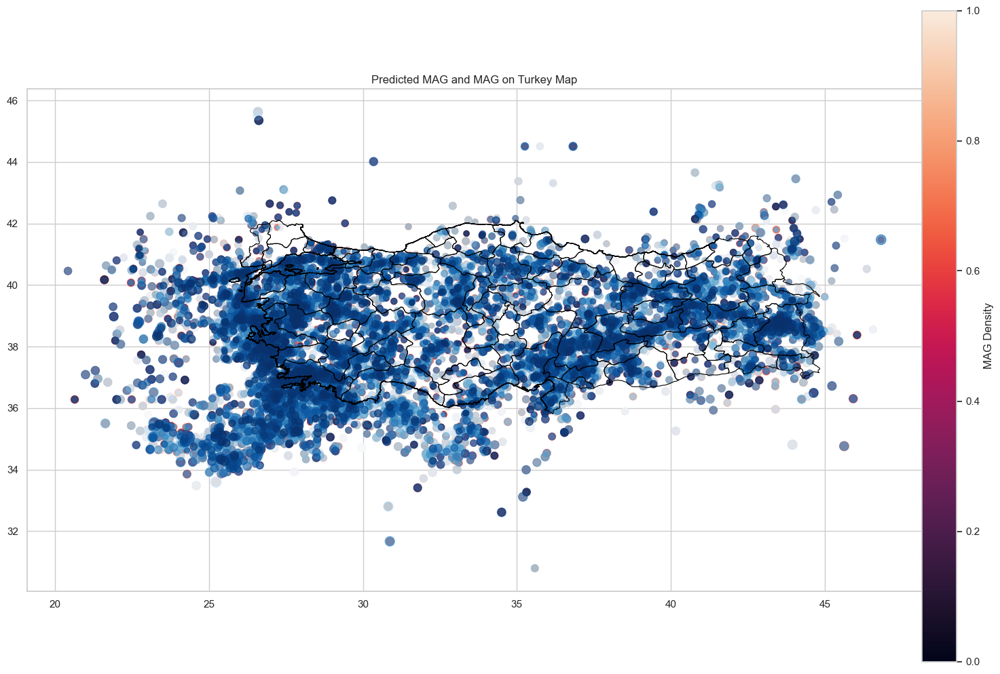

In [464]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the shapefile of Turkey
turkey_map = gpd.read_file("D:\ThomasMoreStudy\Fase-5-(F2-Semester-2)\PythonforA.I.(YT6408-2023)\Project/gadm41_TUR_1.shp")

# Create a GeoDataFrame from the DataFrame with latitude and longitude information
gdf = gpd.GeoDataFrame(decoded_df, geometry=gpd.points_from_xy(decoded_df['LNG'], decoded_df['LAT']))

# Set up the plot
fig, ax = plt.subplots(figsize=(17, 12))
turkey_map.boundary.plot(ax=ax, linewidth=0.8, color='black')

# Plot the predicted MAG values with larger markers and higher transparency
predicted_plot = gdf.plot(ax=ax, markersize=decoded_df['PREDICTED_MAG'] * 20, cmap='Reds', alpha=0.7, label='Predicted MAG')

# Plot the actual MAG values with larger markers and higher transparency
actual_plot = gdf.plot(ax=ax, markersize=decoded_df['MAG'] * 20, cmap='Blues', alpha=0.7, label='MAG')

# Set the title
plt.title("Predicted MAG and MAG on Turkey Map")

# Add a colorbar and legend
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])  # [x, y, width, height]
plt.colorbar(predicted_plot.get_children()[0], cax=cax)
cax.set_ylabel('MAG Density')

# Show the plot
plt.show()


# end of the project notes:

For the AI project ProjectAIEartquake.ipynb:
- PyCharm used with anaconda environment(conda) as IDE.
- Jupyter Notebook was used.
- As a result, I would choose XGBRegressor model from XGBoost(eXtreme Gradient Boosting library) because it is very well fitted to large dataset of our project, and for performance matter, it is quite well and fast. Being its MAE the least on test set I would choose this model.